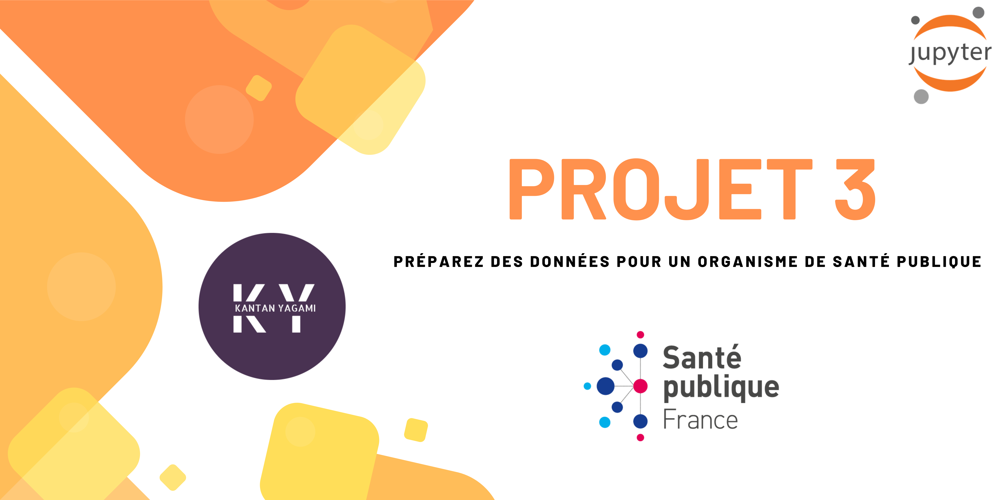

<h1> Rappel du contexte </h1>

L'agence Santé publique France souhaite améliorer sa base de données Open Food Facts.

Cette base de données open source est mise à la disposition de particuliers et d’organisations afin de leur permettre de connaître la qualité nutritionnelle de produits. 

<h1> Rappel de l'objectif </h1>

Création d’un système de suggestion ou d’auto-complétion pour aider les usagers à remplir plus efficacement la base de données.

<h1>Table des matières</h1>

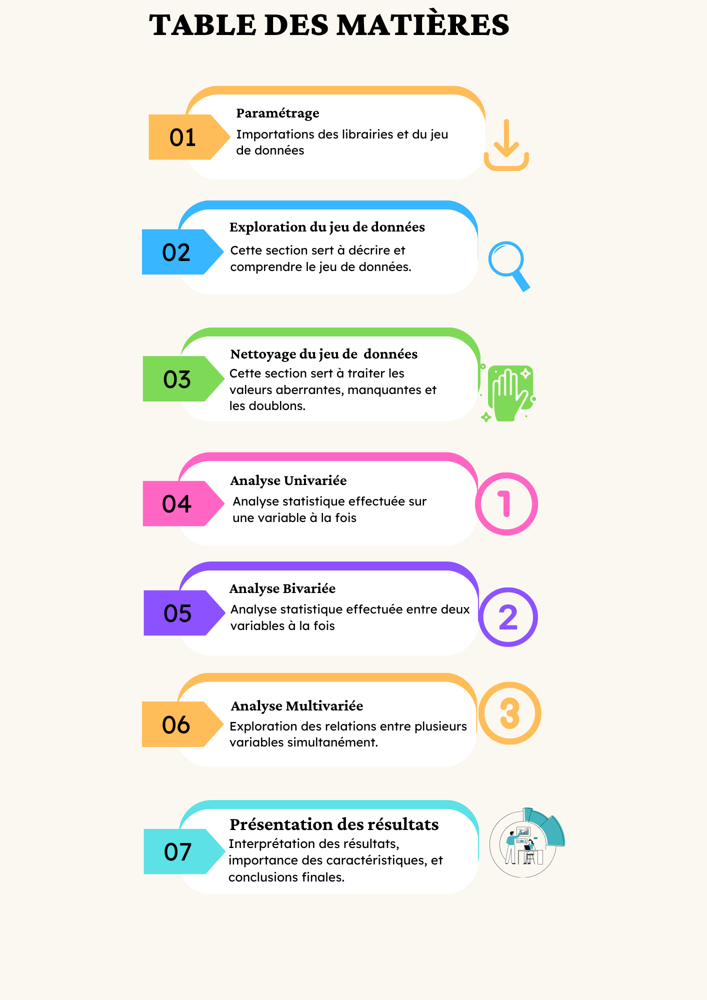

<h1>01 .Paramétrage</h1>

Importations des librairies et du jeu de données

In [1]:
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.collections import LineCollection

import seaborn as sns

import missingno as msno

import re 

from math import sqrt

from tqdm import tqdm

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import MissingIndicator, KNNImputer,SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import scipy.stats as stats

from statsmodels.stats.diagnostic import lilliefors
import statsmodels.api as sm

import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

import pip

from IPython.display import IFrame

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\NEXUS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\NEXUS\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\NEXUS\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
C:\Users\NEXUS\anaconda3\Lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Importation du jeu de données

In [2]:
products_data = pd.read_csv('products.csv', delimiter='\t',  encoding='utf-8')

<h1>02 - Exploration du jeu de données</h1>

<h3><right>Cette section sert à décrire et comprendre le jeu de données</right></h3>

<h4>A. Affichage des cinq premières lignes de notre DataFrame : </h4>

In [3]:
products_data.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h4>B. Affichage les informations de notre DataFrame : </h4>

In [4]:
products_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


<h4>C. Affichage du nombre de lignes et de colonnes dans le Data Frame :</h4>

In [5]:
print("Nombre de colonnes :", products_data.shape[1])
print("Nombre de lignes :", products_data.shape[0])

Nombre de colonnes : 162
Nombre de lignes : 320772


<h4>D. Affichage des types de données de chaque colonne : </h4>

In [6]:
print("Nombre de types de données :")
data_types = products_data.dtypes.value_counts()
print(data_types)

Nombre de types de données :
float64    106
object      56
dtype: int64


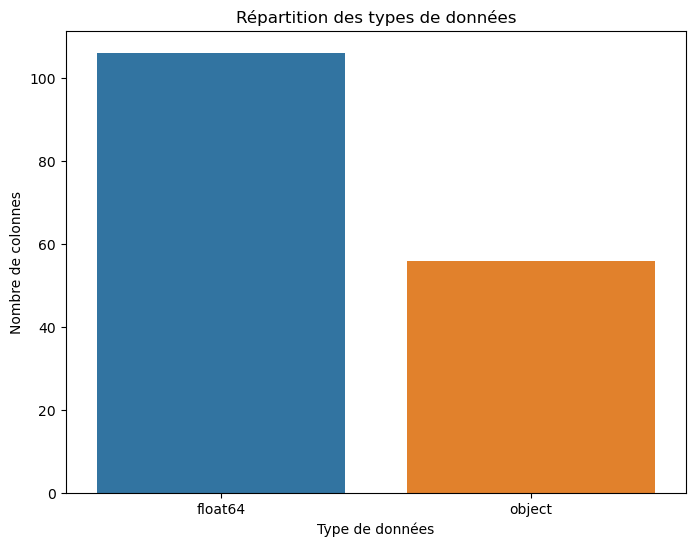

In [7]:
# Compter le nombre de types de données
data_types = products_data.dtypes.value_counts()

# Créer le diagramme à barres
plt.figure(figsize=(8, 6))
sns.barplot(x=data_types.index, y=data_types.values)
plt.xlabel('Type de données')
plt.ylabel('Nombre de colonnes')
plt.title('Répartition des types de données')
plt.show()

<h4>E. Affichage des statistiques descriptives pour chaque colonne numérique (moyenne, médiane, min, max, écart-type, etc.) : </h4>

In [8]:
products_data.describe()

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,248939.000000,0.0,0.0,2.611130e+05,857.000000,243891.000000,...,49.000000,3036.000000,165.000000,948.000000,0.0,268.000000,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,0.055246,NaN,NaN,1.141915e+03,585.501214,12.730379,...,6.425698,31.458587,15.412121,49.547785,NaN,341.700764,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,0.269207,NaN,NaN,6.447154e+03,712.809943,17.578747,...,2.047841,31.967918,3.753028,18.757932,NaN,425.211439,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,3.770000e+02,49.400000,0.000000,...,6.300000,0.000000,12.000000,32.000000,NaN,98.750000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1.100000e+03,300.000000,5.000000,...,7.200000,23.000000,15.000000,50.000000,NaN,195.750000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1.674000e+03,898.000000,20.000000,...,7.400000,51.000000,15.000000,64.250000,NaN,383.200000,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,6.000000,NaN,NaN,3.251373e+06,3830.000000,714.290000,...,8.400000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


<h4>F. Affichage du nombre de valeurs uniques pour chaque colonne catégorielle : </h4>

In [9]:
# Sélectionner les colonnes catégorielles
categorical_columns = products_data.select_dtypes(include='object')

# Calculer le nombre de valeurs uniques pour chaque colonne
unique_values = categorical_columns.nunique()

# Afficher le résultat
print("Nombre de valeurs uniques pour chaque colonne catégorielle :")
print(unique_values)

Nombre de valeurs uniques pour chaque colonne catégorielle :
code                                          320638
url                                           320749
creator                                         3535
created_t                                     189636
created_datetime                              189568
last_modified_t                               180639
last_modified_datetime                        180495
product_name                                  221347
generic_name                                   38584
quantity                                       13826
packaging                                      14547
packaging_tags                                 12064
brands                                         58784
brands_tags                                    50253
categories                                     36982
categories_tags                                21142
categories_fr                                  21152
origins                               

<h4>F. Affichage du nombre de valeurs manquantes pour chaque colonne : </h4>

In [10]:
# Calculer le nombre de valeurs manquantes pour chaque colonne
missing_values = products_data.isnull().sum()

# Afficher le résultat
print("Nombre de valeurs manquantes pour chaque colonne :")
print(missing_values)


Nombre de valeurs manquantes pour chaque colonne :
code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64


<h4>G. Affichage du nombre de valeurs manquantes total : </h4>

In [11]:
# Calculer le nombre total de valeurs manquantes
total_missing = products_data.isnull().sum().sum()

# Afficher le résultat
print("Nombre total de valeurs manquantes :")
print(total_missing)

Nombre total de valeurs manquantes :
39608589


<h4>H. Affichage du nombre de valeurs total : </h4>

In [12]:
total_values = products_data.size
print(total_values)

51965064


<h4>I. Comparaison du nombre total de valeurs avec le nombre de valeurs manquantes : </h4>

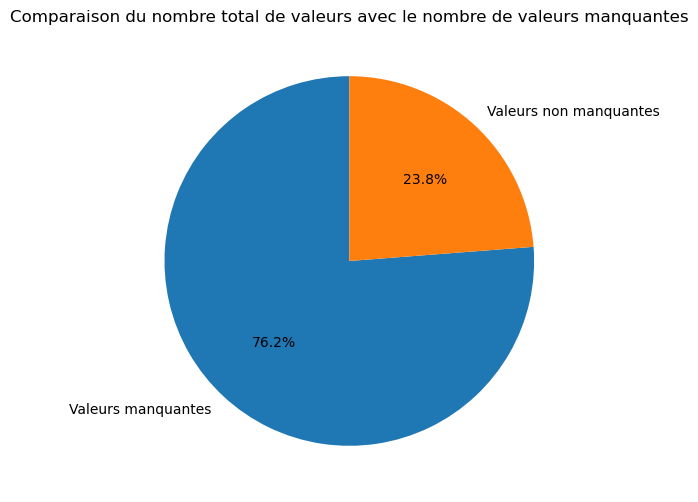

In [13]:
# Créer les labels pour le diagramme
labels = ['Valeurs manquantes', 'Valeurs non manquantes']

# Créer les valeurs pour le diagramme
values = [total_missing, total_values - total_missing]

# Créer le diagramme camembert
plt.figure(figsize=(8, 6))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90)

# Ajouter un titre au diagramme
plt.title("Comparaison du nombre total de valeurs avec le nombre de valeurs manquantes")

# Afficher le diagramme
plt.show()

<h4>J. Liste des variables du dataframe :</h4>

In [14]:
list(products_data.columns)
for col in products_data.columns:
    print(col)

code
url
creator
created_t
created_datetime
last_modified_t
last_modified_datetime
product_name
generic_name
quantity
packaging
packaging_tags
brands
brands_tags
categories
categories_tags
categories_fr
origins
origins_tags
manufacturing_places
manufacturing_places_tags
labels
labels_tags
labels_fr
emb_codes
emb_codes_tags
first_packaging_code_geo
cities
cities_tags
purchase_places
stores
countries
countries_tags
countries_fr
ingredients_text
allergens
allergens_fr
traces
traces_tags
traces_fr
serving_size
no_nutriments
additives_n
additives
additives_tags
additives_fr
ingredients_from_palm_oil_n
ingredients_from_palm_oil
ingredients_from_palm_oil_tags
ingredients_that_may_be_from_palm_oil_n
ingredients_that_may_be_from_palm_oil
ingredients_that_may_be_from_palm_oil_tags
nutrition_grade_uk
nutrition_grade_fr
pnns_groups_1
pnns_groups_2
states
states_tags
states_fr
main_category
main_category_fr
image_url
image_small_url
energy_100g
energy-from-fat_100g
fat_100g
saturated-fat_100g
butyr

<h4>K. Vérification de l'équilibre de notre DataFrame : </h4> 

Il est important de comprendre comment nos données sont réparties, un déséquilibre dans ces données peut avoir un impact sur le rendu final que ce soit sur l'analyse ou le modèle

Dans le cadre de notre objectif, nous avons effectué une recherche approfondie sur les données requises par l'application afin de publier un nouveau produit en ligne.

Cela nous a permis d'en extraire les donnes suivants :

In [15]:
extrate_data = pd.read_csv('Extrate_App_Data.csv', sep=';',  encoding='utf-8')

In [16]:
extrate_data.head()

,Energy,fat,Saturated fat,Carbohydrates,Sugars,Fiber,Proteins,Salt,Silica,Bicarbonate,...,Quantity,Packaging,Brands,Categories,"Labels, certifications, awards",Origin of ingredients,Manufacturing or processing places,Link to the product page on the official site of the producer,Stores,Countries where sold


Nous cherchons desormais des corelations entre variables de nos deux dataframe, pour cela nous allons utiliser la distance de Levenshtein.

C'est une mesure de la similarité entre deux chaînes de caractères.

Elle mesure le nombre minimum d'opérations nécessaires pour transformer une chaîne en une autre en insérant, supprimant ou remplaçant des caractères.

La bibliothèque fuzzywuzzy utilise la distance de Levenshtein pour calculer la similarité entre les chaînes de caractères.

In [17]:
from fuzzywuzzy import fuzz

# Listes des colonnes
extrate_columns = extrate_data.columns.tolist()
products_columns = products_data.columns.tolist()

# Liste des correspondances
correspondences = []

# Seuil de similarité pour considérer une correspondance
threshold = 70

# Parcours les colonnes
for extrate_column in extrate_columns:
    for products_column in products_columns:
        # Calcul de la similarité de Levenshtein
        similarity = fuzz.ratio(extrate_column.lower(), products_column.lower())
        
        # Vérification du seuil de similarité
        if similarity >= threshold:
            correspondences.append((extrate_column, products_column))

# Création du DataFrame des correspondances
correspondences_df = pd.DataFrame(correspondences, columns=["Extrate Column", "Products Column"])

# Affichage des correspondances
print("Correspondances trouvées :")
display(correspondences_df)

Correspondances trouvées :


,Extrate Column,Products Column
0,Energy,energy_100g
1,Saturated fat,saturated-fat_100g
2,Carbohydrates,carbohydrates_100g
3,Sugars,sugars_100g
4,Proteins,proteins_100g
5,Silica,silica_100g
6,Bicarbonate,bicarbonate_100g
7,Potassium,potassium_100g
8,Chloride,chloride_100g
9,Calcium,calcium_100g


Nous pouvons observer des correspondances cohérente en fixant le seuil de similarité a 70%, nous pouvons donc conclure que pour realiser notre objectifs de création d’un système de suggestion ou d’auto-complétion ces features sonts importantes.

Cepandant pour aller plus loin, il parait pertinaint d'analyser la frequances de ces variables et notaments les occurrences

In [18]:
# On souhaite compter les occurrences dans la colonne 'Extrate Column' et 'Products Column'
Extrate_value_counts = correspondences_df['Extrate Column'].value_counts()
Products_value_counts = correspondences_df['Products Column'].value_counts()

# On fait la somme des occurrences
Total_value_counts = Extrate_value_counts.add(Products_value_counts, fill_value=0)

# Création des nouvelles colonnes dans le DataFrame
correspondences_df['Extrate Value count'] = correspondences_df['Extrate Column'].map(Extrate_value_counts)
correspondences_df['Products Value count'] = correspondences_df['Products Column'].map(Products_value_counts)
correspondences_df['Total Value count'] = correspondences_df['Extrate Value count'] + correspondences_df['Products Value count']

# Réorganiser les colonnes dans l'ordre souhaité
columns_order = ['Extrate Column', 'Products Column', 'Extrate Value count', 'Products Value count', 'Total Value count']
correspondences_df = correspondences_df[columns_order]

# Affichage des correspondances
print("Correspondances trouvées :")
display(correspondences_df)

Correspondances trouvées :


,Extrate Column,Products Column,Extrate Value count,Products Value count,Total Value count
0,Energy,energy_100g,1,1,2
1,Saturated fat,saturated-fat_100g,1,1,2
2,Carbohydrates,carbohydrates_100g,1,1,2
3,Sugars,sugars_100g,1,1,2
4,Proteins,proteins_100g,1,1,2
5,Silica,silica_100g,1,1,2
6,Bicarbonate,bicarbonate_100g,1,1,2
7,Potassium,potassium_100g,1,1,2
8,Chloride,chloride_100g,1,1,2
9,Calcium,calcium_100g,1,1,2


Nous nous sommes également renseignés sur le calcul du Nutri-Score. Nous avons étudié les critères et les formules utilisées pour déterminer le Nutri-Score d'un produit, en tenant compte de ses valeurs nutritionnelles. 

Nous avons trouvé ce document PDF sur le site de santé publique France intitulé : "questions-réponses sur le nutri-score - scientifique & technique"

In [19]:
IFrame(src='QR_scientifique_technique_140927.pdf', width='100%', height='600px')

<a href='https://www.santepubliquefrance.fr/media/files/02-determinants-de-sante/nutrition-et-activite-physique/nutri-score/qr-scientifique-technique#:~:text=Le%20calcul%20du%20score%20nutritionnel,%C2%BB%20n%C2%B01169%2F2011.'> Téléchargement du pdf </a> 

Ce document nous as fournis de precieuse informations sur le calcul du Nutri-Score.

Celui ci est basé sur plusieurs variables importantes, notamment :

 Éléments négatifs :
<ul>
<li>Énergie (en kcal)</li>
<li>Sucres simples</li>
<li>Acides gras saturés</li>
<li>Sel</li>
</ul>


Éléments positifs :
<ul>   
<li>Fruits</li>
<li>légumes</li>
<li>légumineuses</li>
<li>fruits à coque</li>
<li>huiles de colza</li>
<li>noix et d'olive</li>
<li>Fibres</li>
<li>Protéines</li>
</ul>

Le score final est calculé en soustrayant les points des éléments positifs des points des éléments négatifs. Le score obtenu est ensuite converti en une lettre de A (meilleur score) à E (pire score).

Il est également important de noter que le Nutri-Score est calculé sur la base du produit tel qu'il est vendu, et non tel qu'il est préparé. Pour les produits composés, le Nutri-Score est calculé sur la base de la recette. Pour les aliments liquides, le score est calculé pour 100 ml et non pour 100 g.

Suite à l'extraction de ces informations sur le Nutri-Score, il paraît pertinent de créé un troisième data frame avec les variables servant au calcul du Nutri-Score afin de refaire une recherche de corrélations et une analyse de fréquences.

Même si notre objectif est de créer un système de suggestion ou d’auto-complétion pour aider les usagers à remplir plus efficacement la base de données. Il ne faut pas oublier que le but de l'application est de fournir un Nutri-Score a chaque produit de l'application.

In [20]:
nutriscore_df = pd.read_csv('NutriScore_Data.csv', sep=';',  encoding='utf-8')

À présent, nous sommes à la recherche de corrélations entre les variables de nos trois DataFrames.

In [21]:
from fuzzywuzzy import process
import pandas as pd

# Listes des colonnes
extrate_columns = extrate_data.columns.tolist()
products_columns = products_data.columns.tolist()
nutriscore_columns = nutriscore_df.columns.tolist()

# Liste des correspondances
correspondences = []

# Seuil de similarité pour considérer une correspondance
threshold = 70

# Parcours des colonnes
for extrate_column in extrate_columns:
    best_match_products = process.extractOne(extrate_column, products_columns)
    best_match_nutriscore = process.extractOne(extrate_column, nutriscore_columns)
    
    # Vérification du seuil de similarité
    if best_match_products[1] >= threshold and best_match_nutriscore[1] >= threshold:
        correspondences.append((extrate_column, best_match_products[0], best_match_nutriscore[0]))

# Création du DataFrame des correspondances
correspondences_df = pd.DataFrame(correspondences, columns=["Extrate Column", "Products Column", "NutriScore Column"])

# Affichage des correspondances
print("Correspondances trouvées :")
display(correspondences_df)

Correspondances trouvées :


,Extrate Column,Products Column,NutriScore Column
0,Energy,energy_100g,Energy
1,fat,energy-from-fat_100g,saturated fatty acids
2,Saturated fat,monounsaturated-fat_100g,saturated fatty acids
3,Sugars,sugars_100g,Simple sugars
4,Fiber,fiber_100g,fibers
5,Proteins,proteins_100g,Proteins
6,Salt,salt_100g,Salt
7,Fruits‚ vegetables‚ nuts and rapeseed‚ walnut ...,energy-from-fat_100g,rapeseed oils


Procédons à l'analyse de la fréquence de ces variables, en mettant particulièrement l'accent sur les occurrences, en y ajoutant le DataFrame du nutri-score.

In [22]:
# On souhaite compter les occurrences dans les colonnes 'Extrate Column', 'Products Column' et 'NutriScore Column'
Extrate_value_counts = correspondences_df['Extrate Column'].value_counts()
Products_value_counts = correspondences_df['Products Column'].value_counts()
NutriScore_value_counts = correspondences_df['NutriScore Column'].value_counts()

# Création des nouvelles colonnes dans le DataFrame
correspondences_df['Extrate Value count'] = correspondences_df['Extrate Column'].map(Extrate_value_counts)
correspondences_df['Products Value count'] = correspondences_df['Products Column'].map(Products_value_counts)
correspondences_df['NutriScore Value count'] = correspondences_df['NutriScore Column'].map(NutriScore_value_counts)

# Somme des occurrences pour chaque variable
correspondences_df['Total Value count'] = (
    correspondences_df['Extrate Value count']
    + correspondences_df['Products Value count']
    + correspondences_df['NutriScore Value count']
)

# Réorganisation les colonnes 
columns_order = [
    'Extrate Column',
    'Products Column',
    'NutriScore Column',
    'Extrate Value count',
    'Products Value count',
    'NutriScore Value count',
    'Total Value count'
]
correspondences_df = correspondences_df[columns_order]

# Affichage des correspondances
print("Correspondances trouvées :")
display(correspondences_df)

Correspondances trouvées :


,Extrate Column,Products Column,NutriScore Column,Extrate Value count,Products Value count,NutriScore Value count,Total Value count
0,Energy,energy_100g,Energy,1,1,1,3
1,fat,energy-from-fat_100g,saturated fatty acids,1,2,2,5
2,Saturated fat,monounsaturated-fat_100g,saturated fatty acids,1,1,2,4
3,Sugars,sugars_100g,Simple sugars,1,1,1,3
4,Fiber,fiber_100g,fibers,1,1,1,3
5,Proteins,proteins_100g,Proteins,1,1,1,3
6,Salt,salt_100g,Salt,1,1,1,3
7,Fruits‚ vegetables‚ nuts and rapeseed‚ walnut ...,energy-from-fat_100g,rapeseed oils,1,2,1,4


Après notre analyse, nous sommes en mesure de conclure que les correspondances entre le DataFrame d'origine et celui des données requises par l'application revêtent une importance significative en tant que caractéristiques (features). Cependant, étant donné que l'objectif de l'application est de calculer un "nutriscore" pour chaque produit, les correspondances entre nos trois DataFrames sont des valeurs extrêmement cruciales.

Voici un graphique qui présente le nombre de valeurs importantes et très importantes contenues dans notre DataFrame d'origine. Pour le réaliser, nous avons repris la logique du code que nous avions développé précédemment, puis nous l'avons adaptée afin de générer ce graphique.

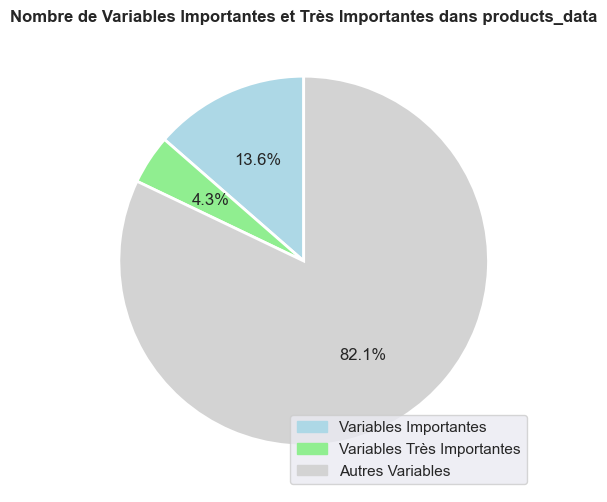

In [23]:
# Listes des colonnes
extrate_columns = extrate_data.columns.tolist()
products_columns = products_data.columns.tolist()
nutriscore_columns = nutriscore_df.columns.tolist()

# Liste des correspondances pour les variables importantes
correspondences_importantes = []

# Seuil de similarité pour considérer une correspondance
threshold = 70

# Parcours des colonnes
for extrate_column in extrate_columns:
    for products_column in products_columns:
        # Calcul de la similarité de Levenshtein
        similarity = fuzz.ratio(extrate_column.lower(), products_column.lower())
        
        # Vérification du seuil de similarité
        if similarity >= threshold:
            correspondences_importantes.append((extrate_column, products_column))

# Création du DataFrame des correspondances importantes
correspondences_importantes_df = pd.DataFrame(correspondences_importantes, columns=["Extrate Column", "Products Column"])

# Liste des correspondances pour les variables très importantes
correspondences_tres_importantes = []

# Parcours des colonnes
for extrate_column in extrate_columns:
    best_match_products = process.extractOne(extrate_column, products_columns)
    best_match_nutriscore = process.extractOne(extrate_column, nutriscore_columns)
    
    # Vérification du seuil de similarité
    if best_match_products[1] >= threshold and best_match_nutriscore[1] >= threshold:
        correspondences_tres_importantes.append((extrate_column, best_match_products[0], best_match_nutriscore[0]))

# Création du DataFrame des correspondances très importantes
correspondences_tres_importantes_df = pd.DataFrame(correspondences_tres_importantes, columns=["Extrate Column", "Products Column", "NutriScore Column"])

# Nombre de variables importantes dans products_data
nb_variables_importantes = len(correspondences_importantes_df['Products Column'].unique())

# Nombre de variables très importantes dans products_data
nb_variables_tres_importantes = len(correspondences_tres_importantes_df['Products Column'].unique())

# Nombre total de variables dans products_data
nb_variables_total = len(products_data.columns)

# Calcul du nombre de variables non importantes
nb_variables_non_importantes = nb_variables_total - nb_variables_importantes - nb_variables_tres_importantes

# Labels pour le camembert
sizes = [nb_variables_importantes, nb_variables_tres_importantes, nb_variables_non_importantes]
colors = ['lightblue', 'lightgreen', 'lightgrey']

# Création du camembert avec Seaborn
plt.figure(figsize=(8, 6))
sns.set()
sns.set_palette(colors)
plt.pie(sizes, labels=None, startangle=90, autopct='%1.1f%%', wedgeprops={'linewidth': 2, 'edgecolor': 'white'})

# Ajouter de la légende
legend_labels = ['Variables Importantes', 'Variables Très Importantes', 'Autres Variables']
legend_handles = [plt.Rectangle((0, 0), 1, 1, color=color) for color in colors]
plt.legend(legend_handles, legend_labels, loc='lower right')

# Ajout du titre
plt.title('Nombre de Variables Importantes et Très Importantes dans products_data', fontweight='bold')

# Afficher le graphique
plt.show()

Grâce à ce graphique, nous constatons qu'environ 17,9 % des variables du DataFrame sont des valeurs importantes. Cela constitue un bon point de départ pour entamer le processus de nettoyage des données.

<h1>03 - Nettoyage du jeu de  données</h1>

 Nous commençons donc par supprimer toutes les variables qui ne nous intéressent pas pour réaliser nos objectifs.

In [24]:
# Liste des colonnes importantes et très importantes
colonnes_importantes = correspondences_importantes_df['Products Column'].tolist()
colonnes_tres_importantes = correspondences_tres_importantes_df['Products Column'].tolist()

# Suppression des colonnes non importantes, sauf 'nutrition_grade_fr'
colonnes_a_supprimer = [colonne for colonne in products_data.columns if colonne not in colonnes_importantes and colonne not in colonnes_tres_importantes and colonne != 'nutrition_grade_fr']
products_data = products_data.drop(columns=colonnes_a_supprimer)

Affichons le nombre de features que nous avons à présent dans notre DataFrame.

In [25]:
list(products_data.columns)
for col in products_data.columns:
    print(col)

code
quantity
packaging
packaging_tags
brands
brands_tags
categories
categories_tags
categories_fr
manufacturing_places
stores
nutrition_grade_fr
energy_100g
energy-from-fat_100g
saturated-fat_100g
monounsaturated-fat_100g
carbohydrates_100g
sugars_100g
fiber_100g
proteins_100g
salt_100g
silica_100g
bicarbonate_100g
potassium_100g
chloride_100g
calcium_100g
magnesium_100g


<h4>A. Detection des valeurs manquantes :</h4>

In [26]:
# Calcul du nombre total de valeurs manquantes
total_missing = products_data.isnull().sum().sum()
missing_values = products_data.isnull().sum()

print("Nombre total de valeurs manquantes :")
print(total_missing)

Nombre total de valeurs manquantes :
5038448


<h4>B. Visualiser des valeurs manquantes</h4>

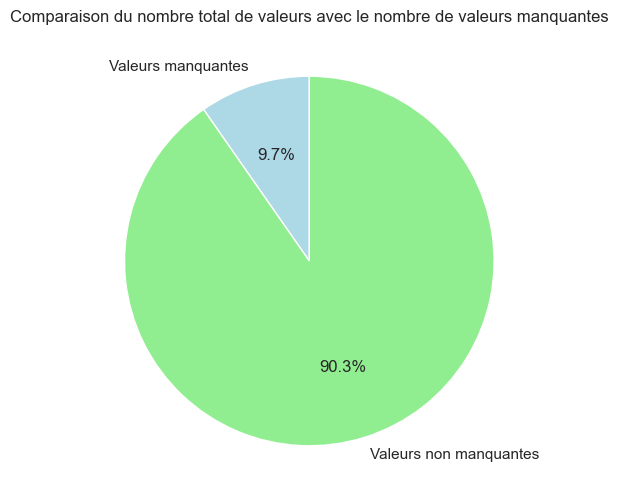

In [27]:
# Création des labels pour le diagramme
labels = ['Valeurs manquantes', 'Valeurs non manquantes']

# Création des valeurs pour le diagramme
values = [total_missing, total_values - total_missing]

# Création du diagramme camembert
plt.figure(figsize=(8, 6))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90)

# Ajout du titre 
plt.title("Comparaison du nombre total de valeurs avec le nombre de valeurs manquantes")

plt.show()

<h5>I. Matrice</h5>

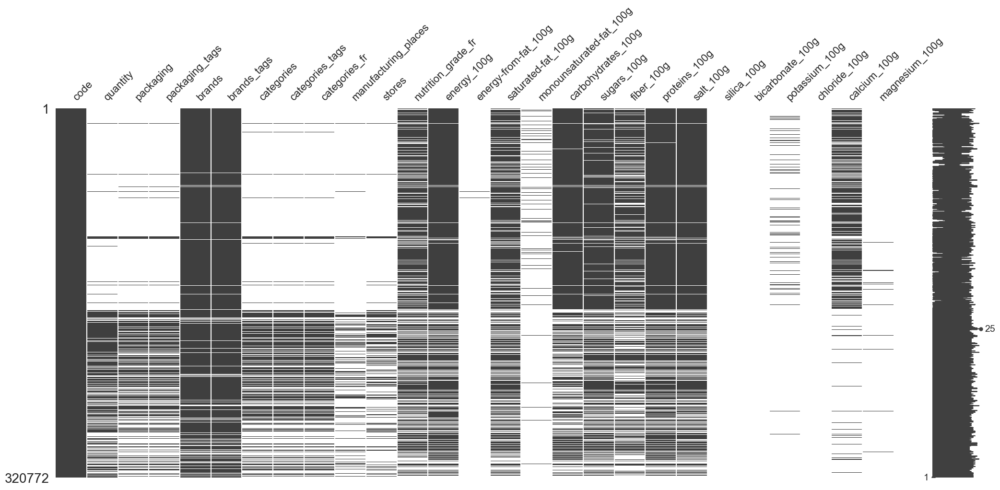

In [28]:
msno.matrix(products_data)
plt.show()

<h5>II.Diagramme en barres</h5>

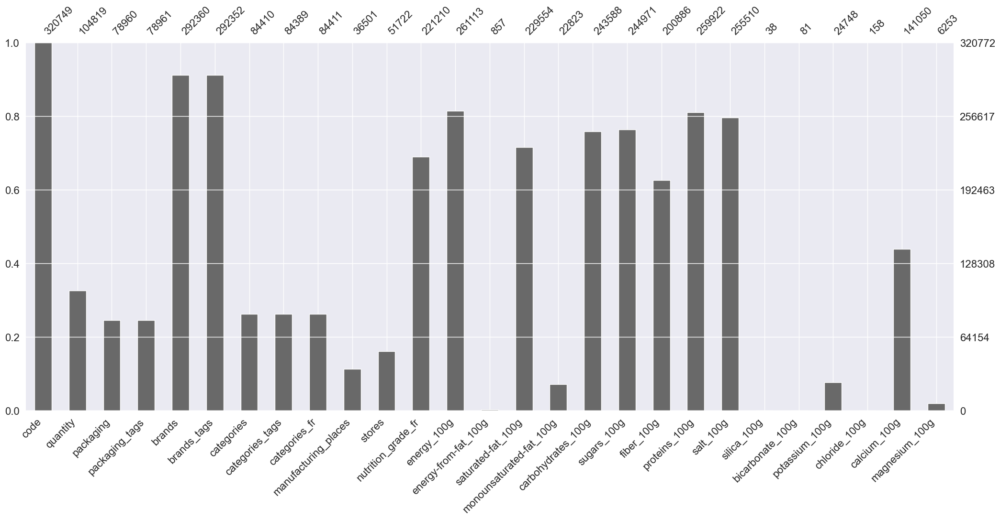

In [29]:
msno.bar(products_data)
plt.show()

<h4>C. Recherche de corrélats pour les valeurs manquantes</h4>

<h5>I. Heatmap ( carte de chaleur)</h5>

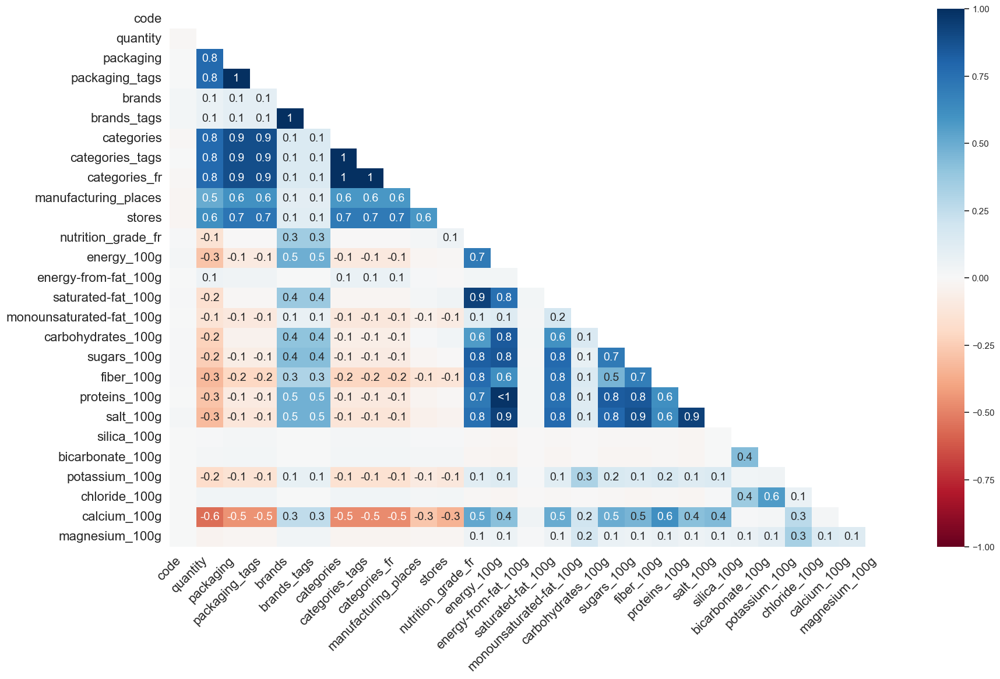

In [30]:
msno.heatmap(products_data)
plt.show()

<h5>II. Dendrogram</h5>

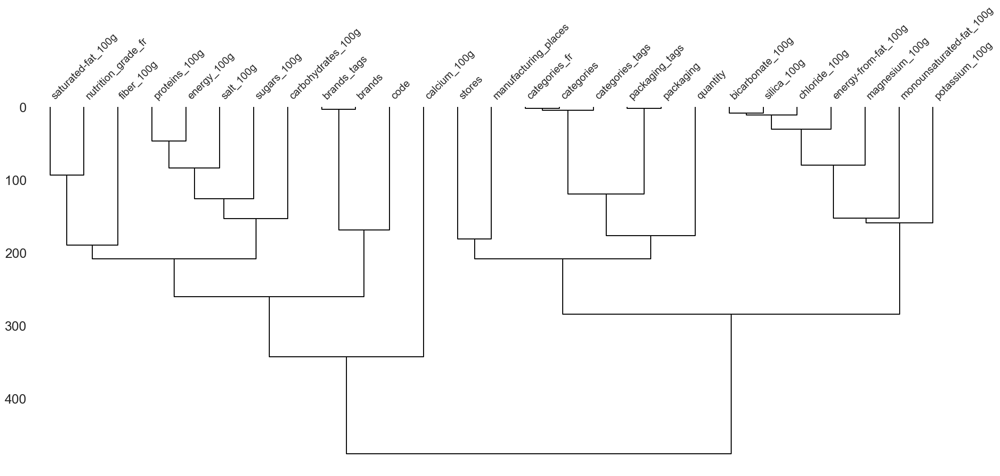

In [31]:
msno.dendrogram(products_data)
plt.show()

<h5>III. Tableau des valeurs manquantes par colonne</h5>

In [32]:
missing_percent = (missing_values / len(products_data)) * 100
missing_table = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percent})
print(missing_table)

                          Missing Values  Percentage
code                                  23    0.007170
quantity                          215953   67.322896
packaging                         241812   75.384385
packaging_tags                    241811   75.384073
brands                             28412    8.857382
brands_tags                        28420    8.859876
categories                        236362   73.685359
categories_tags                   236383   73.691906
categories_fr                     236361   73.685047
manufacturing_places              284271   88.620890
stores                            269050   83.875775
nutrition_grade_fr                 99562   31.038245
energy_100g                        59659   18.598568
energy-from-fat_100g              319915   99.732832
saturated-fat_100g                 91218   28.437021
monounsaturated-fat_100g          297949   92.884977
carbohydrates_100g                 77184   24.061951
sugars_100g                        75801   23.

Dans le cadre de notre analyse, nous avons choisi de ne pas procéder à l'imputation des données lorsque le pourcentage de données manquantes n'est pas supérieur à 30%. Cette décision est basée sur les recommandations scientifiques qui mettent en évidence les risques de biais et de conclusions invalides qui peuvent découler de l'imputation de données manquantes.

Cette approche est soutenue par des recherches dans le domaine, comme le montrent les articles de Dr. Graham et de Dr. Schafer.

<ul>
    <li><a href="https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3668100/">The prevention and handling of the missing data</a></li>
    <li><a href="https://bmcmedresmethodol.biomedcentral.com/articles/10.1186/s12874-017-0442-1"> When and how should multiple imputation be used for handling missing data in randomised clinical trials – a practical guide with flowcharts</a></li>
</ul>

<h5>IV. Trie des valeurs superieurs a 30% de valeurs manquantes</h5>

In [33]:
# Filtrer le tableau pour ne garder que les colonnes avec plus de 30% de valeurs manquantes
filtered_table = missing_table[missing_table['Percentage'] > 30]

# Trier le tableau par pourcentage de manière descendante
sorted_table = filtered_table.sort_values(by='Percentage', ascending=True)


print(sorted_table)

                          Missing Values  Percentage
nutrition_grade_fr                 99562   31.038245
fiber_100g                        119886   37.374210
calcium_100g                      179722   56.027958
quantity                          215953   67.322896
categories_fr                     236361   73.685047
categories                        236362   73.685359
categories_tags                   236383   73.691906
packaging_tags                    241811   75.384073
packaging                         241812   75.384385
stores                            269050   83.875775
manufacturing_places              284271   88.620890
potassium_100g                    296024   92.284863
monounsaturated-fat_100g          297949   92.884977
magnesium_100g                    314519   98.050640
energy-from-fat_100g              319915   99.732832
chloride_100g                     320614   99.950744
bicarbonate_100g                  320691   99.974748
silica_100g                       320734   99.

Il est à noter que certaines valeurs portent des noms similaires. Par conséquent, nous allons procéder à une analyse détaillée de chaque valeur de ces caractéristiques afin de déterminer s'il existe des corrélations.

In [34]:
list(products_data.columns)
print("Colonnes du DataFrame products_data :")
for col in products_data.columns:
    print(col)

Colonnes du DataFrame products_data :
code
quantity
packaging
packaging_tags
brands
brands_tags
categories
categories_tags
categories_fr
manufacturing_places
stores
nutrition_grade_fr
energy_100g
energy-from-fat_100g
saturated-fat_100g
monounsaturated-fat_100g
carbohydrates_100g
sugars_100g
fiber_100g
proteins_100g
salt_100g
silica_100g
bicarbonate_100g
potassium_100g
chloride_100g
calcium_100g
magnesium_100g


In [35]:
# Liste des paires de colonnes similaires
paires_colonnes_similaires = [('brands', 'brands_tags')]

# Créer une liste pour stocker les données des exemples de similarité
donnees_similarite = []

# Parcourir les paires de colonnes similaires
for colonne1, colonne2 in paires_colonnes_similaires:
    similarite = []
    
    # Comparer les valeurs de chaque paire de colonnes
    for i in range(len(products_data)):
        valeur1 = str(products_data[colonne1].iloc[i])
        valeur2 = str(products_data[colonne2].iloc[i])
        
        # Calculer la similarité de Levenshtein
        score = fuzz.ratio(valeur1, valeur2)
        similarite.append(score)
    
    # Calculer la similarité moyenne
    similarite_moyenne = sum(similarite) / len(similarite)
    
    # Trier les similarités par ordre décroissant avec les valeurs correspondantes
    similarite_triee = sorted(zip(similarite, map(str, products_data[colonne1]), map(str, products_data[colonne2])), reverse=True)
    
    # Filtrer les exemples de similarité où la similarité est de 100
    exemples_similarite = [ex for ex in similarite_triee if ex[0] < 100][:5]
    
    # Ajout des exemples de similarité à la liste des données
    for score, valeur1, valeur2 in exemples_similarite:
        donnees_similarite.append({'Colonne 1': colonne1, 'Colonne 2': colonne2, 'Score': score, 'Valeur 1': valeur1, 'Valeur 2': valeur2})

# Calcul de  la moyenne globale de similarité
moyenne_globale = sum(similarite) / len(similarite)

# Création le DataFrame des exemples de similarité
df_similarite = pd.DataFrame(donnees_similarite, columns=['Colonne 1', 'Colonne 2', 'Score', 'Valeur 1', 'Valeur 2'])


print("Exemples de similarité entre colonnes :")
display(df_similarite)


print("Moyenne globale de similarité :", moyenne_globale)

Exemples de similarité entre colonnes :


,Colonne 1,Colonne 2,Score,Valeur 1,Valeur 2
0,brands,brands_tags,97,"tesco, encinger","tesco,encinger"
1,brands,brands_tags,97,"strongbow, heineken","strongbow,heineken"
2,brands,brands_tags,97,berchtesgadener,berchtesgadener
3,brands,brands_tags,97,"amalattea - granarolo,amalattea","amalattea-granarolo,amalattea"
4,brands,brands_tags,96,"yoplait,yopa!","yoplait,yopa"


Moyenne globale de similarité : 76.46042360305762


In [36]:
# Liste des paires de colonnes similaires
paires_colonnes_similaires = [('packaging_tags', 'packaging')]

# Création d'une liste pour stocker les données des exemples de similarité
donnees_similarite = []

# Parcourir les paires de colonnes similaires
for colonne1, colonne2 in paires_colonnes_similaires:
    similarite = []
    
    # Comparer les valeurs de chaque paire de colonnes
    for i in range(len(products_data)):
        valeur1 = str(products_data[colonne1].iloc[i])
        valeur2 = str(products_data[colonne2].iloc[i])
        
        # Calcul de la similarité de Levenshtein
        score = fuzz.ratio(valeur1, valeur2)
        similarite.append(score)
    
    # Calcul de la similarité moyenne
    similarite_moyenne = sum(similarite) / len(similarite)
    
    # Trier les similarités par ordre décroissant avec les valeurs correspondantes
    similarite_triee = sorted(zip(similarite, map(str, products_data[colonne1]), map(str, products_data[colonne2])), reverse=True)
    
    # Filtrer les exemples de similarité où la similarité est de 100
    exemples_similarite = [ex for ex in similarite_triee if ex[0] < 100][:5]
    
    # Ajout des exemples de similarité à la liste des données
    for score, valeur1, valeur2 in exemples_similarite:
        donnees_similarite.append({'Colonne 1': colonne1, 'Colonne 2': colonne2, 'Score': score, 'Valeur 1': valeur1, 'Valeur 2': valeur2})

# Création du DataFrame des exemples de similarité
df_similarite = pd.DataFrame(donnees_similarite)


print("Exemples de similarité entre colonnes :")
display(df_similarite)

# Calcul de la moyenne globale de similarité
moyenne_globale = sum(similarite) / len(similarite)


print("Moyenne globale de similarité :", moyenne_globale)

Exemples de similarité entre colonnes :


,Colonne 1,Colonne 2,Score,Valeur 1,Valeur 2
0,packaging_tags,packaging,98,"пластиковая-бутылка,полиэтилентерефталат","пластиковая бутылка,полиэтилентерефталат"
1,packaging_tags,packaging,98,"vaschetta,coperchio,plastica,banda-stagnata","vaschetta,coperchio,plastica,banda stagnata"
2,packaging_tags,packaging,98,"semi-conservas,bandeja-termo-formada,film,term...","semi-conservas,bandeja termo-formada,film,term..."
3,packaging_tags,packaging,98,"pots,plastique,suremballage-carton,opercule","pots,plastique,suremballage carton,opercule"
4,packaging_tags,packaging,98,"polyethylenterephthalat,84,tetrapack,tetrapack","Polyethylenterephthalat,84,tetrapack,tetrapack"


Moyenne globale de similarité : 96.66047535321037


In [37]:
# Liste des paires de colonnes similaires
paires_colonnes_similaires = [('categories', 'categories_fr'), ('categories', 'categories_tags'), ('categories_fr', 'categories_tags')]

# Création une liste pour stocker les données des exemples de similarité
donnees_similarite = []

# Calcul de la similarité moyenne globale
moyenne_globale = 0

# Parcourir les paires de colonnes similaires
for colonne1, colonne2 in paires_colonnes_similaires:
    similarite = []
    
    # Comparer les valeurs de chaque paire de colonnes
    for i in range(len(products_data)):
        valeur1 = str(products_data[colonne1].iloc[i])
        valeur2 = str(products_data[colonne2].iloc[i])
        
        # Calcul de la similarité de Levenshtein
        score = fuzz.ratio(valeur1, valeur2)
        similarite.append(score)
    
    # Calcul de la similarité moyenne
    similarite_moyenne = sum(similarite) / len(similarite)
    moyenne_globale += similarite_moyenne
    
    # Trier les similarités par ordre décroissant avec les valeurs correspondantes
    similarite_triee = sorted(zip(similarite, map(str, products_data[colonne1]), map(str, products_data[colonne2])), reverse=True)
    
    # Ajout des exemples de similarité à la liste des données
    exemples_similarite = similarite_triee[:5]
    for score, valeur1, valeur2 in exemples_similarite:
        donnees_similarite.append({'Colonne 1': colonne1, 'Colonne 2': colonne2, 'Score': score, 'Valeur 1': valeur1, 'Valeur 2': valeur2})

# Création le DataFrame des exemples de similarité
df_similarite = pd.DataFrame(donnees_similarite)


print("Exemples de similarité entre colonnes :")
display(df_similarite)

# Calcul de la moyenne globale de similarité
moyenne_globale /= len(paires_colonnes_similaires)
print("Moyenne globale de similarité :", moyenne_globale)

Exemples de similarité entre colonnes :


,Colonne 1,Colonne 2,Score,Valeur 1,Valeur 2
0,categories,categories_fr,100,"Édulcorants,Sucres,Sucres roux,Sucres de canne...","Édulcorants,Sucres,Sucres roux,Sucres de canne..."
1,categories,categories_fr,100,"Édulcorants,Sucres,Sucres roux,Sucres de canne...","Édulcorants,Sucres,Sucres roux,Sucres de canne..."
2,categories,categories_fr,100,"Édulcorants,Sucres,Sucres roux,Sucres de canne...","Édulcorants,Sucres,Sucres roux,Sucres de canne..."
3,categories,categories_fr,100,"Édulcorants,Sucres,Sucres roux","Édulcorants,Sucres,Sucres roux"
4,categories,categories_fr,100,"Édulcorants,Sucres,Sucres gélifiant","Édulcorants,Sucres,Sucres gélifiant"
5,categories,categories_tags,100,zh:复原乳,zh:复原乳
6,categories,categories_tags,100,pt:matte,pt:matte
7,categories,categories_tags,100,nan,nan
8,categories,categories_tags,100,nan,nan
9,categories,categories_tags,100,nan,nan


Moyenne globale de similarité : 84.85771098059264


Suite à notre analyse, nous avons constaté que les colonnes "packaging_tags" et "packaging" présentent un seuil de similarité de 98%. De même, les colonnes "categories", "categories_fr" et "categories_tags" affichent un seuil de similarité de 100%. Quant aux colonnes "brands" et "brands_tags", elles présentent un taux de similarité de 76%. Par conséquent, afin d'éviter la redondance des données, nous avons décidé de conserver uniquement les colonnes "categories", "packaging" et "brands".

In [38]:
# Liste des colonnes à retirer
colonnes_a_retirer = ['packaging_tags', 'categories_fr', 'categories_tags', "brands_tags"]

# Supprimer les colonnes du DataFrame
products_data = products_data.drop(columns=colonnes_a_retirer)

# Afficher les colonnes restantes du DataFrame
list(products_data.columns)
print("Colonnes du DataFrame products_data :")
for col in products_data.columns:
    print(col)

Colonnes du DataFrame products_data :
code
quantity
packaging
brands
categories
manufacturing_places
stores
nutrition_grade_fr
energy_100g
energy-from-fat_100g
saturated-fat_100g
monounsaturated-fat_100g
carbohydrates_100g
sugars_100g
fiber_100g
proteins_100g
salt_100g
silica_100g
bicarbonate_100g
potassium_100g
chloride_100g
calcium_100g
magnesium_100g


<h5>V.Visualiser et rechercher les corrélas pour les valeurs manquantes triées</h5>

In [39]:
products_data.head(10)

,code,quantity,packaging,brands,categories,manufacturing_places,stores,nutrition_grade_fr,energy_100g,energy-from-fat_100g,...,sugars_100g,fiber_100g,proteins_100g,salt_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,magnesium_100g
0,3087,1kg,NaN,Ferme t'y R'nao,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,NaN,NaN,NaN,NaN,NaN,NaN,d,2243.0,NaN,...,14.29,3.6,3.57,0.00000,NaN,NaN,NaN,NaN,0.000,NaN
2,4559,NaN,NaN,Torn & Glasser,NaN,NaN,NaN,b,1941.0,NaN,...,17.86,7.1,17.86,0.63500,NaN,NaN,NaN,NaN,0.071,NaN
3,16087,NaN,NaN,Grizzlies,NaN,NaN,NaN,d,2540.0,NaN,...,3.57,7.1,17.86,1.22428,NaN,NaN,NaN,NaN,0.143,NaN
4,16094,NaN,NaN,Bob's Red Mill,NaN,NaN,NaN,NaN,1552.0,NaN,...,NaN,5.7,8.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,16100,NaN,NaN,Unfi,NaN,NaN,NaN,NaN,1933.0,NaN,...,11.54,7.7,13.46,NaN,NaN,NaN,NaN,NaN,0.038,NaN
6,16117,NaN,NaN,Lundberg,NaN,NaN,NaN,NaN,1490.0,NaN,...,NaN,NaN,8.89,NaN,NaN,NaN,NaN,NaN,0.044,NaN
7,16124,NaN,NaN,Daddy's Muesli,NaN,NaN,NaN,c,1833.0,NaN,...,15.62,9.4,14.06,0.13970,NaN,NaN,NaN,NaN,0.062,NaN
8,16193,NaN,NaN,Equal Exchange,NaN,NaN,NaN,NaN,2406.0,NaN,...,42.50,7.5,5.00,NaN,NaN,NaN,NaN,NaN,0.050,NaN
9,16513,NaN,NaN,Napa Valley Naturals,NaN,NaN,NaN,NaN,3586.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


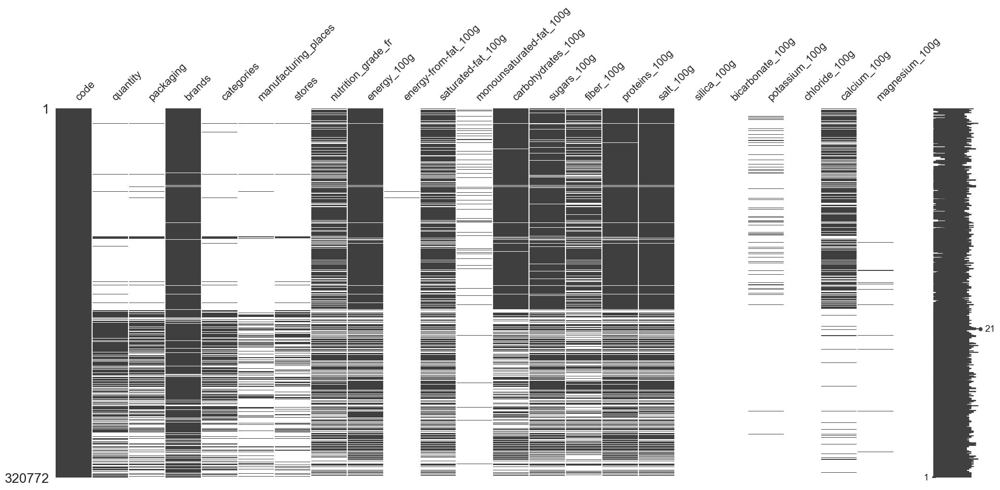

In [40]:
msno.matrix(products_data)
plt.show()

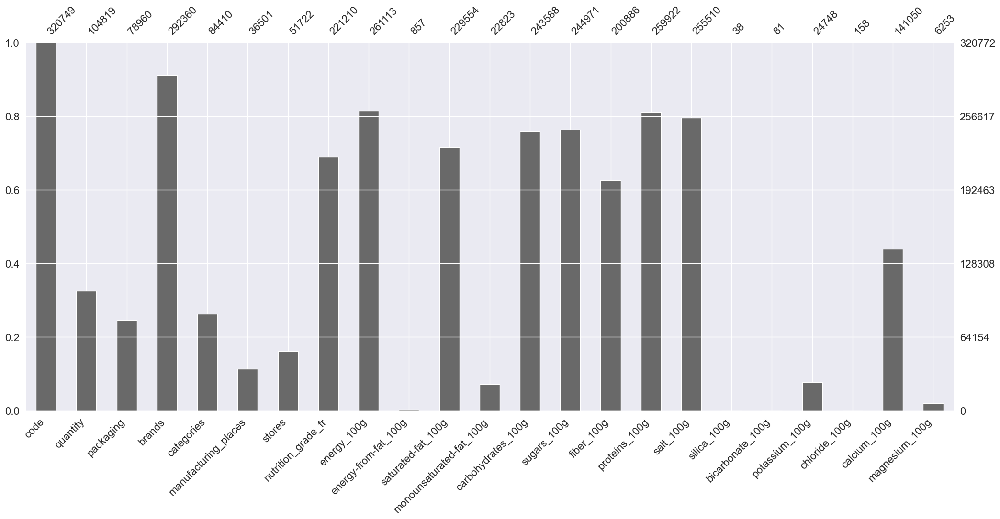

In [41]:
msno.bar(products_data)
plt.show()

<Axes: >

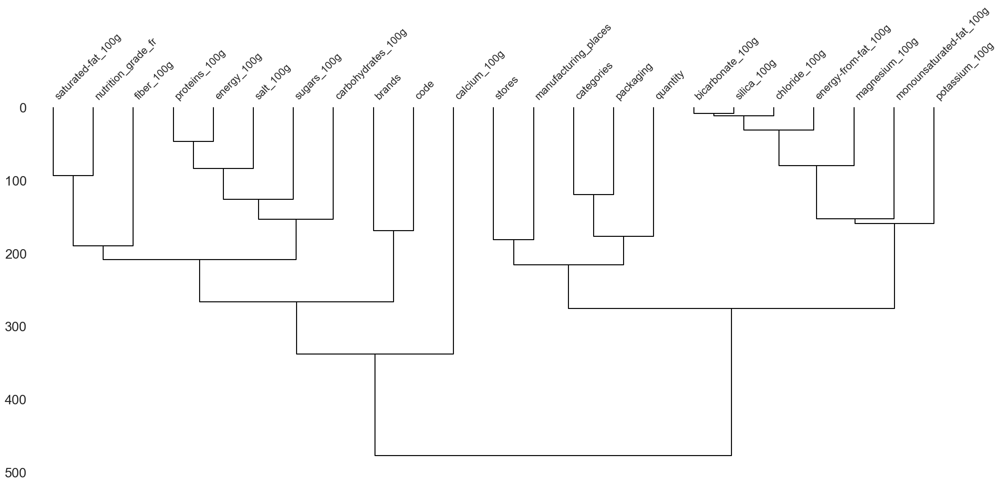

In [42]:
msno.dendrogram(products_data)

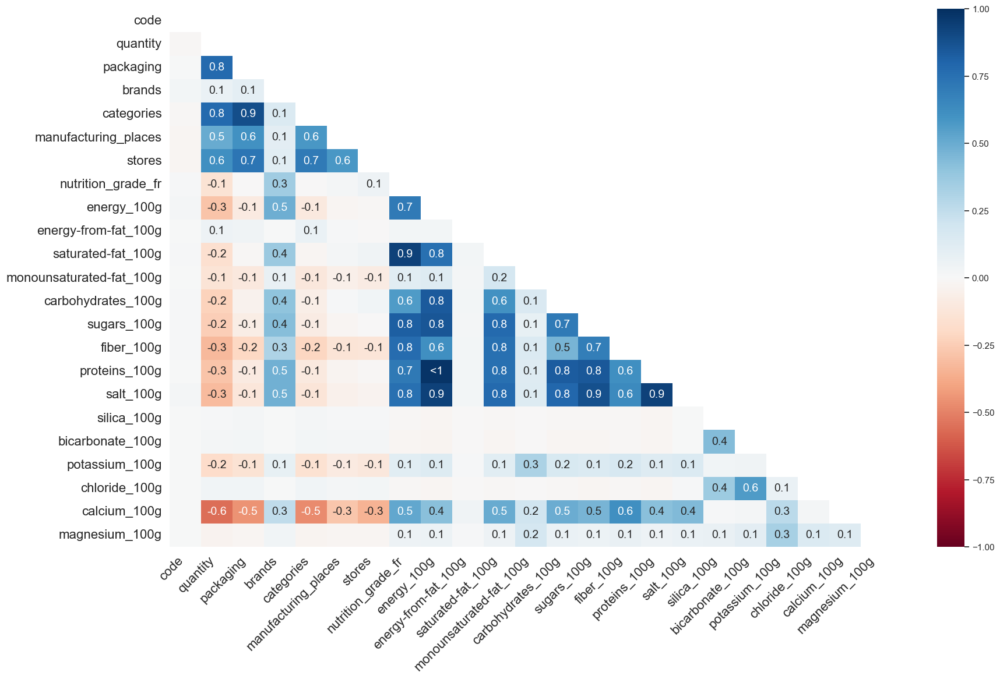

In [43]:
msno.heatmap(products_data)
plt.show()

<h4>D.Gestions des valeurs manquantes</h4>

En analysant nos graphiques, nous pouvons déduire les variables qui sont corrélées entre elles et celles qui ne le sont pas.

Dans notre dendrogramme, nous pouvons distinguer trois groupes de variables qui présentent des corrélations entre elles. Par conséquent, nous pouvons déduire que le type de ces données manquantes serait probablement MNAR (Missing Not At Random).

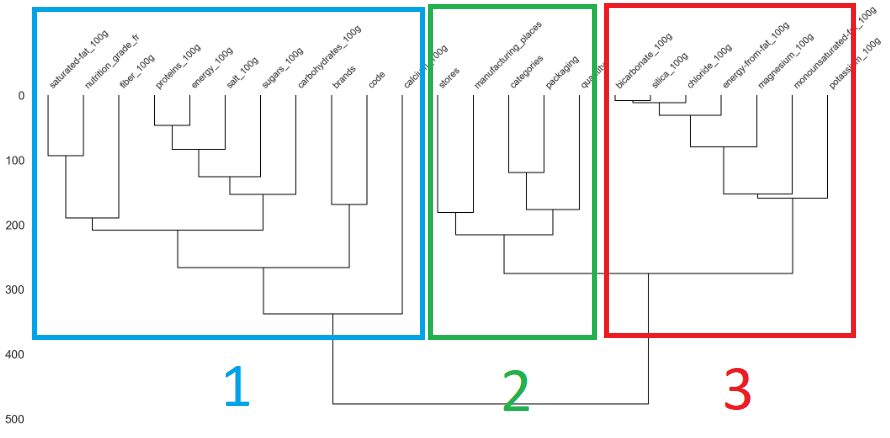

In [44]:
missing_values = products_data.isnull().sum()
missing_percentage = 100 * missing_values / len(products_data)

print(missing_percentage)

code                         0.007170
quantity                    67.322896
packaging                   75.384385
brands                       8.857382
categories                  73.685359
manufacturing_places        88.620890
stores                      83.875775
nutrition_grade_fr          31.038245
energy_100g                 18.598568
energy-from-fat_100g        99.732832
saturated-fat_100g          28.437021
monounsaturated-fat_100g    92.884977
carbohydrates_100g          24.061951
sugars_100g                 23.630803
fiber_100g                  37.374210
proteins_100g               18.969860
salt_100g                   20.345292
silica_100g                 99.988154
bicarbonate_100g            99.974748
potassium_100g              92.284863
chloride_100g               99.950744
calcium_100g                56.027958
magnesium_100g              98.050640
dtype: float64


De plus nous observons que certaine variables on enormement de valeurs manquantes.

<h5>I. Suppression des valeurs manquantes</h5>

Pour les colonnes avec plus de 90% de valeurs manquantes la suppression de ces colonnes represente la meilleure option. Avec autant de valeurs manquantes, ces colonnes sont peu susceptibles de fournir des informations utiles pour notre modèle.

In [45]:
# Création d'une liste des colonnes avec plus de 90% de valeurs manquantes
cols_to_drop = [col for col in products_data.columns 
                if (100 * products_data[col].isnull().sum() / len(products_data)) > 90]

# Supprimer ces colonnes du DataFrame
products_data = products_data.drop(cols_to_drop, axis=1)

In [46]:
list(products_data.columns)
print("Colonnes du DataFrame products_data :")
for col in products_data.columns:
    print(col)

Colonnes du DataFrame products_data :
code
quantity
packaging
brands
categories
manufacturing_places
stores
nutrition_grade_fr
energy_100g
saturated-fat_100g
carbohydrates_100g
sugars_100g
fiber_100g
proteins_100g
salt_100g
calcium_100g


In [47]:
missing_values = products_data.isnull().sum()
missing_percentage = 100 * missing_values / len(products_data)

print(missing_percentage)

code                     0.007170
quantity                67.322896
packaging               75.384385
brands                   8.857382
categories              73.685359
manufacturing_places    88.620890
stores                  83.875775
nutrition_grade_fr      31.038245
energy_100g             18.598568
saturated-fat_100g      28.437021
carbohydrates_100g      24.061951
sugars_100g             23.630803
fiber_100g              37.374210
proteins_100g           18.969860
salt_100g               20.345292
calcium_100g            56.027958
dtype: float64


<h5>II. Imputations des valeurs manquantes</h5>

Après avoir supprimé les caractéristiques avec plus de 90% de valeurs manquantes, nous sommes maintenant confrontés à deux ensembles de variables qui montrent des corrélations entre elles.

<Axes: >

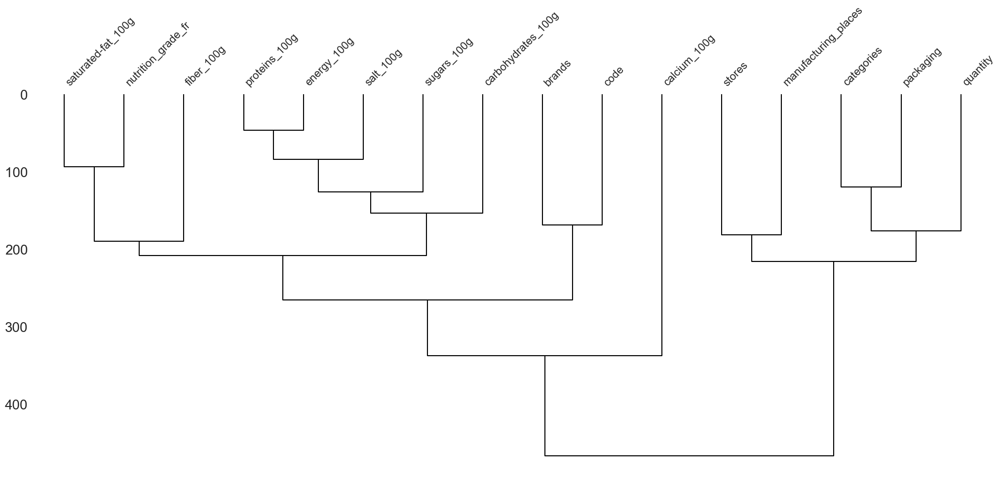

In [48]:
msno.dendrogram(products_data)

Au sein de ces deux groupes, nous disposons de variables à la fois qualitatives et quantitatives.

In [49]:
products_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   code                  320749 non-null  object 
 1   quantity              104819 non-null  object 
 2   packaging             78960 non-null   object 
 3   brands                292360 non-null  object 
 4   categories            84410 non-null   object 
 5   manufacturing_places  36501 non-null   object 
 6   stores                51722 non-null   object 
 7   nutrition_grade_fr    221210 non-null  object 
 8   energy_100g           261113 non-null  float64
 9   saturated-fat_100g    229554 non-null  float64
 10  carbohydrates_100g    243588 non-null  float64
 11  sugars_100g           244971 non-null  float64
 12  fiber_100g            200886 non-null  float64
 13  proteins_100g         259922 non-null  float64
 14  salt_100g             255510 non-null  float64
 15  

Groupe 1 : 

Variables qualitatives :
<ul>
    <li>code</li>
    <li>brands</li>
    <li>nutrition_grade_fr </li>
</ul>

Variables quantitatives :
<ul>
    <li>energy_100g</li>
    <li>saturated-fat_100g</li>
    <li>carbohydrates_100g</li>
    <li>sugars_100g </li>
    <li>fiber_100g</li>
    <li>proteins_100g</li>
    <li>salt_100g</li>
    <li>calcium_100g</li>
</ul>

Groupe 2 : 

Variables qualitatives :
<ul>
    <li>packaging</li>
    <li>categories</li>
    <li>manufacturing_places</li>
    <li>stores</li>
</ul>

Variables quantitatives :
<ul>
    <li>quantity</li>
</ul>

Nous allons utiliser différentes méthodes d'imputation pour voir laquelle fonctionne le mieux pour l'ensemble des données. Cependant, les méthodes d'imputation appropriées diffèrent selon que nous traitons des variables qualitatives ou quantitatives.

Pour les variables qualitatives, nous allons tester les méthodes suivantes :

<ul>
    <li>Imputation par le mode</li>
</ul>

Pour les variables quantitatives, nous allons tester les méthodes suivantes :

<ul>
    <li>Imputation par KNN </li>
    <li>Imputation par IterativeImputer</li>
</ul>

Nous comparerons ensuite les performances de ces différentes méthodes d'imputation pour déterminer laquelle est la plus efficace pour notre ensemble de données.

Ces méthodes d'imputation sont recommandées pour l'imputation des données manquantes de type MNAR (Missing Not At Random).

Dans notre ensemble de données, nous avons une variable quantity qui est actuellement de type object, mais qui contient en réalité des informations quantitatives. Les valeurs dans cette colonne sont des chaînes de caractères qui contiennent à la fois un nombre et une unité, par exemple "1kg".

Pour pouvoir utiliser cette information dans notre analyse, nous devons extraire la partie numérique de ces valeurs. Cela nous permettra de traiter quantity comme une variable quantitative, ce qui est plus approprié étant donné la nature de l'information qu'elle contient.

Pour ce faire, nous allons utiliser des expressions régulières, qui sont un outil puissant pour manipuler et analyser les chaînes de caractères. Nous allons créer une nouvelle fonction qui recherche un nombre dans chaque valeur de quantity et extrait ce nombre. Nous appliquerons ensuite cette fonction à la colonne quantity pour créer une nouvelle colonne quantity_num contenant les valeurs numériques extraites.

In [50]:
products_data['quantity']

0          1kg
1          NaN
2          NaN
3          NaN
4          NaN
          ... 
320767       1
320768     NaN
320769    50 g
320770     67g
320771     NaN
Name: quantity, Length: 320772, dtype: object

De plus nous pouvons observer que nous avons des valeurs en grammes et en kilogrammes dans la même colonne.
Nous allons donc convertir toutes les valeurs en grammes.

In [51]:
def extract_number_and_convert(val):
    if isinstance(val, str):  # vérifie si la valeur est une chaîne
        match = re.search(r'(\d+\.?\d*)\s*(\w+)', val)  # cherche un nombre et une unité dans la chaîne
        if match:
            number = float(match.group(1))  # convertit le nombre en float
            unit = match.group(2)  # extrait l'unité
            if unit == 'kg':  # si l'unité est 'kg', convertit en 'g'
                number *= 1000
            return number
    return val  # si la valeur n'est pas une chaîne ou si aucun nombre n'est trouvé, retourne la valeur originale

# Applique la fonction à la colonne 'quantity'
products_data['quantity'] = products_data['quantity'].apply(extract_number_and_convert)

<h6>a. Imputations par le mode pour les variables qualitatives</h6>

In [52]:
# Sélection des variables qualitatives des deux groupes
qualitative_vars = products_data[['code', 'brands', 'packaging', 'categories', 'manufacturing_places', 'stores']]

# Imputation pour les variables qualitatives
qual_imputer = SimpleImputer(strategy='most_frequent')
qualitative_vars_imputed = qual_imputer.fit_transform(qualitative_vars)

# Convertir le résultat en DataFrame
qualitative_vars_imputed_df = pd.DataFrame(qualitative_vars_imputed, columns=qualitative_vars.columns)

# Réinitialiser les index
qualitative_vars_imputed_df.reset_index(drop=True, inplace=True)
products_data.reset_index(drop=True, inplace=True)

# Mise à jour le DataFrame avec les valeurs imputées
products_data.update(qualitative_vars_imputed_df)

# Vérifier le pourcentage de valeurs manquantes
print(products_data.isnull().mean() * 100)

code                     0.000000
quantity                67.322896
packaging                0.000000
brands                   0.000000
categories               0.000000
manufacturing_places     0.000000
stores                   0.000000
nutrition_grade_fr      31.038245
energy_100g             18.598568
saturated-fat_100g      28.437021
carbohydrates_100g      24.061951
sugars_100g             23.630803
fiber_100g              37.374210
proteins_100g           18.969860
salt_100g               20.345292
calcium_100g            56.027958
dtype: float64


Une exeption est faite pour 'nutrition_grade_fr' qui donne le Nutri-score est un système d'étiquetage nutritionnel à cinq niveaux, allant de A à E et du vert au rouge. La formule exacte n'etant pas disponible et le taux de valeurs manquante etant faible nous allons supprimer les valeurs contenant des NaN 

In [53]:
products_data['nutrition_grade_fr'].isnull().sum()

99562

In [54]:
nombre_valeurs = products_data['nutrition_grade_fr'].count()
print(nombre_valeurs)

221210


In [55]:
# Calcul du nombre de valeurs manquantes et le nombre total de valeurs
valeurs_manquantes = products_data['nutrition_grade_fr'].isnull().sum()
valeurs_totales = products_data['nutrition_grade_fr'].shape[0]

# Calcul du pourcentage de valeurs manquantes
pourcentage_manquantes = (valeurs_manquantes / valeurs_totales) * 100

# Création d'un DataFrame pour l'affichage
df_resume = pd.DataFrame({
    'Colonne': ['nutrition_grade_fr'],
    'Valeurs Manquantes': [valeurs_manquantes],
    'Valeurs Totales': [valeurs_totales],
    'Pourcentage Manquantes (%)': [pourcentage_manquantes]
})

df_resume

,Colonne,Valeurs Manquantes,Valeurs Totales,Pourcentage Manquantes (%)
0,nutrition_grade_fr,99562,320772,31.038245


In [56]:
# Supprimer les lignes où 'nutrition_grade_fr' est manquant
products_data = products_data.dropna(subset=['nutrition_grade_fr'])

In [57]:
# Calcul du nombre de valeurs manquantes et le nombre total de valeurs
valeurs_manquantes = products_data['nutrition_grade_fr'].isnull().sum()
valeurs_totales = products_data['nutrition_grade_fr'].shape[0]

# Calcul du pourcentage de valeurs manquantes
pourcentage_manquantes = (valeurs_manquantes / valeurs_totales) * 100

# Création d'un DataFrame pour l'affichage
df_resume = pd.DataFrame({
    'Colonne': ['nutrition_grade_fr'],
    'Valeurs Manquantes': [valeurs_manquantes],
    'Valeurs Totales': [valeurs_totales],
    'Pourcentage Manquantes (%)': [pourcentage_manquantes]
})

df_resume

,Colonne,Valeurs Manquantes,Valeurs Totales,Pourcentage Manquantes (%)
0,nutrition_grade_fr,0,221210,0.0


<h6>b. Test de differantes methodes d'imputations pour les variables quantitatives</h6>

Afin de comparee la performance des models et de choisir le meilleurs pour realiser l'imputations de nos valeurs manquantes nous allons utiliser 'erreur quadratique moyenne (RMSE).

L'erreur quadratique moyenne (Root Mean Squared Error, RMSE) est une mesure couramment utilisée pour évaluer la précision des modèles.

Elle mesure la moyenne des erreurs au carré, c'est-à-dire la différence entre la valeur prédite par le modèle et la valeur réelle.

La formule pour calculer l'erreur quadratique moyenne est la suivante :

RMSE = sqrt((1/n) * Σ(actual - prediction)²)


<ul>
    <li>sqrt : est la fonction racine carrée</li>
    <li>n : est le nombre total d'observations</li>
    <li>actual : est la valeur réelle de l'observation</li>
    <li>prediction : est la valeur prédite par le modèle pour cette observation</li>
</ul>

In [58]:
variables = ['energy_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'calcium_100g', 'quantity']

**Selection d'un sous ensemble afin de reduire le temps de calcul**

In [59]:
# Sélection dun sous-ensemble de 5% des données
data_subset = products_data.sample(frac=0.05, random_state=42)

# Diviser les données en ensemble d'entraînement et de test
train, test = train_test_split(data_subset, test_size=0.2, random_state=42)

**Comparatifs des de l'imputation par KNN par rapport a IterativeImputer sur nos variables quantitatives :**

In [60]:
# Convertir la colonne quantity en valeurs numériques
train['quantity'] = train['quantity'].str.extract('(\d+)').astype(float)
test['quantity'] = test['quantity'].str.extract('(\d+)').astype(float)

# Création d'un DataFrame pour stocker les résultats
results = pd.DataFrame(columns=['Variable', 'Méthode', 'Erreur', 'Pourcentage d\'erreur'])

# Calcul de l'erreur de prédiction pour chaque méthode d'imputation
for target in variables:
    # Sélectionner les autres variables comme variables explicatives
    features = [col for col in variables if col != target]

    # Suppressionm les lignes avec des valeurs manquantes dans la colonne cible
    train_target = train.dropna(subset=[target])
    test_target = test.dropna(subset=[target])

    for method in ['KNN', 'IterativeImputer']:
        if method == 'KNN':
            imputer = KNNImputer(n_neighbors=3)
        elif method == 'IterativeImputer':
            imputer = IterativeImputer(estimator=LinearRegression())
        
        # Imputer les valeurs manquantes
        train_imputed = imputer.fit_transform(train_target[features])
        test_imputed = imputer.transform(test_target[features])
        
        # Entraîner le modèle sur les données imputées
        model = LinearRegression()
        model.fit(train_imputed, train_target[target])
        
        # Prédire la variable cible sur l'ensemble de test
        predictions = model.predict(test_imputed)
        
        # Calcul de  l'erreur de prédiction
        error = mean_squared_error(test_target[target], predictions)
        
        # Calcul de l'erreur en pourcentage
        range_target = test_target[target].max() - test_target[target].min()
        percent_error = error / range_target * 100
        
        # Ajout des résultats au DataFrame
        results = results.append({'Variable': target, 'Méthode': method, 'Erreur': error, 'Pourcentage d\'erreur': percent_error}, ignore_index=True)

# Afficher les résultats
results

,Variable,Méthode,Erreur,Pourcentage d'erreur
0,energy_100g,KNN,240713.877935,2195.092814
1,energy_100g,IterativeImputer,242318.045681,2209.721372
2,saturated-fat_100g,KNN,32.675519,35.907164
3,saturated-fat_100g,IterativeImputer,33.382720,36.684307
4,carbohydrates_100g,KNN,286.335407,286.335407
5,carbohydrates_100g,IterativeImputer,177581.675108,177581.675108
6,sugars_100g,KNN,213.228943,213.228943
7,sugars_100g,IterativeImputer,221.116365,221.116365
8,fiber_100g,KNN,13.635794,27.271588
9,fiber_100g,IterativeImputer,13.966023,27.932046


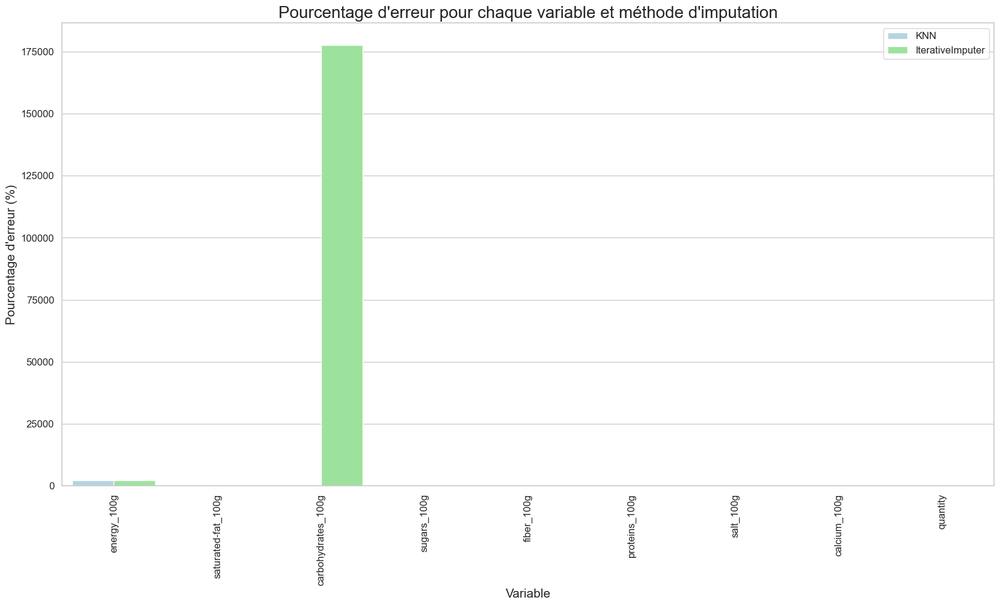

In [61]:
plt.figure(figsize=(20, 10))
sns.set_style("whitegrid") 
sns.barplot(x='Variable', y='Pourcentage d\'erreur', hue='Méthode', data=results)
plt.title('Pourcentage d\'erreur pour chaque variable et méthode d\'imputation', fontsize=20) 
plt.xlabel('Variable', fontsize=15) 
plt.ylabel('Pourcentage d\'erreur (%)', fontsize=15) 
plt.xticks(rotation=90, fontsize=12) 
plt.yticks(fontsize=12)  
plt.legend(fontsize=12) 
plt.show()

<h6>d. Imputations pour les variables quantitatives</h6>

Nous allons créer un nouveau DataFrame pour pouvoir effectuer les imputations en utilisant les méthodes KNN et IterativeImputer.

In [62]:
# Création d'un sous-ensemble de DataFrame avec 5% des données
subset_products_data = products_data.sample(frac=0.05, random_state=1)

En regardant les résultats de l'imputation, on peut voir que certaines variables ont un taux d'erreur élevé. Cela suggère que les méthodes d'imputation que nous avons utilisées, à savoir KNN et IterativeImputer, peuvent ne pas être les meilleures pour ces variables spécifiques.

A savoir : energy_100g, carbohydrates_100g, sugars_100g et quantity

Nous opterons pour une approche par la médiane, sauf pour la variable "quantity", celle-ci ne risquant pas de biaise l'analyse nous obtenons pour une approche par la mise à zéro.

**Approche par la médiane :**

In [63]:
subset_products_data[['energy_100g', 'carbohydrates_100g', 'sugars_100g']] = subset_products_data[['energy_100g', 'carbohydrates_100g', 'sugars_100g']].fillna(subset_products_data.median())

**Approche remplacement par une valeur constante de 0 :**

In [64]:
subset_products_data[['quantity']] = subset_products_data[['quantity']].fillna(0)

In [65]:
print(subset_products_data.isnull().mean() * 100)

code                     0.000000
quantity                 0.000000
packaging                0.000000
brands                   0.000000
categories               0.000000
manufacturing_places     0.000000
stores                   0.000000
nutrition_grade_fr       0.000000
energy_100g              0.000000
saturated-fat_100g       0.090416
carbohydrates_100g       0.000000
sugars_100g              0.000000
fiber_100g              12.432188
proteins_100g            0.090416
salt_100g                0.090416
calcium_100g            38.056058
dtype: float64


On recupere les resultats des comparatifs des de l'imputation par KNN par rapport a IterativeImputer 

On trie les résultats en fonction du taux d'erreur le plus faible pour optimiser l'imputation de valeurs manquantes

In [66]:
# Création un dictionnaire pour stocker la meilleure méthode pour chaque variable
best_method = {}

# Liste des variables
variables = ['saturated-fat_100g','fiber_100g', 'proteins_100g', 'salt_100g', 'calcium_100g']

# Pour chaque variable, trouver la méthode avec le taux d'erreur le plus faible
for variable in variables:
    # Filtrer les résultats pour cette variable
    variable_results = results[results['Variable'] == variable]
    
    # Trouver l'index de la ligne avec le taux d'erreur le plus faible
    best_method_index = variable_results['Erreur'].idxmin()
    
    # Ajouter la méthode correspondante au dictionnaire
    best_method[variable] = variable_results.loc[best_method_index, 'Méthode']

# Afficher le dictionnaire
print(best_method)

{'saturated-fat_100g': 'KNN', 'fiber_100g': 'KNN', 'proteins_100g': 'KNN', 'salt_100g': 'IterativeImputer', 'calcium_100g': 'KNN'}


In [67]:
# Création d'une liste vide pour stocker les variables à imputer avec KNN
knn_variables = []
IterativeImputer_variables = []

# Parcourir le dictionnaire best_method
for variable, method in best_method.items():
    # Si la méthode est KNN, ajouter la variable à la liste knn_variables
    if method == 'KNN':
        knn_variables.append(variable)
    elif method == 'IterativeImputer':
        IterativeImputer_variables.append(variable)

print('KNN variables: ', knn_variables)
print('IterativeImputer variables: ', IterativeImputer_variables)

KNN variables:  ['saturated-fat_100g', 'fiber_100g', 'proteins_100g', 'calcium_100g']
IterativeImputer variables:  ['salt_100g']


Maintenant que nous avons classé nos variables en fonction de la méthode la plus efficace pour traiter les valeurs manquantes, nous allons mettre en œuvre ces méthodes d'imputation.

**Imputation KNN**

In [68]:
# Instanciation de l'imputeur KNN avec 3 voisins
imputer = KNNImputer(n_neighbors=3)

# Liste des colonnes à imputer avec KNN
columns_to_impute = knn_variables

# Imputation des valeurs manquantes avec KNN
for column in columns_to_impute:
    # Utiliser fit_transform pour imputer les valeurs manquantes
    imputed_column = imputer.fit_transform(subset_products_data[[column]].values)
    
    # Assigner la série imputée à la colonne correspondante dans le DataFrame
    subset_products_data[column] = imputed_column

# Vérification du pourcentage de valeurs manquantes restantes
print(subset_products_data.isnull().mean())

code                    0.000000
quantity                0.000000
packaging               0.000000
brands                  0.000000
categories              0.000000
manufacturing_places    0.000000
stores                  0.000000
nutrition_grade_fr      0.000000
energy_100g             0.000000
saturated-fat_100g      0.000000
carbohydrates_100g      0.000000
sugars_100g             0.000000
fiber_100g              0.000000
proteins_100g           0.000000
salt_100g               0.000904
calcium_100g            0.000000
dtype: float64


**Imputation par IterativeImputer**

In [69]:
# Instanciation de l'IterativeImputer
imputer = IterativeImputer(random_state=0)

# Liste des colonnes à imputer avec IterativeImputer
columns_to_impute = IterativeImputer_variables

# Imputation des valeurs manquantes avec IterativeImputer
for column in columns_to_impute:
    # Utiliser fit_transform pour imputer les valeurs manquantes
    imputed_column = imputer.fit_transform(subset_products_data[[column]].values)
    
    # Assigner la série imputée à la colonne correspondante dans le DataFrame
    subset_products_data[column] = imputed_column

# Vérification du pourcentage de valeurs manquantes restantes
print(subset_products_data.isnull().mean())

code                    0.0
quantity                0.0
packaging               0.0
brands                  0.0
categories              0.0
manufacturing_places    0.0
stores                  0.0
nutrition_grade_fr      0.0
energy_100g             0.0
saturated-fat_100g      0.0
carbohydrates_100g      0.0
sugars_100g             0.0
fiber_100g              0.0
proteins_100g           0.0
salt_100g               0.0
calcium_100g            0.0
dtype: float64


<h4>E.Gestion des valeurs aberrantes :</h4>

Nous allons identifier les valeurs aberrantes en utilisant deux méthodes : l'approche interquartile et l'approche Z-score. Notre objectif est de déterminer la méthode la plus adaptée à notre projet.

<h5>1. Approche du métier :</h5>

Pour les valeurs qui doivent être entre 0 et 100g, toute valeur négative ou supérieure à 100g pourrait être considérée comme aberrante. Nous allons donc identifier ces valeurs et les marquer comme NaN.

Nous allons exclure la feature 'energy_100g' car celle ci est généralement exprimée en kilocalories (kcal) ou en kilojoules (kJ), et non en grammes. 

In [70]:
subset_products_data['energy_100g']

293737     110.0
233766     531.0
34210     1435.0
5549       381.0
20969      201.0
           ...  
204167     710.0
296438    2840.0
35837     2178.0
172990     611.0
48414     1079.0
Name: energy_100g, Length: 11060, dtype: float64

On identifie les valeurs aberrantes et on les affiche :

In [71]:
# Liste des colonnes à vérifier
columns_to_check = ['saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'calcium_100g']

# Boucle sur les colonnes
for column in columns_to_check:
    # Identifier les valeurs aberrantes
    outliers = subset_products_data[(subset_products_data[column] < 0) | (subset_products_data[column] > 100)]
    
    # Si il y a des valeurs aberrantes, imprimer les valeurs aberrantes
    if not outliers.empty:
        print(f"Outliers in {column}:")
        print(outliers)
    else:
        print(f"No outliers in {column}")
    
    print("\n")

No outliers in saturated-fat_100g


No outliers in carbohydrates_100g


Outliers in sugars_100g:
             code quantity packaging   brands  \
8582  11213420608        0    Carton  Spartan   

                                      categories manufacturing_places  \
8582  Snacks sucrés,Biscuits et gâteaux,Biscuits               France   

         stores nutrition_grade_fr  energy_100g  saturated-fat_100g  \
8582  Carrefour                  a        151.0                 0.0   

      carbohydrates_100g  sugars_100g  fiber_100g  proteins_100g  salt_100g  \
8582                3.61         -1.2         1.2           2.41    0.38354   

      calcium_100g  
8582         0.096  


No outliers in fiber_100g


No outliers in proteins_100g


Outliers in salt_100g:
                 code quantity packaging     brands  \
287866  7610403069011        0    Carton  Carrefour   
32371     36632038258      5.0    Carton     Dannon   

                                        categories manufacturin

On remplace les valeurs aberrantes par Nan et on revérifie les valeurs aberrantes : 

In [72]:
# Boucle sur les colonnes pour identifier et supprimer les outliers
for column in columns_to_check:
    # Identifier les valeurs aberrantes
    outliers = subset_products_data[(subset_products_data[column] < 0) | (subset_products_data[column] > 100)]
    
    # Supprimer les lignes contenant des valeurs aberrantes
    subset_products_data.drop(outliers.index, inplace=True)

# Boucle sur les colonnes pour afficher les outliers après suppression
for column in columns_to_check:
    # Identifier les valeurs aberrantes
    outliers = subset_products_data[(subset_products_data[column] < 0) | (subset_products_data[column] > 100)]
    
    # Si il y a des valeurs aberrantes, afficher le DataFrame des outliers
    if not outliers.empty:
        display(outliers) 
    else:
        print(f"No outliers in {column}")

No outliers in saturated-fat_100g
No outliers in carbohydrates_100g
No outliers in sugars_100g
No outliers in fiber_100g
No outliers in proteins_100g
No outliers in salt_100g
No outliers in calcium_100g


In [73]:
# Affiche le nombre total de valeurs manquantes dans chaque colonne du DataFrame.
print(subset_products_data.isnull().sum())

code                    0
quantity                0
packaging               0
brands                  0
categories              0
manufacturing_places    0
stores                  0
nutrition_grade_fr      0
energy_100g             0
saturated-fat_100g      0
carbohydrates_100g      0
sugars_100g             0
fiber_100g              0
proteins_100g           0
salt_100g               0
calcium_100g            0
dtype: int64


Selon l'ANSES (Agence nationale de sécurité sanitaire de l'alimentation, de l'environnement et du travail) en France, il n'y a pas de limite maximale spécifique pour l'énergie (en kilocalories ou kilojoules) dans un produit alimentaire.

Cependant, l'ANSES recommande une consommation énergétique quotidienne de 2000 à 2500 kilocalories (ou 8400 à 10500 kilojoules) pour les femmes et de 2500 à 3000 kilocalories (ou 10500 à 12600 kilojoules) pour les hommes, en fonction de leur niveau d'activité physique.

In [74]:
subset_products_data['energy_100g'].describe()

count    11057.000000
mean      1177.907598
std       1005.062631
min          0.000000
25%        448.000000
50%       1159.000000
75%       1701.000000
max      69292.000000
Name: energy_100g, dtype: float64

In [75]:
subset_products_data['energy_100g'].max()

69292.0

In [76]:
subset_products_data['energy_100g'].min()

0.0

In [77]:
subset_products_data['energy_100g'].mean()

1177.9075979017816

In [78]:
subset_products_data['energy_100g'].median()

1159.0

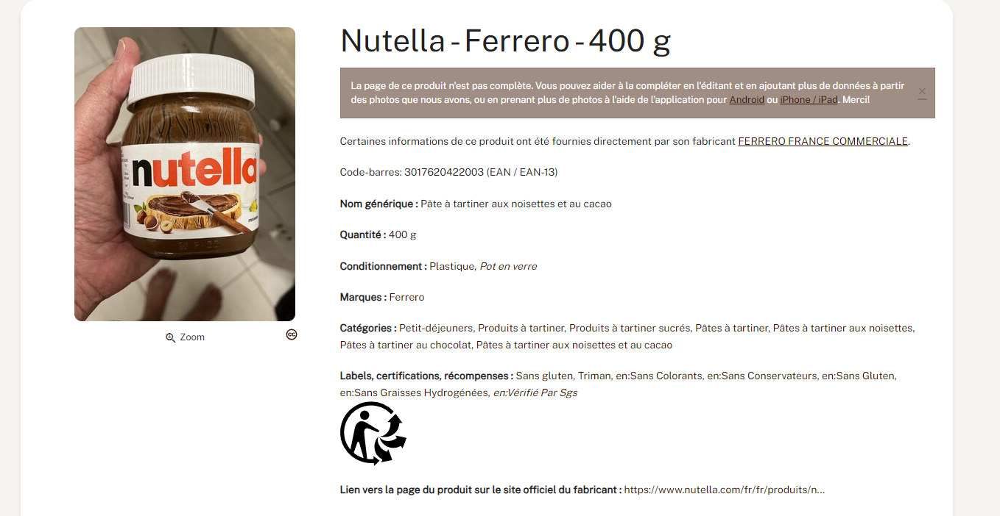

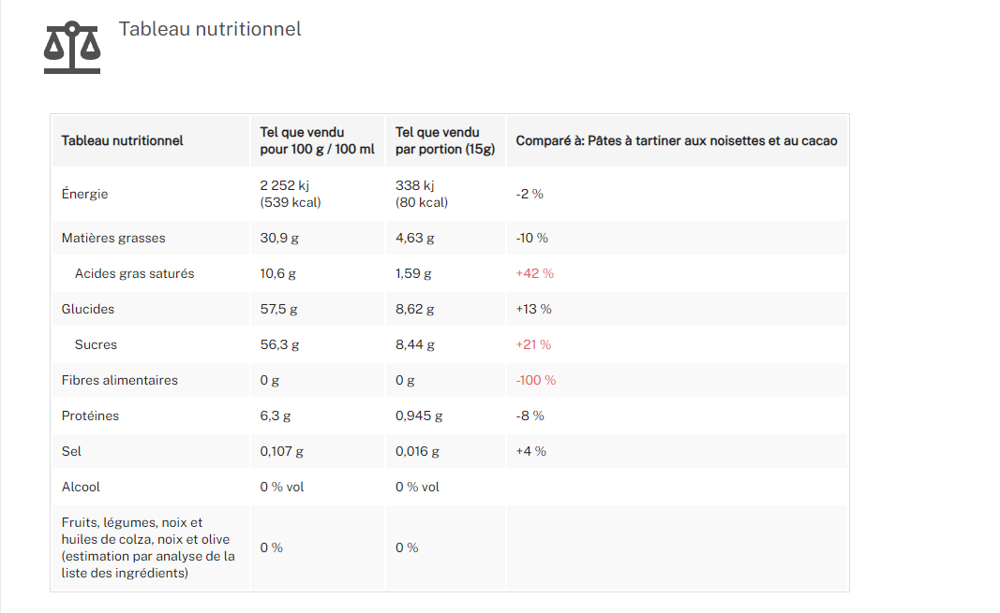

En observant la feature 'energy_100g' et ce que nous avons sur l'applications nous pouvons supposer que celle ci s'exprime kilojoules

Nous allons donc procéder à l'identification des valeurs aberrantes en utilisant différentes méthodes, puis nous sélectionnerons celle qui se révèle la plus efficace.

<h5>1. Boxplot :</h5>

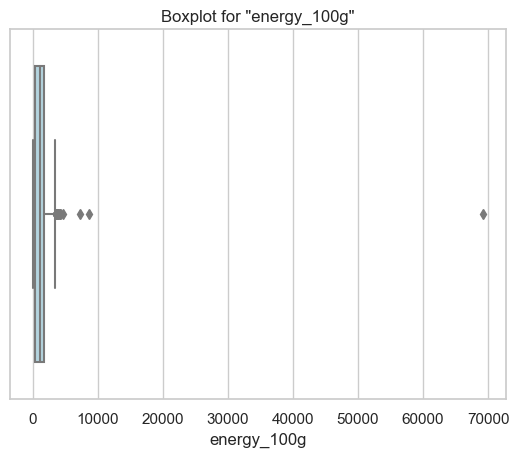

In [79]:
column = 'energy_100g'

sns.boxplot(x=subset_products_data[column])

plt.title('Boxplot for "energy_100g"')
plt.xlabel(column)
plt.show()

<h5>2. Approche de l'interquartile (IQR)</h5>

L'approche IQR se base sur les quartiles pour identifier les valeurs aberrantes. L'IQR est une mesure de la dispersion des données et est calculée comme la différence entre le troisième quartile (Q3) et le premier quartile (Q1). Les valeurs situées en dehors d'une plage spécifiée (souvent définie comme Q1 - 1,5 * IQR à Q3 + 1,5 * IQR) sont considérées comme des valeurs aberrantes et peuvent être traitées de différentes manières, par exemple, en les supprimant ou en les remplaçant.

In [80]:
# Initialiser une liste vide pour stocker les résultats
data_iqr = []

# Définir la colonne à vérifier
column = 'energy_100g'

# Calcul Q1, Q3 et IQR
Q1 = subset_products_data[column].quantile(0.25)
Q3 = subset_products_data[column].quantile(0.75)
IQR = Q3 - Q1

# Définir les limites pour les valeurs aberrantes
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifie les valeurs aberrantes
outliers = subset_products_data[(subset_products_data[column] < lower_bound) | (subset_products_data[column] > upper_bound)].copy()
outliers['Method'] = 'IQR'

# Ajour les résultats à la liste
data_iqr.append(outliers)

# Affiche le nombre de valeurs aberrantes
print(f"Number of outliers in {column}: {len(outliers)}")

Number of outliers in energy_100g: 49


<h5>3. Approche du Z-score :</h5>

L'approche du Z-score est basée sur l'écart par rapport à la moyenne des données, mesuré en termes d'écart-type. Le Z-score d'une observation est calculé en soustrayant la moyenne des données et en divisant par l'écart-type. Les valeurs ayant un Z-score supérieur à un certain seuil (par exemple, 2 ou 3) sont considérées comme des valeurs aberrantes. Elles peuvent être supprimées ou traitées d'une autre manière, en fonction des besoins.

In [81]:
# Initialiser une liste vide pour stocker les résultats
data_z_score = []

# Définir la colonne à vérifier
column = 'energy_100g'

# Calcul de la moyenne et l'écart-type
mean = subset_products_data[column].mean()
std = subset_products_data[column].std()

# Calcul du Z-score
z_scores = (subset_products_data[column] - mean) / std

# Identifier les valeurs aberrantes
outliers_z_score = subset_products_data[(abs(z_scores) > 3)].copy()
outliers_z_score['Method'] = 'Z-score'

# Ajouter les résultats à la liste
data_z_score.append(outliers_z_score)

# Afficher le nombre de valeurs aberrantes
print(f"Number of outliers in {column} using Z-score: {len(outliers_z_score)}")

Number of outliers in energy_100g using Z-score: 6


***Graphique comparatifs :***

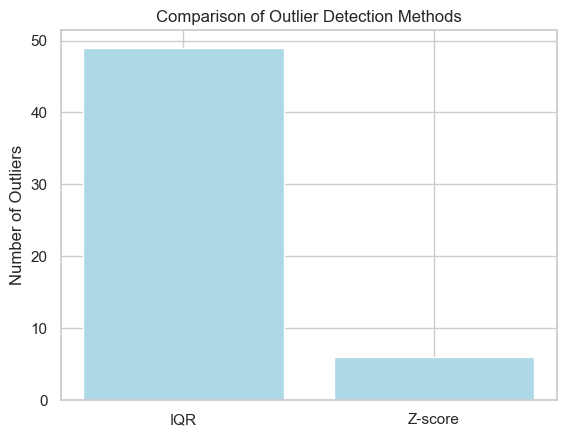

In [82]:
# Calcul du nombre de valeurs aberrantes pour chaque méthode
num_outliers_iqr = len(data_iqr[0])
num_outliers_z_score = len(data_z_score[0])

# Création un diagramme à barres
plt.bar(['IQR', 'Z-score'], [num_outliers_iqr, num_outliers_z_score])

plt.title('Comparison of Outlier Detection Methods')
plt.ylabel('Number of Outliers')
plt.show()

Dans notre analyse, nous avons choisi d'utiliser l'approche de l'intervalle interquartile (IQR) pour détecter et filtrer les valeurs aberrantes.

L'IQR est une méthode robuste qui est moins sensible aux valeurs extrêmes que d'autres méthodes, comme le Z-score.

De plus, l'IQR ne fait pas d'hypothèses sur la distribution des données, ce qui le rend particulièrement adapté à notre ensemble de données.

En comparant les deux méthodes, l'IQR et le Z-score, nous avons observé que l'IQR identifiait légèrement plus de valeurs aberrantes.

Cela suggère que l'IQR pourrait être plus efficace pour détecter les valeurs aberrantes dans notre cas.

In [83]:
# Définir la colonne à vérifier
column = 'energy_100g'

# Calcul Q1, Q3 et IQR
Q1 = subset_products_data[column].quantile(0.25)
Q3 = subset_products_data[column].quantile(0.75)
IQR = Q3 - Q1

# Définir les limites pour les valeurs aberrantes
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtre   valeurs aberrantes
filtered_data = subset_products_data[(subset_products_data[column] >= lower_bound) & (subset_products_data[column] <= upper_bound)]

print(f"Number of data points remaining after outlier removal: {len(filtered_data)}")


Number of data points remaining after outlier removal: 11008


In [84]:
subset_products_data['energy_100g'].count()

11057

<h4>F. Gestion des doublons :</h4>

In [85]:
duplicates = subset_products_data[subset_products_data.duplicated()]

if len(duplicates) > 0:
    print("Notre jeu de données contient", len(duplicates), "doublon(s).")
else:
    print("Notre jeu de données ne contient pas de doublons.")

Notre jeu de données ne contient pas de doublons.


<h1>04 - Analyse Univariée </h1>

Une analyse univariée est utile pour comprendre la distribution de chaque variable, les valeurs extrêmes, et leur variabilité. Cela aide à la sélection des caractéristiques, à la gestion des valeurs manquantes et à la détection des anomalies

Nous allons donc diviser notre analyse univariee en deux points :

<ul>
    <li>Variables qualicatives</li>
    <li>Variables quantitative</li>
</ul>

<h4>A.Variables qualicatives :</h4>

In [86]:
# Liste des variables qualitatives
categorical_columns = ['packaging', 'brands', 'categories', 'manufacturing_places', 'stores']

In [87]:
# Pour chaque variable qualitative
for column in categorical_columns:
    # Calcul les effectifs et les fréquences
    effectifs = subset_products_data[column].value_counts()
    frequences = subset_products_data[column].value_counts(normalize=True)
    
    # Créer un DataFrame avec les modalités, les effectifs et les fréquences
    df = pd.DataFrame({
        column: effectifs.index,
        'Effectifs': effectifs.values,
        'Frequences': frequences.values
    })
    
    # Calcul et afficher des statistiques pour chaque colonne
    print(f"Statistiques pour {column}:")
    print(f"Nombre de modalités uniques : {subset_products_data[column].nunique()}")
    print(f"Mode : {subset_products_data[column].mode().values[0]}")
    print("\n")
    

    display(df.head())

Statistiques pour packaging:
Nombre de modalités uniques : 1215
Mode : Carton




,packaging,Effectifs,Frequences
0,Carton,8451,0.764312
1,"Sachet,Plastique",78,0.007054
2,Plastique,74,0.006693
3,"Bouteille,Plastique",52,0.004703
4,Kunststoff,48,0.004341


Statistiques pour brands:
Nombre de modalités uniques : 5768
Mode : Carrefour




,brands,Effectifs,Frequences
0,Carrefour,370,0.033463
1,Auchan,100,0.009044
2,U,83,0.007507
3,Leader Price,74,0.006693
4,Ahold,66,0.005969


Statistiques pour categories:
Nombre de modalités uniques : 2307
Mode : Snacks sucrés,Biscuits et gâteaux,Biscuits




,categories,Effectifs,Frequences
0,"Snacks sucrés,Biscuits et gâteaux,Biscuits",8227,0.744054
1,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",14,0.001266
2,Biscuits,13,0.001176
3,"Snacks salés,Apéritif,Biscuits apéritifs",11,0.000995
4,"Snacks sucrés,Chocolats,Chocolats au lait",10,0.000904


Statistiques pour manufacturing_places:
Nombre de modalités uniques : 516
Mode : France




,manufacturing_places,Effectifs,Frequences
0,France,10088,0.912363
1,Italie,59,0.005336
2,Suisse,35,0.003165
3,Deutschland,31,0.002804
4,Belgique,31,0.002804


Statistiques pour stores:
Nombre de modalités uniques : 341
Mode : Carrefour




,stores,Effectifs,Frequences
0,Carrefour,9379,0.848241
1,Leclerc,123,0.011124
2,Auchan,118,0.010672
3,Cora,88,0.007959
4,Intermarché,85,0.007687


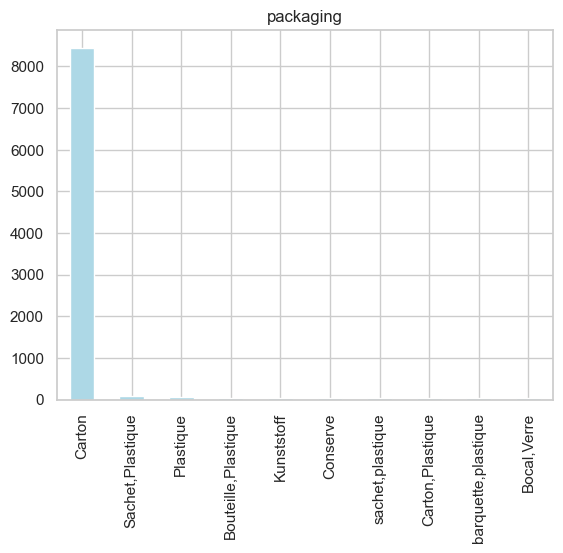

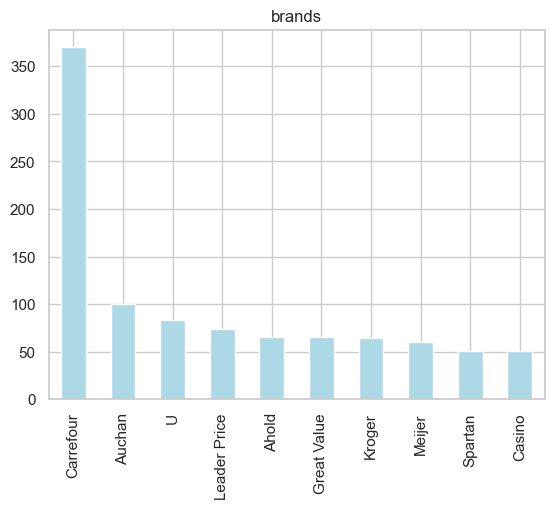

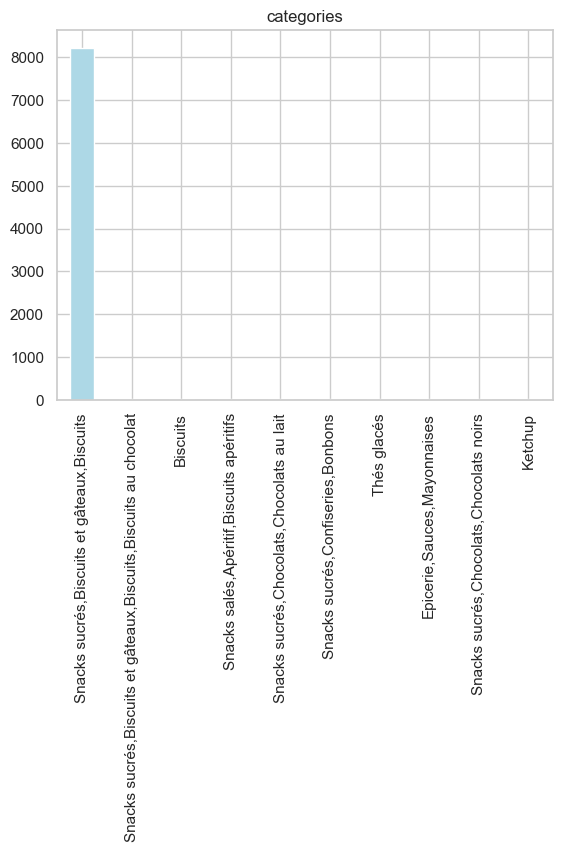

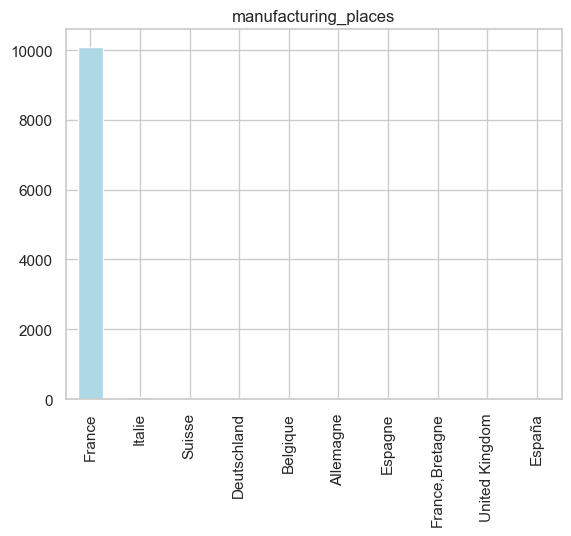

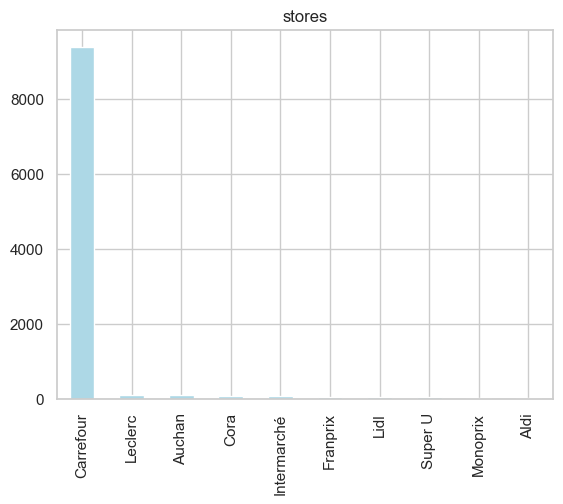

In [88]:
def plot_categorical(data, categorical_columns):
    for column in categorical_columns:
        data[column].value_counts().nlargest(10).plot(kind='bar', title=column)
        plt.show()

plot_categorical(subset_products_data, categorical_columns)

Nous pouvons observer une grande disparité dans nos variables qualitatives, ce qui peut s'expliquer par l'imputation des valeurs manquantes.

Notre jeu de données, n'étant pas de bonne qualité et disposant de nombreuses valeurs manquantes, nécessite un travail supplémentaire.

À l'avenir, nous devrons améliorer notre modèle en prenant en compte les entrées utilisateur pour ces caractéristiques afin d'obtenir de meilleures prédictions. Dans l'état actuel des choses, peu importe la méthode de remplacement des valeurs manquantes, nous ne pouvons pas obtenir de meilleurs résultats pour ces features.

<h4>B.Variables quantitatives :</h4>

In [89]:
subset_products_data.select_dtypes(include=[np.number]).columns.tolist()

['energy_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'calcium_100g']

In [90]:
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']

<h5>1. Calcul des statistiques descriptives :</h5>

In [91]:
from scipy.stats import skew, kurtosis

# Initialiser une liste vide pour stocker les résultats
results = []

# Pour chaque variable quantitative
for column in quantitative_columns:
    # Récupérer les valeurs de la variable
    values = subset_products_data[column].dropna()
    
    # Calculer les statistiques ( variance empirique, variance empirique non biaisé, écart-type,coefficient de variation )
    variance_empirique = values.var()
    variance_empirique_non_biaisé = values.var(ddof=0)
    ecart_type = values.std()
    Coefficient_de_variation = values.std()/values.mean() if values.mean() != 0 else np.nan
    
    # Calculer les mesures de tendance centrale
    moyenne = values.mean()
    mediane = values.median()
    mode = values.mode().values[0] if not values.mode().empty else np.nan
    
    # Calcul  mesures de dispersion
    etendue = values.max() - values.min()
    
    # Calcul mesures de forme
    asymetrie = skew(values)
    aplatissement = kurtosis(values)
    
    # Ajout des résultats à la liste
    results.append({
        'Variable': column,
        'Variance empirique': variance_empirique,
        'Variance empirique non biaisé': variance_empirique_non_biaisé,
        'Ecart type': ecart_type,
        'Coefficient de variation': Coefficient_de_variation,
        'Moyenne': moyenne,
        'Mediane': mediane,
        'Mode': mode,
        'Etendue': etendue,
        'Asymetrie': asymetrie,
        'Aplatissement': aplatissement
    })

# Création un DataFrame avec les résultats
df_results = pd.DataFrame(results)


df_results

,Variable,Variance empirique,Variance empirique non biaisé,Ecart type,Coefficient de variation,Moyenne,Mediane,Mode,Etendue,Asymetrie,Aplatissement
0,energy_100g,1.010151e+06,1.010060e+06,1005.062631,0.853261,1177.907598,1159.000000,2092.000000,69292.000,28.355100,1906.403045
1,saturated-fat_100g,5.468336e+01,5.467841e+01,7.394820,1.504755,4.914301,1.790000,0.000000,95.000,3.218898,20.485456
2,carbohydrates_100g,7.402521e+02,7.401852e+02,27.207575,0.839483,32.409918,23.880000,23.880000,100.000,0.561069,-0.970861
3,sugars_100g,3.917629e+02,3.917275e+02,19.793002,1.324806,14.940303,5.000000,0.000000,100.000,1.691793,2.421697
4,fiber_100g,1.684129e+01,1.683977e+01,4.103814,1.490537,2.753245,2.000000,0.000000,83.300,4.950825,46.621132
5,proteins_100g,6.374278e+01,6.373701e+01,7.983907,1.037033,7.698799,5.620000,0.000000,90.000,2.034482,7.958028
6,salt_100g,2.004712e+01,2.004531e+01,4.477401,3.464052,1.292533,0.647000,0.000000,100.000,14.667409,262.969838
7,calcium_100g,1.979919e-02,1.979740e-02,0.140710,1.512186,0.093050,0.093049,0.093049,2.105,5.178047,37.172979


<h5>2. Mesures de concentration :</h5>

La mesure de concentration est utilisée pour évaluer la dispersion ou l'inégalité dans un ensemble de données.

<h6>I . Courbe de Lorenz</h6>

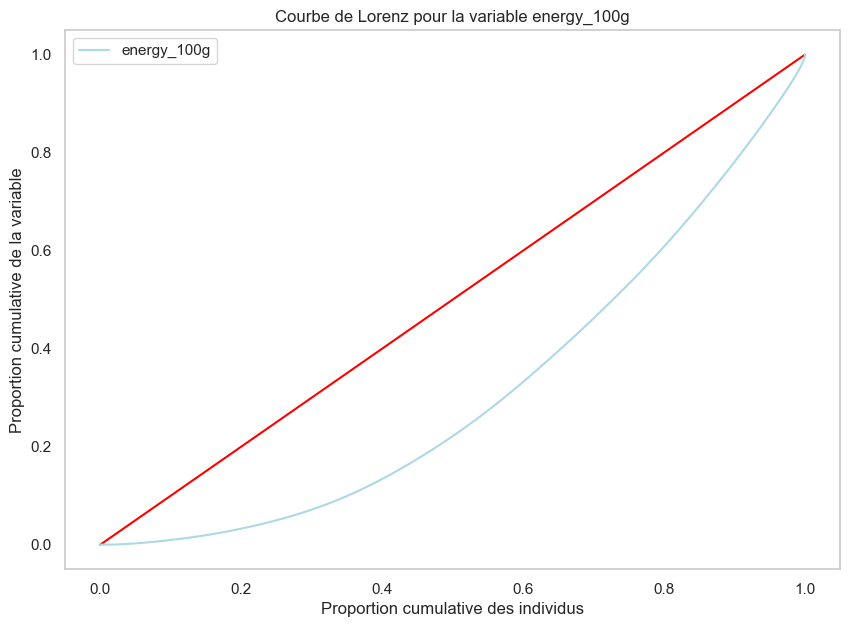

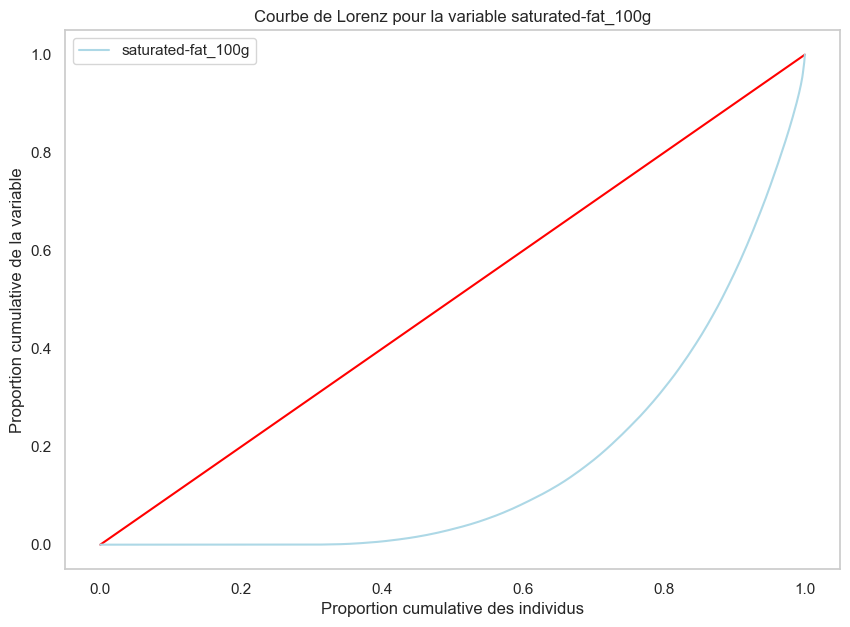

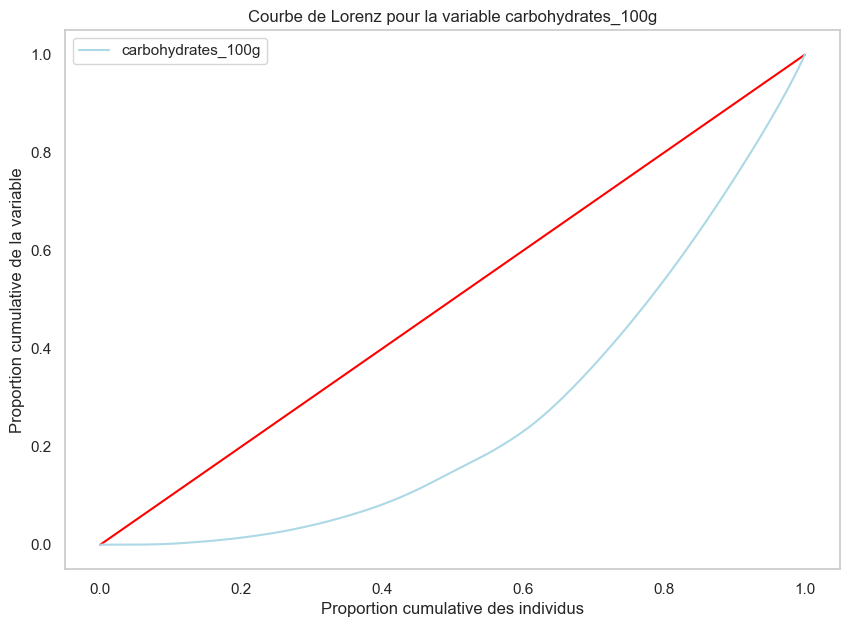

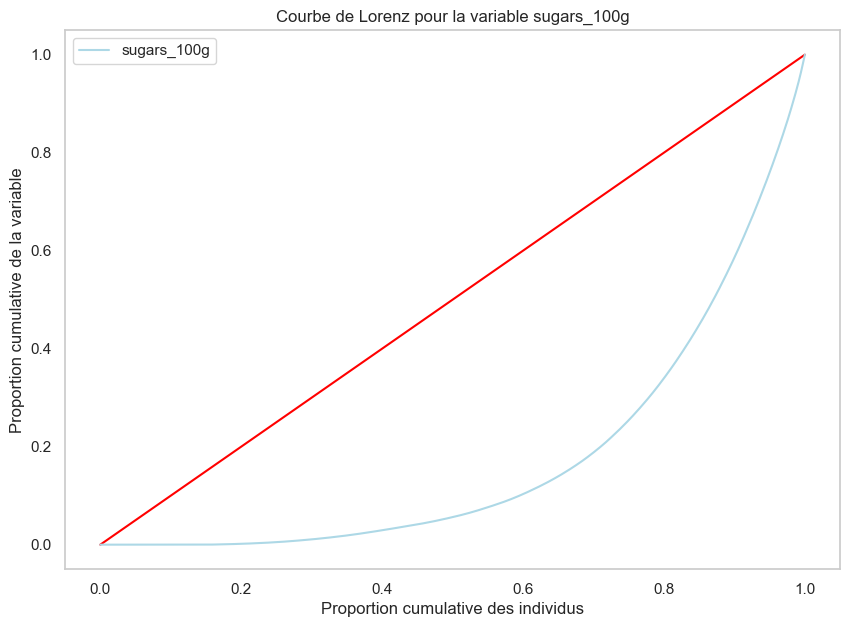

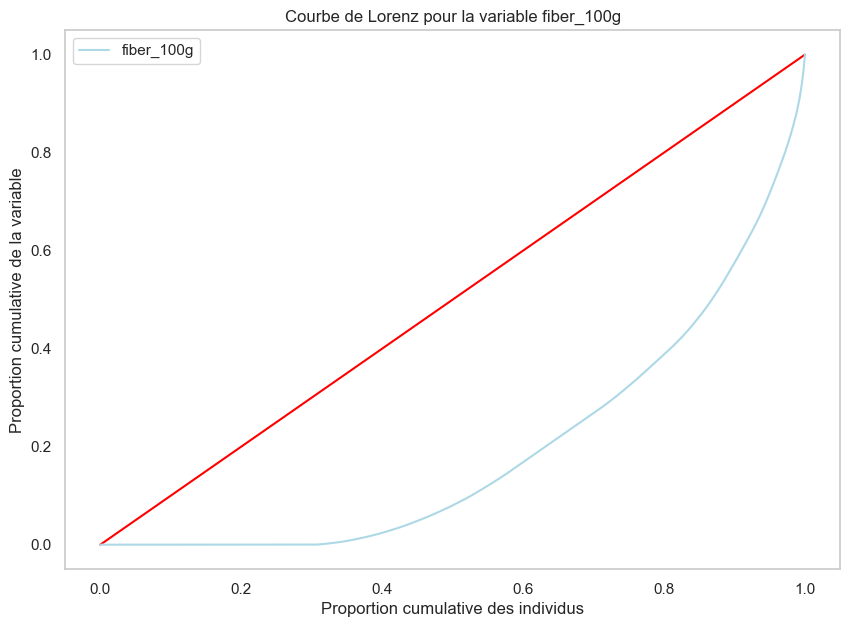

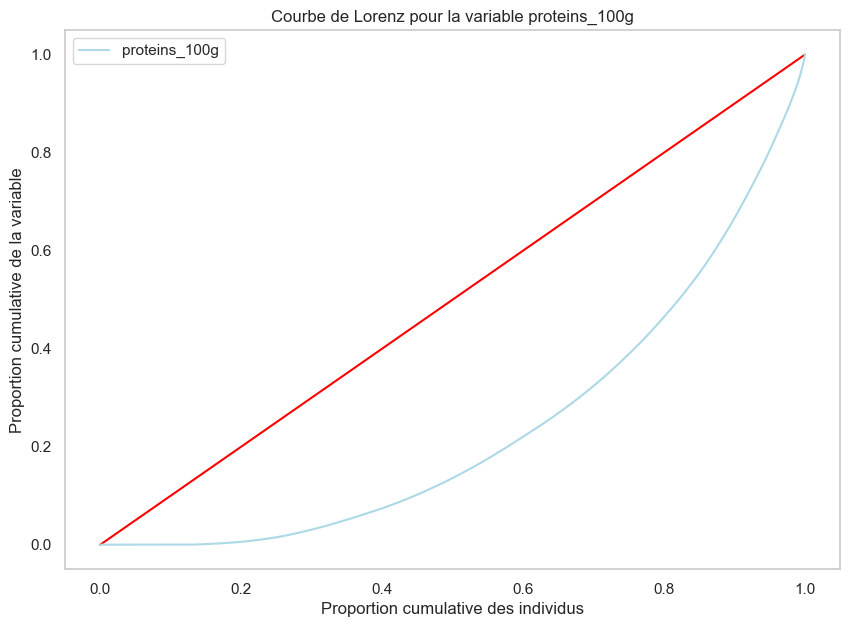

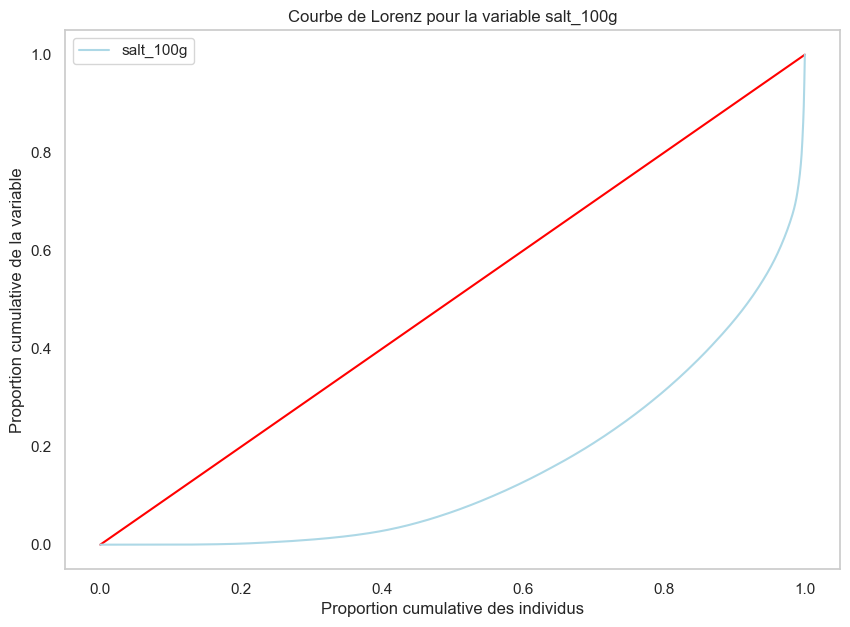

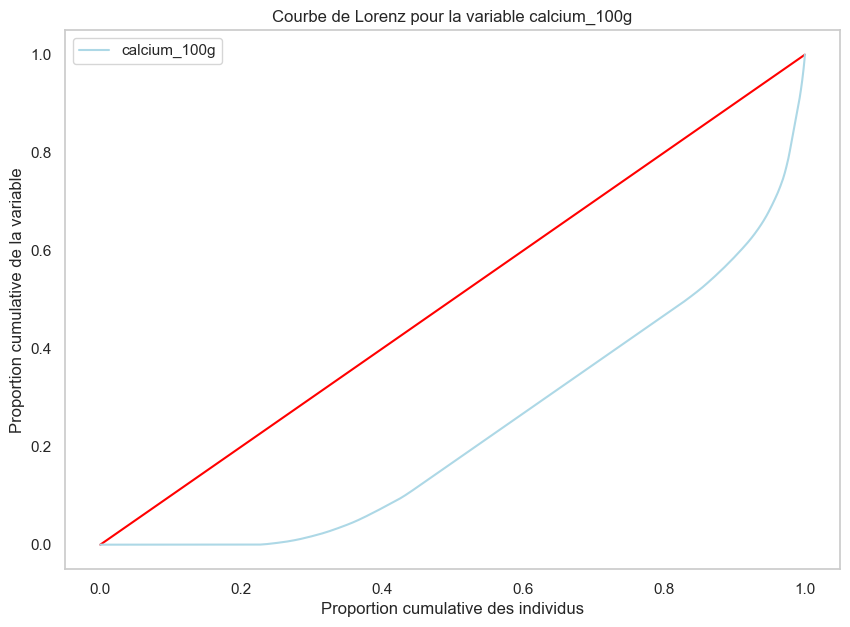

In [92]:
# Pour chaque variable quantitative
for variable in quantitative_columns:
    # Récupérer les valeurs de la variable
    values = subset_products_data[variable].dropna()
    
    # Tri des valeurs
    sorted_values = np.sort(values)
    
    # Calcul des fréquences cumulatives
    cumulative_freq = np.arange(1, len(sorted_values) + 1) / len(sorted_values)
    
    # Calcul des sommes cumulatives
    cumulative_sum = np.cumsum(sorted_values) / np.sum(sorted_values)
    
    # Création de la courbe de Lorenz
    plt.figure(figsize=(10, 7))
    plt.plot([0, 1], [0, 1], color='red')  # Première bissectrice
    plt.plot(cumulative_freq, cumulative_sum, label=variable)  # courbe de Lorenz
    plt.title('Courbe de Lorenz pour la variable ' + variable)
    plt.xlabel('Proportion cumulative des individus')
    plt.ylabel('Proportion cumulative de la variable')
    plt.legend()
    plt.grid()
    plt.show()

<h6>II . Coefficient de GINI</h6>

In [93]:
# Pour chaque variable quantitative
for variable in quantitative_columns:
    # Récupérer les valeurs de la variable
    values = subset_products_data[variable].dropna()
    
    # Tri des valeurs
    sorted_values = np.sort(values)
    
    # Calcul des fréquences cumulatives
    cumulative_freq = np.arange(1, len(sorted_values) + 1) / len(sorted_values)
    
    # Calcul des sommes cumulatives
    cumulative_sum = np.cumsum(sorted_values) / np.sum(sorted_values)
    
    # Calcul de l'aire sous la courbe de Lorenz (intégrale)
    lorenz_area = np.trapz(cumulative_sum, cumulative_freq)
    
    # Calcul du coefficient de Gini
    gini_coefficient = 1 - 2 * lorenz_area
    
    # Affichage du coefficient de Gini pour la variable en cours, formaté avec deux chiffres après la virgule.
    print(f"Le coefficient de Gini pour la variable {variable} est {gini_coefficient:.2f}")

Le coefficient de Gini pour la variable energy_100g est 0.37
Le coefficient de Gini pour la variable saturated-fat_100g est 0.68
Le coefficient de Gini pour la variable carbohydrates_100g est 0.47
Le coefficient de Gini pour la variable sugars_100g est 0.65
Le coefficient de Gini pour la variable fiber_100g est 0.61
Le coefficient de Gini pour la variable proteins_100g est 0.52
Le coefficient de Gini pour la variable salt_100g est 0.69
Le coefficient de Gini pour la variable calcium_100g est 0.53


Suite à notre analyse des mesures de concentration, effectuée grâce à la courbe de Lorenz et au calcul du coefficient de Gini, nous avons pu distinguer trois catégories distinctes :

***Les variables avec une dispersion élevée :***

"salt_100g" et "sugars_100g" avec des coefficients de Gini de 0.67 et 0.64 respectivement.

Cela signifie que cesvariables présentent une grande inégalité dans leur distribution, avec probablement quelques                valeurs extrêmes.


***Les variables avec une dispersion modérée :***

"saturated-fat_100g", "carbohydrates_100g", "fiber_100g", "proteins_100g", "calcium_100g" avec des coefficients de Gini allant de 0.42 à 0.57.

Ces variables présentent une dispersion modérée dans leur distribution.

***La variable avec une dispersion faible :***

"energy_100g" avec un coefficient de Gini de 0.36. Cela indique une distribution plus uniforme parmi les produits pour cette variable.

<h5>3. Analyse de normalité :</h5>

L'analyse de la normalité permet de vérifier si un ensemble de données suit une distribution normale (aussi appelée distribution gaussienne).

<h6>I . Vérifification de la normalité :</h6>

In [94]:
# Initialiser une liste vide pour stocker les résultats
results = []

# Calcul du skewness et du kurtosis pour nos variables quantitative
for column in quantitative_columns:
    skewness = stats.skew(subset_products_data[column].dropna())
    kurtosis = stats.kurtosis(subset_products_data[column].dropna(), fisher=False)
    excess_kurtosis = stats.kurtosis(subset_products_data[column].dropna(), fisher=True)
    
    # Ajout des résultats à la liste
    results.append({
        'Variable': column,
        'Skewness': skewness,
        'Kurtosis réel': kurtosis,
        'Excès de kurtosis': excess_kurtosis
    })

# Création un DataFrame avec les résultats
df_results = pd.DataFrame(results)


df_results

,Variable,Skewness,Kurtosis réel,Excès de kurtosis
0,energy_100g,28.355100,1909.403045,1906.403045
1,saturated-fat_100g,3.218898,23.485456,20.485456
2,carbohydrates_100g,0.561069,2.029139,-0.970861
3,sugars_100g,1.691793,5.421697,2.421697
4,fiber_100g,4.950825,49.621132,46.621132
5,proteins_100g,2.034482,10.958028,7.958028
6,salt_100g,14.667409,265.969838,262.969838
7,calcium_100g,5.178047,40.172979,37.172979


<h6>II . Graphiques de vérification de la normalité :</h6>

***Histogramme et courbe de densité***

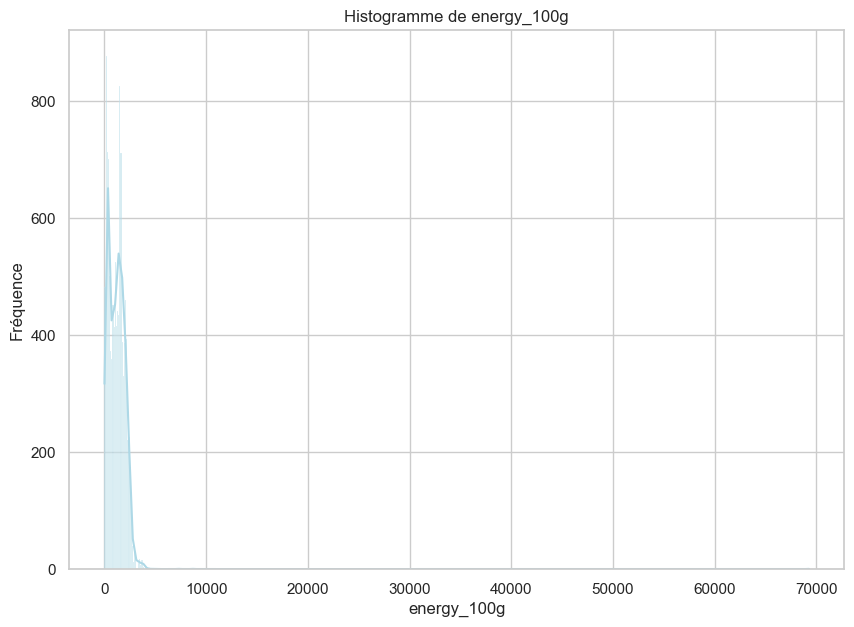

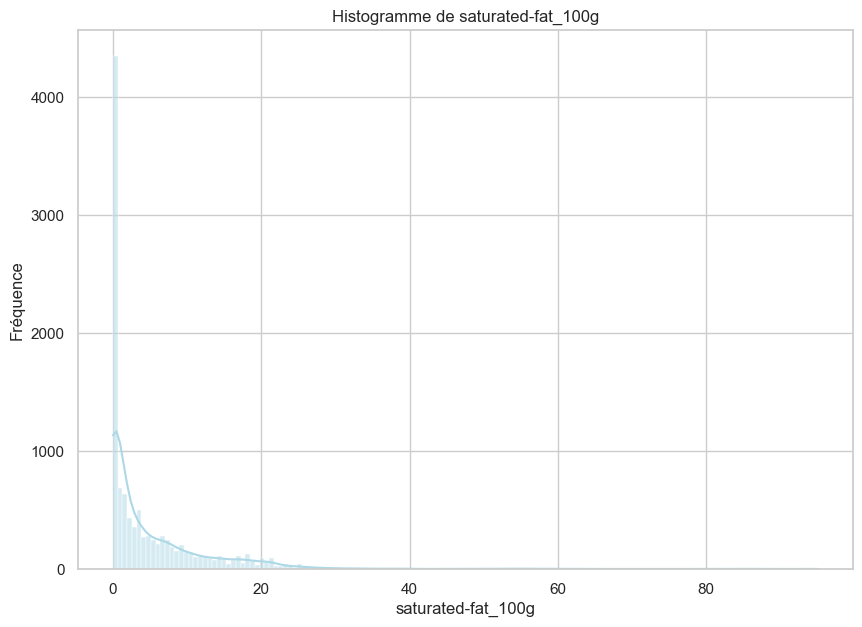

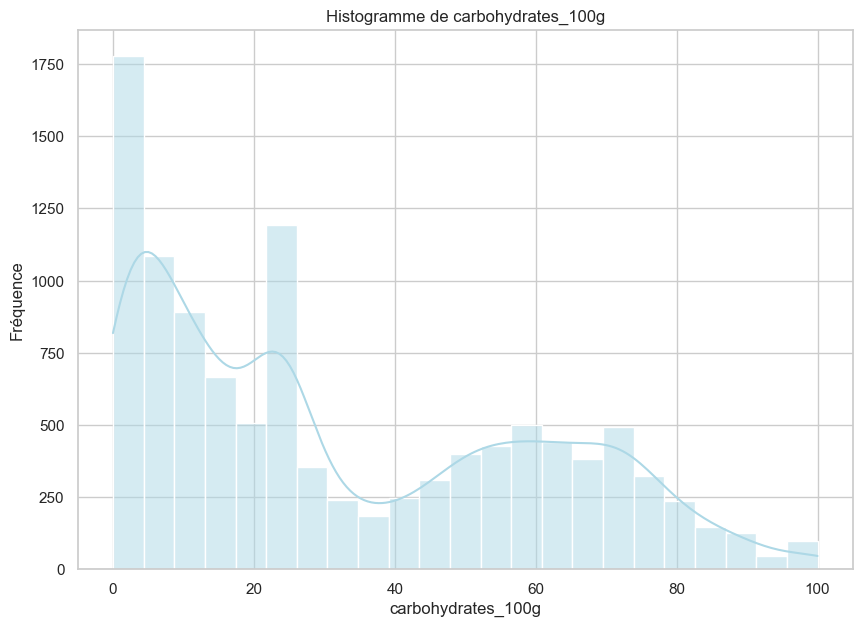

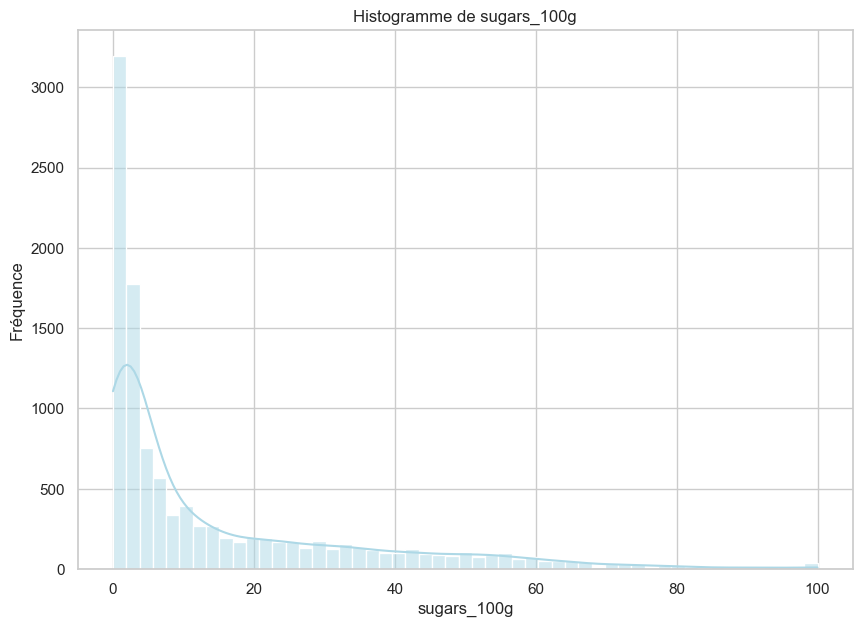

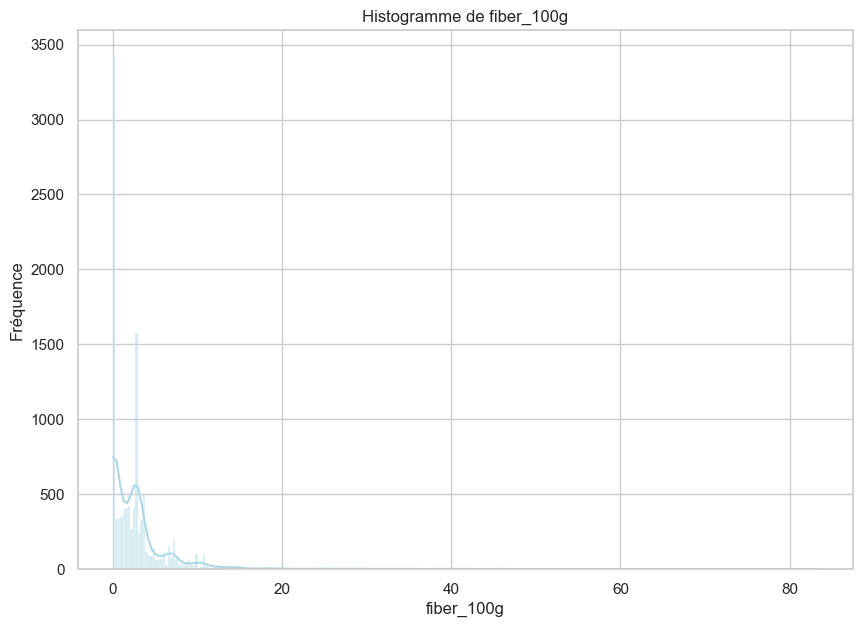

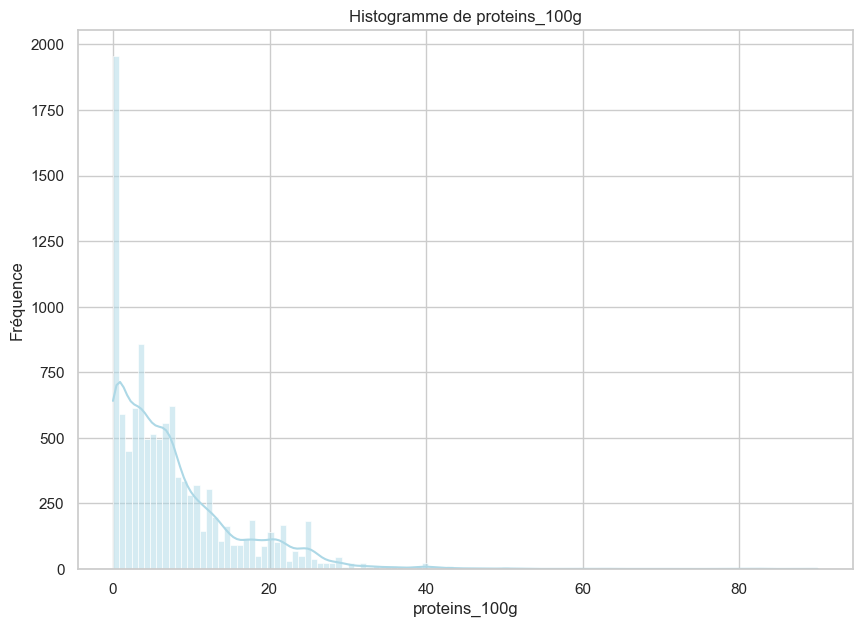

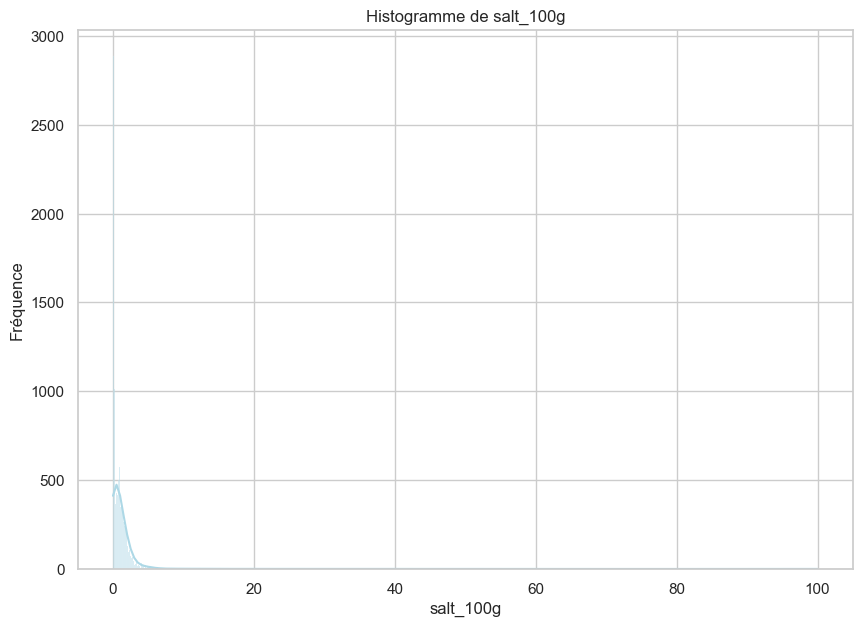

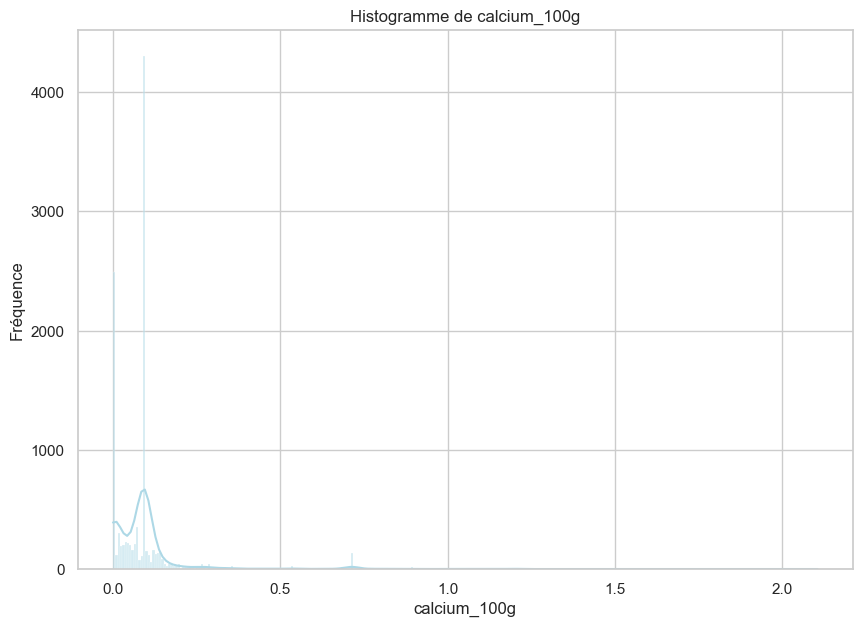

In [95]:
# Pour chaque variable quantitative
for column in quantitative_columns:
    # Création d'un histogramme
    plt.figure(figsize=(10, 7))
    sns.histplot(subset_products_data[column].dropna(), kde=True)
    plt.title('Histogramme de ' + column)
    plt.xlabel(column)
    plt.ylabel('Fréquence')
    plt.show()

***Boxplot :***

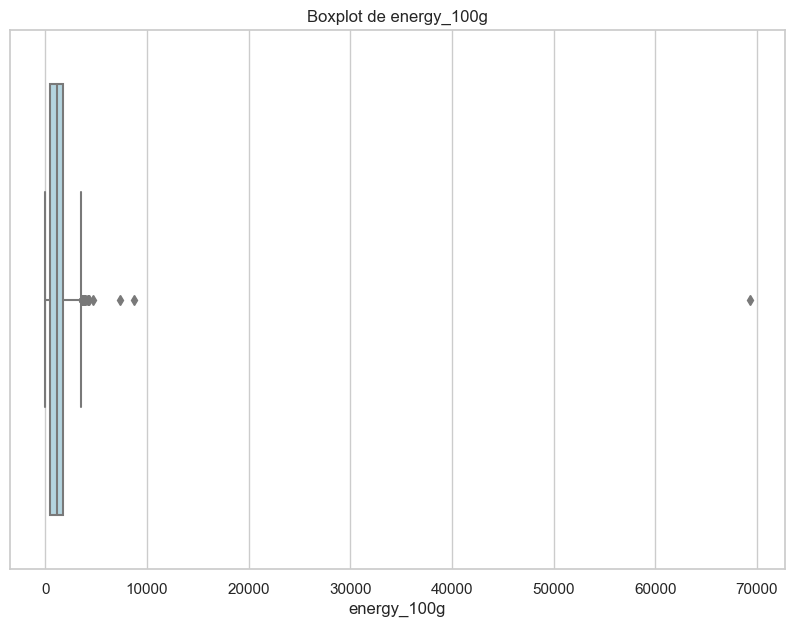

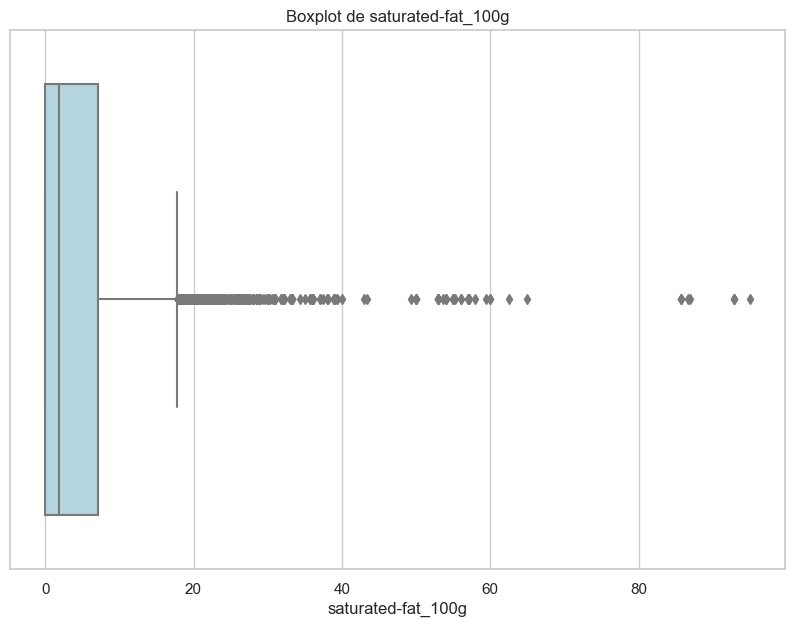

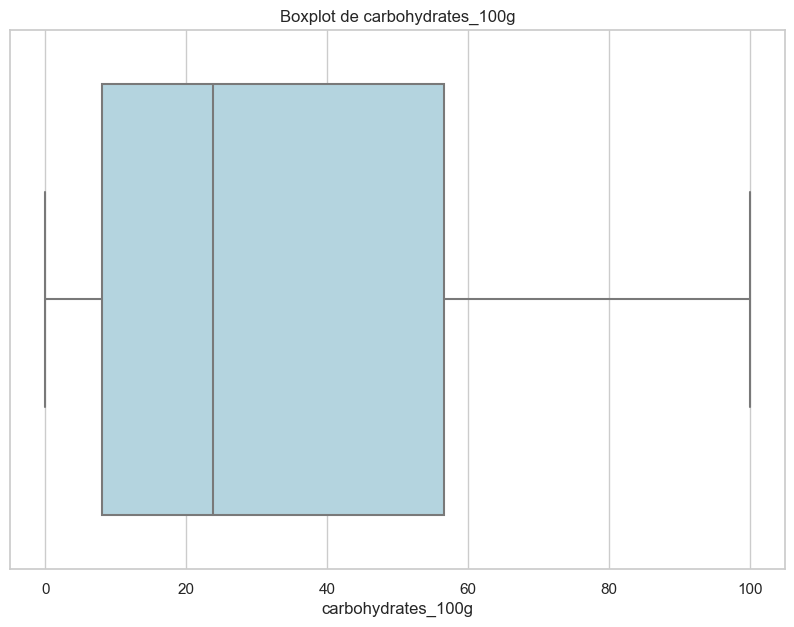

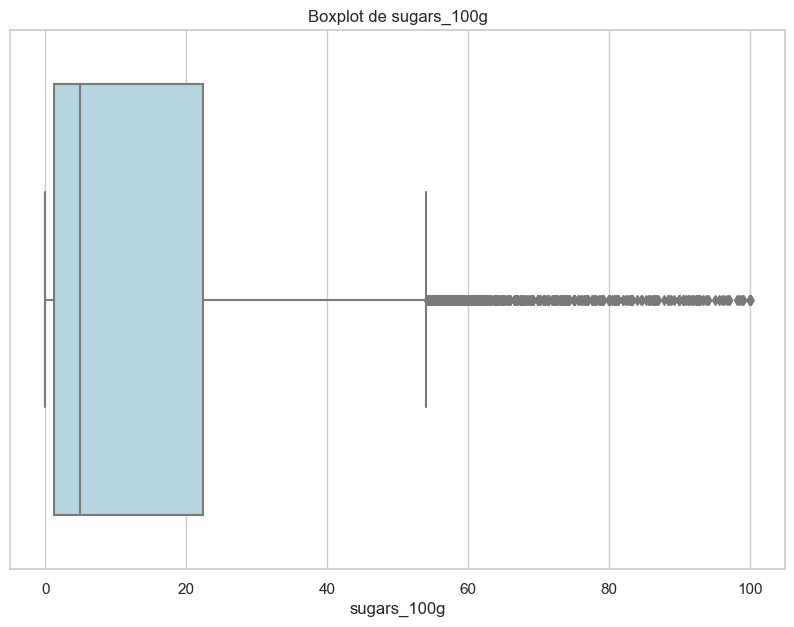

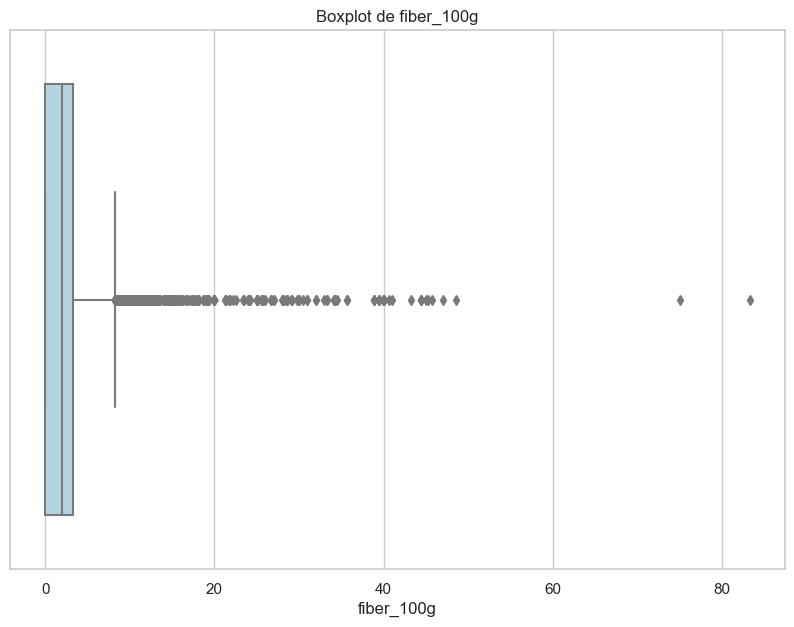

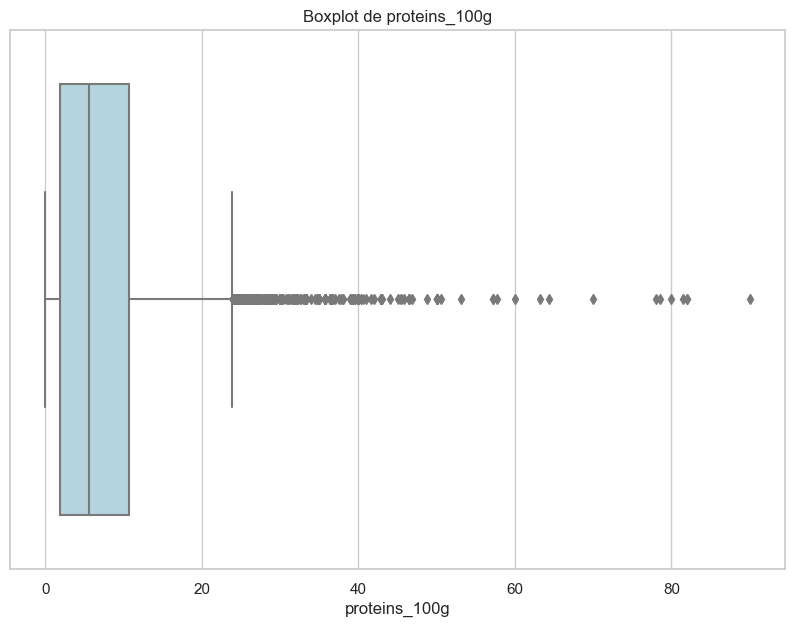

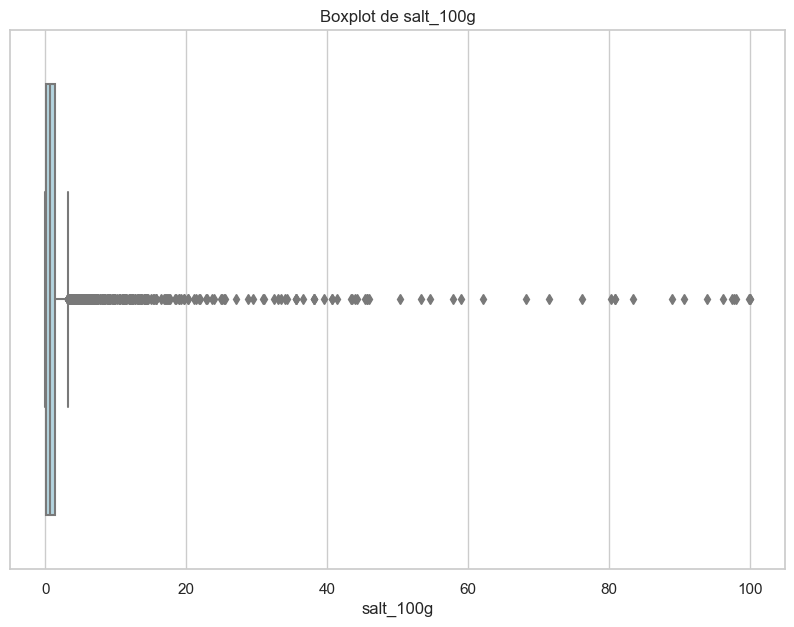

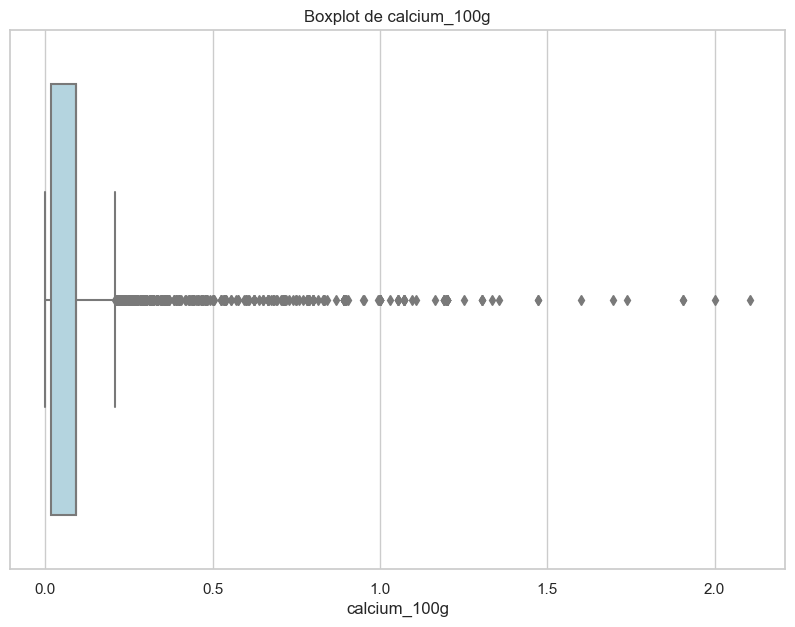

In [96]:
# Pour chaque variable quantitative
for column in quantitative_columns:
    # Création d'un boxplot
    plt.figure(figsize=(10, 7))
    sns.boxplot(x=subset_products_data[column].dropna())
    plt.title('Boxplot de ' + column)
    plt.xlabel(column)
    plt.show()

***Q-Q plot :***

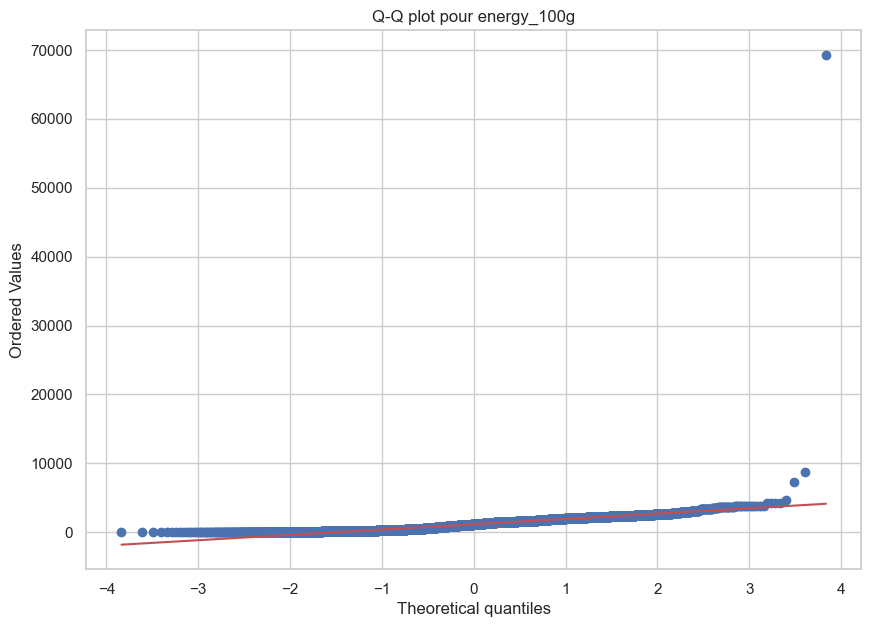

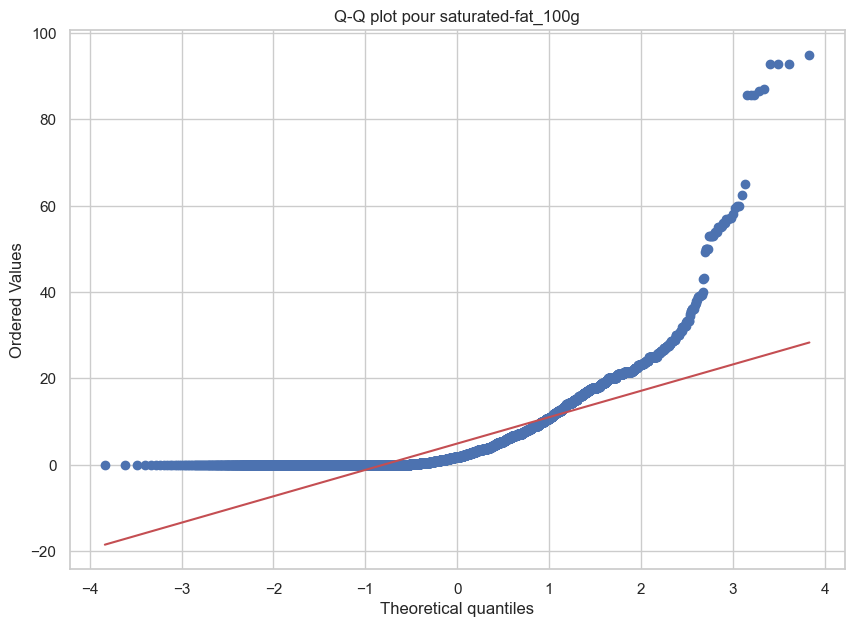

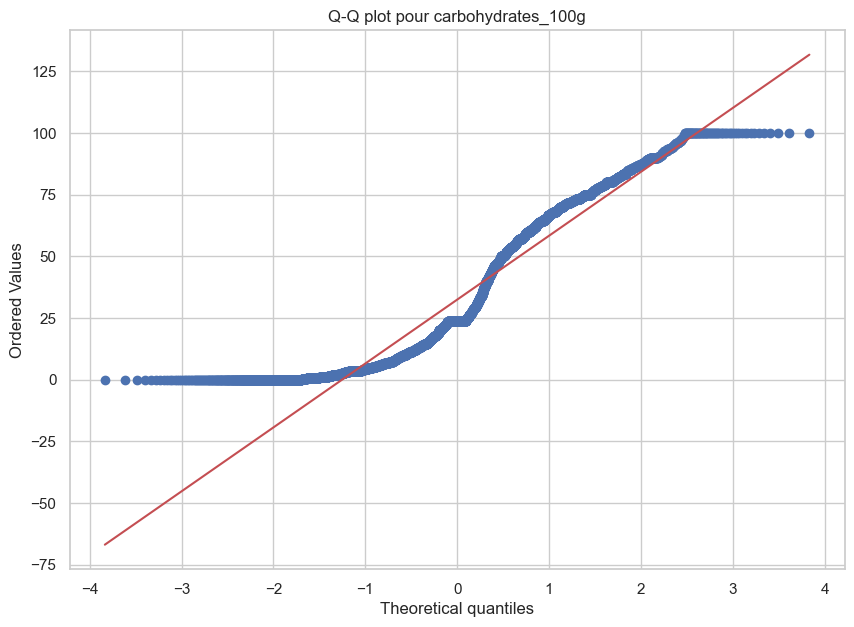

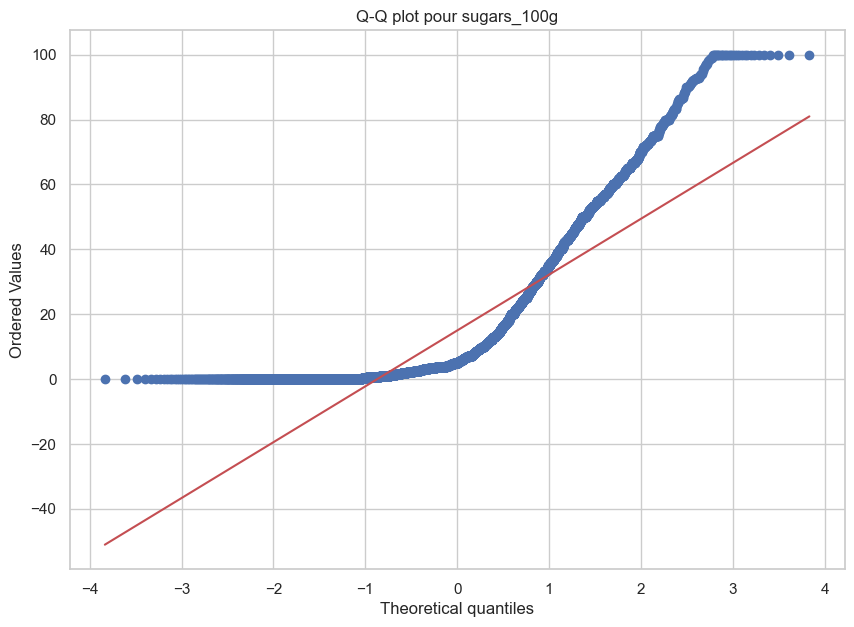

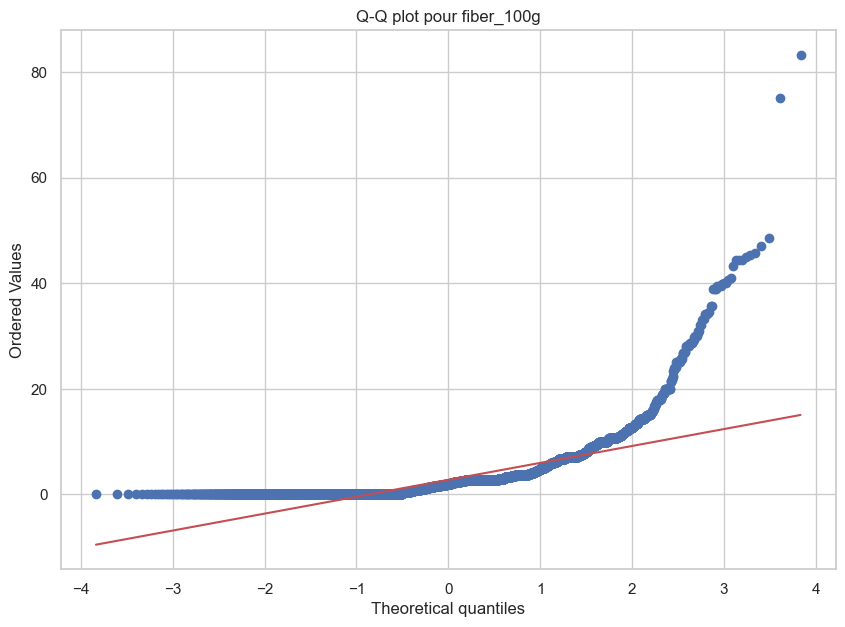

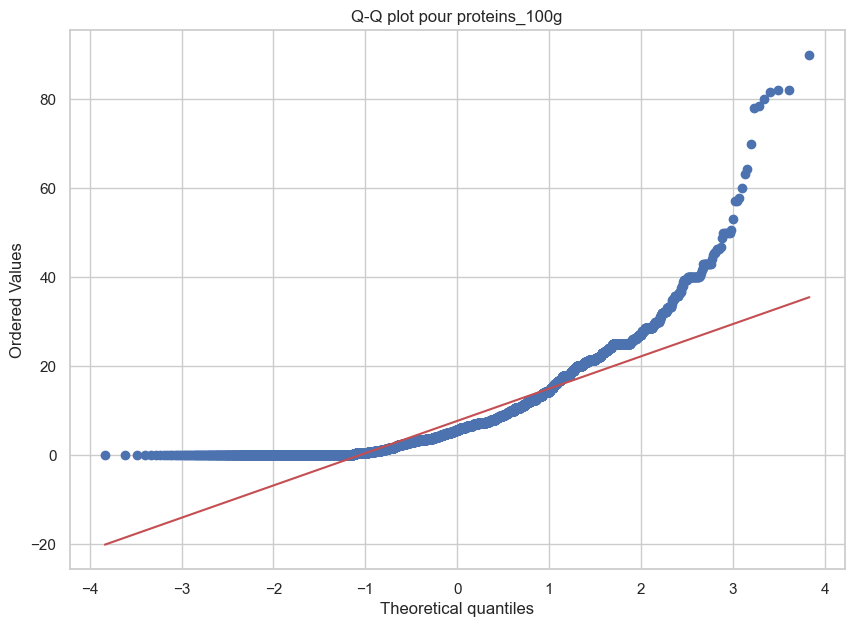

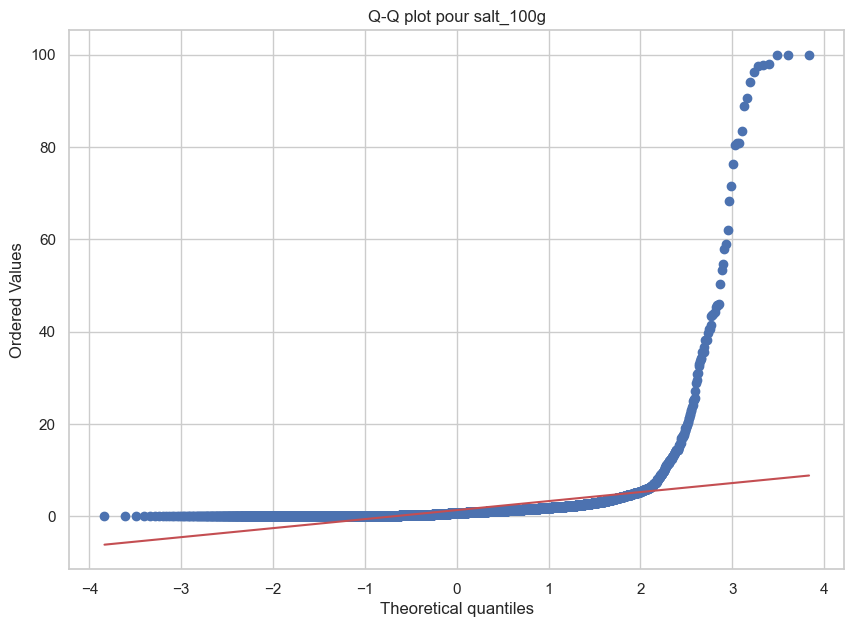

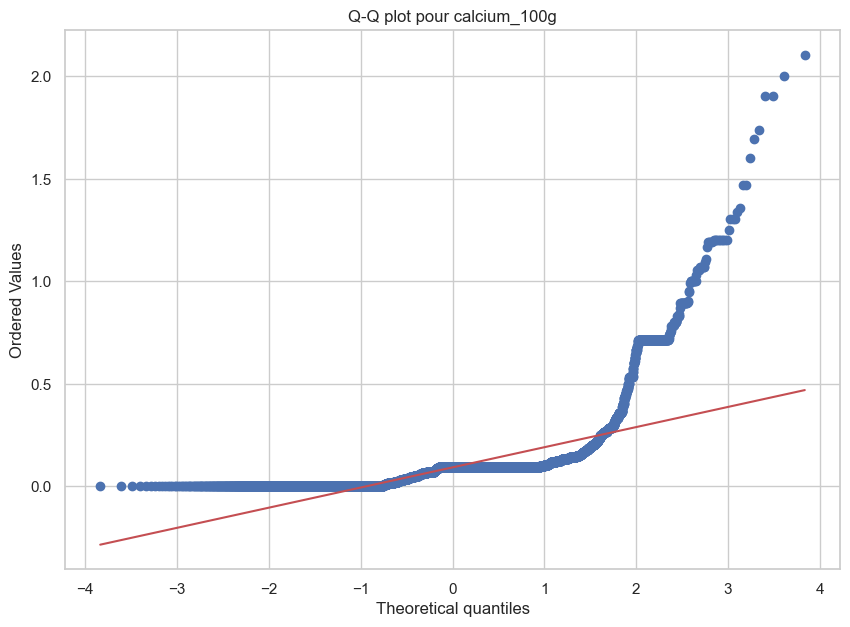

In [97]:
# Pour chaque variable quantitative
for column in quantitative_columns:
    # Création un Q-Q plot
    plt.figure(figsize=(10, 7))
    stats.probplot(subset_products_data[column].dropna(), plot=plt)
    plt.title('Q-Q plot pour ' + column)
    plt.show()

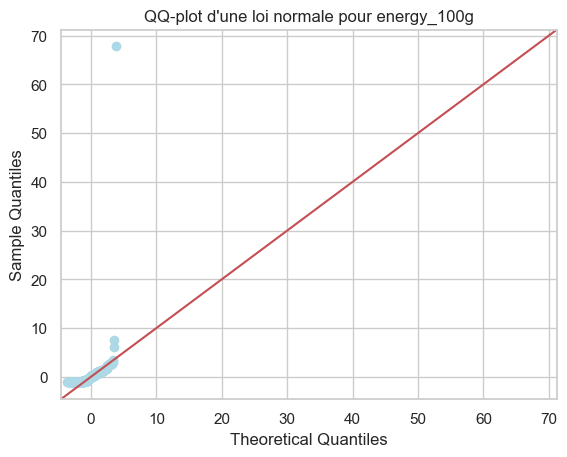

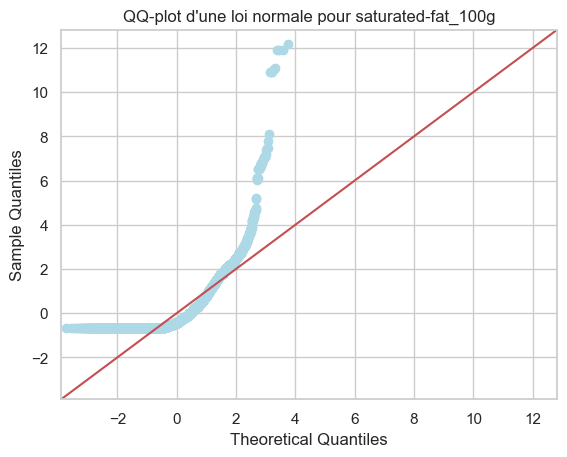

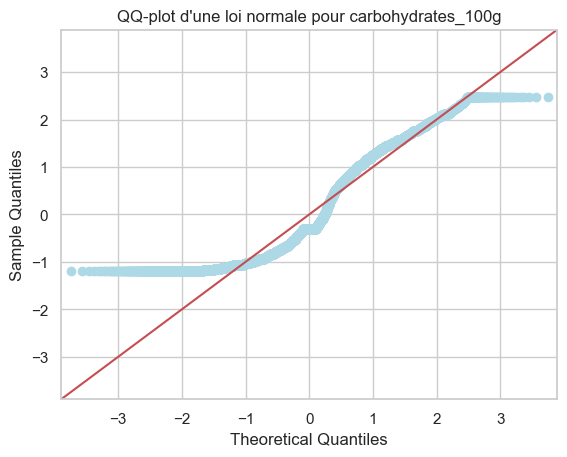

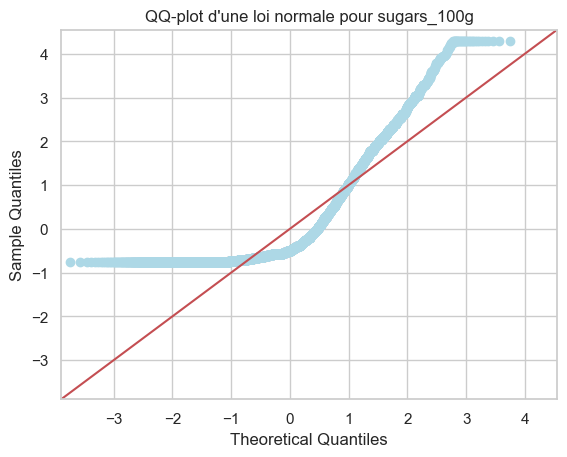

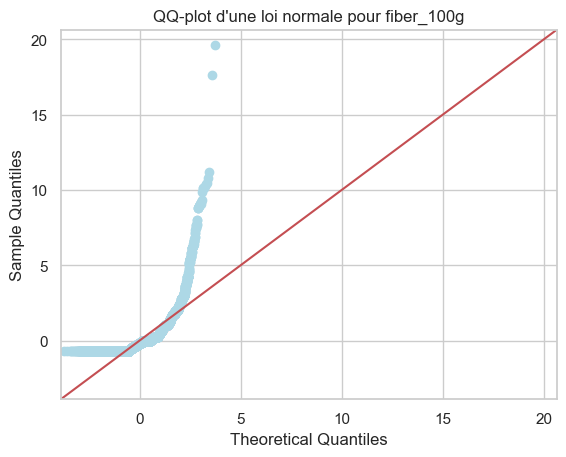

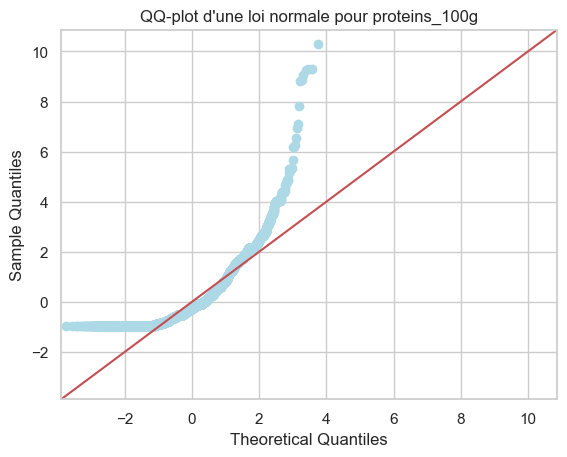

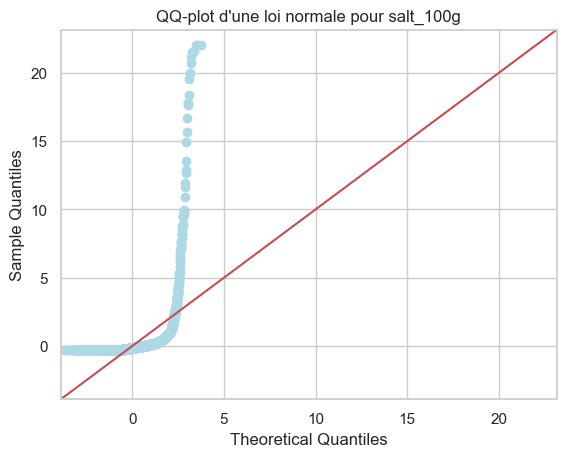

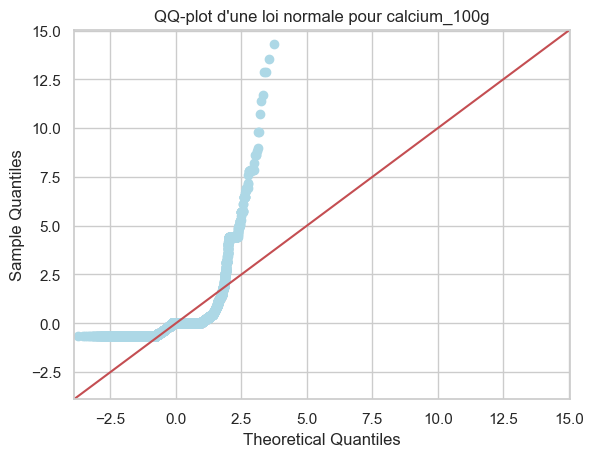

In [98]:
# Pour chaque variable quantitative
for column in quantitative_columns:
    # Générer un échantillon aléatoire à partir d'une distribution normale
    np.random.seed(42)
    sample = np.random.normal(loc=0, scale=1, size=100)

    # Création  QQ-plot
    fig = sm.qqplot(subset_products_data[column].dropna(), line='45', fit=True)
    plt.title("QQ-plot d'une loi normale pour " + column)
    plt.show()

<h6>III . Tests statistiques :</h6>

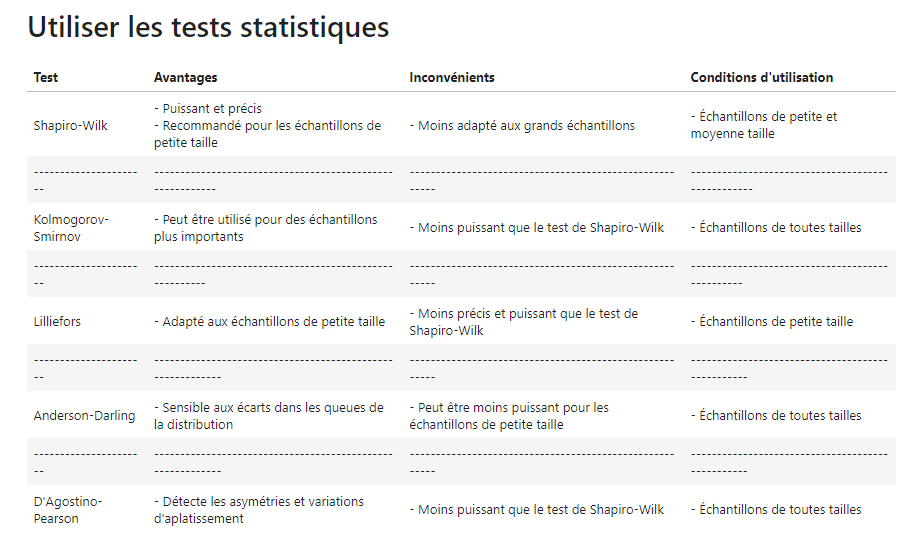

In [99]:
# Niveau de signification (alpha)
alpha = 0.05

# Liste pour stocker les résultats
results = []

# Pour chaque variable quantitative
for column in quantitative_columns:
    # Récupérer les valeurs de la variable
    values = subset_products_data[column].dropna()
    
    # Effectuer les tests de normalité
    shapiro_test = stats.shapiro(values)
    ks_test = stats.kstest(values, 'norm')
    ad_test = stats.anderson(values, dist='norm')
    dagostino_test = stats.normaltest(values)
    lilliefors_test = lilliefors(values, dist='norm')

    # Ajouter les résultats à la liste
    results.extend([
        {
            'Variable': column,
            'Nom du test': 'Shapiro-Wilk',
            'Statistique de test': shapiro_test[0],
            'p-valeur': shapiro_test[1],
            'Normalité': 'Oui' if shapiro_test[1] > alpha else 'Non'
        },
        {
            'Variable': column,
            'Nom du test': 'Kolmogorov-Smirnov',
            'Statistique de test': ks_test.statistic,
            'p-valeur': ks_test.pvalue,
            'Normalité': 'Oui' if ks_test.pvalue > alpha else 'Non'
        },
        {
            'Variable': column,
            'Nom du test': 'Anderson-Darling',
            'Statistique de test': ad_test.statistic,
            'p-valeur': None,
            'Normalité': 'Oui' if any(ad_test.statistic < crit_val for crit_val in ad_test.critical_values) else 'Non'
        },
        {
            'Variable': column,
            'Nom du test': "D'Agostino-Pearson",
            'Statistique de test': dagostino_test.statistic,
            'p-valeur': dagostino_test.pvalue,
            'Normalité': 'Oui' if dagostino_test.pvalue > alpha else 'Non'
        },
        {
            'Variable': column,
            'Nom du test': 'Lilliefors',
            'Statistique de test': lilliefors_test[0],
            'p-valeur': lilliefors_test[1],
            'Normalité': 'Oui' if lilliefors_test[1] > alpha else 'Non'
        }
    ])

# Creationn un DataFrame avec les résultats
test_results = pd.DataFrame(results)


test_results

,Variable,Nom du test,Statistique de test,p-valeur,Normalité
0,energy_100g,Shapiro-Wilk,0.594515,0.000,Non
1,energy_100g,Kolmogorov-Smirnov,0.989296,0.000,Non
2,energy_100g,Anderson-Darling,211.856167,NaN,Non
3,energy_100g,D'Agostino-Pearson,28325.081258,0.000,Non
4,energy_100g,Lilliefors,0.120604,0.001,Non
5,saturated-fat_100g,Shapiro-Wilk,0.681687,0.000,Non
6,saturated-fat_100g,Kolmogorov-Smirnov,0.500000,0.000,Non
7,saturated-fat_100g,Anderson-Darling,976.283579,NaN,Non
8,saturated-fat_100g,D'Agostino-Pearson,8058.010489,0.000,Non
9,saturated-fat_100g,Lilliefors,0.253166,0.001,Non


<h1>05 - Analyse Bivariée </h1>

<h6>A. Exploration des Corrélations :</h6>

<h5>1.Variables Qualitatives : </h5>

<h6>I.Tableau de contingence : </h6>

Pour rechercher des corrélations ou des relations entre ces variables qualitatives, nous utilisons le tableau de contingence.

In [100]:
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2: # Éviter de comparer une colonne avec elle-même
            # Création du tableau de contingence
            contingency_table = pd.crosstab(subset_products_data[col1], subset_products_data[col2])
            
            # Affichage du tableau de contingence
            print(f"Tableau de contingence entre {col1} et {col2}:")
            display(contingency_table)
            print("\n" + "="*50 + "\n")

Tableau de contingence entre packaging et brands:


brands,"blue diamond natural, Blue Diamond Almonds",15th Ave Food Corp.,1st National Bagel Company,2 Sisters' Salsa Company,2b,3 Leches,3 Taxi Guys,365 Everyday Value,"365 Everyday Value, Whole Foods Market Inc.","365 Everyday Value, Whole Foods Market Ip Lp",...,vrai,yutaka,"Épi d'Or,Marque Repère",Ökoland,Ölz,Özelim,"Ülker,Ülker Çikolata",ültje,"€.C.O.+,Eco+","百吉,POKI"
packaging,,,,,,,,,,,,,,,,,,,,,
",sachets",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
",stück",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
05 PP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,21 PAP",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,Plastic,Aluminum Foil",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton à recycler,Sachets plastiques individuels à jeter,Triman",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton,Bouteille en verre brune,Capsule en metal",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre packaging et categories:


categories,"Ab 8. Monat,Babynahrung","Ab dem 8. Monat,Babynahrung",Abricots au sirop,Aceites de oliva virgen extra,"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva","Additifs alimentaires,Gélifiants,Gélifiants végétaux,Agar-Agars",Agua,"Aides culinaires,Bicarbonates de sodium,Sels",Airelles,Ajos encurtidos,...,yogurt,"yogurt drink,yogurt","Édulcorants,Additifs alimentaires,Succédanés du sucre,Édulcorants artificiels,Sucralose","Édulcorants,Sirops aux fruits","Édulcorants,Sucres,Sucres blancs,Sucres en poudre","Édulcorants,Sucres,Sucres de canne","Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",Épinards en conserve,"Śmietana,en:Sour Creams","甜類零食,餅乾及蛋糕,Biscuits"
packaging,,,,,,,,,,,,,,,,,,,,,
",sachets",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
",stück",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
05 PP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,21 PAP",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,Plastic,Aluminum Foil",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton à recycler,Sachets plastiques individuels à jeter,Triman",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton,Bouteille en verre brune,Capsule en metal",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre packaging et manufacturing_places:


manufacturing_places,"02290 Montigny-Lengrain,Aisne,Picardie,France","10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France","13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France","14400 Bayeux,Calvados,Basse-Normandie,France","17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France","24052,Périgueux,France","30220 Aigues-Mortes,Gard,Languedoc-Roussillon,France","33290 Blanquefort,Gironde,Aquitaine,France","35400,Saint Malo,Bretagne,France","44320 Chauvé,Loire-Atlantique,Pays de la Loire,France",...,"[FABRICANTE],Fondón,Almería (provincia),Andalucía,España,[ENVASADOR],Lorqui,Murcia (comunidad autónoma),España",espagne,france,italia,netherlands,suisse,Écosse,Österreich,"Ülker Çikolata Sanayi AS,Maltepe Mah.,Davutpasa Cad.,34015,Zeytinburnu,Istanbul,Turquie",élaboré et conditionné en Espagne
packaging,,,,,,,,,,,,,,,,,,,,,
",sachets",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
",stück",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
05 PP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,21 PAP",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,Plastic,Aluminum Foil",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton à recycler,Sachets plastiques individuels à jeter,Triman",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton,Bouteille en verre brune,Capsule en metal",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre packaging et stores:


stores,"AH,Albert Heijn",ALDI,Action,AhorraMas,Ahorramas,Ahorramás,"Ahorramás, Condis, Caprabo, Mercadona","Ahorramás,Alcampo,Carrefour,Eroski,El Corte Inglés,Hipercor,Condis,Dia,Caprabo",Aire d'autoroute,Aire d'autoroute A 40,...,score,sky,"sky,EDEKA",spar,super hyper marché,superU,tesco,the co-operative,www.snackies.fr,ΑΒ Βασιλόπουλος
packaging,,,,,,,,,,,,,,,,,,,,,
",sachets",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
",stück",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
05 PP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,21 PAP",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"05 PP,Plastic,Aluminum Foil",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton à recycler,Sachets plastiques individuels à jeter,Triman",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Étui carton,Bouteille en verre brune,Capsule en metal",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre brands et packaging:


packaging,",sachets",",stück",05 PP,"05 PP,21 PAP","05 PP,Plastic,Aluminum Foil","05 PP,Plastique","06 PS,21 PAP",07,"07 O,07 o","07 O,Kunststoff",...,verre,"verre,couvercle,métal","verre,pot","wrap - paper, foil - aluminium",Étui carton,"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri","Étui carton à recycler,Sachets plastiques individuels à jeter,Triman","Étui carton,Bouteille en verre brune,Capsule en metal","Étui carton,Pot carton,Opercule métal","Étui en carton,Pot et opercule en métal,Feuille papier"
brands,,,,,,,,,,,,,,,,,,,,,
"blue diamond natural, Blue Diamond Almonds",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15th Ave Food Corp.,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1st National Bagel Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2 Sisters' Salsa Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Özelim,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ülker,Ülker Çikolata",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ültje,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre brands et categories:


categories,"Ab 8. Monat,Babynahrung","Ab dem 8. Monat,Babynahrung",Abricots au sirop,Aceites de oliva virgen extra,"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva","Additifs alimentaires,Gélifiants,Gélifiants végétaux,Agar-Agars",Agua,"Aides culinaires,Bicarbonates de sodium,Sels",Airelles,Ajos encurtidos,...,yogurt,"yogurt drink,yogurt","Édulcorants,Additifs alimentaires,Succédanés du sucre,Édulcorants artificiels,Sucralose","Édulcorants,Sirops aux fruits","Édulcorants,Sucres,Sucres blancs,Sucres en poudre","Édulcorants,Sucres,Sucres de canne","Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",Épinards en conserve,"Śmietana,en:Sour Creams","甜類零食,餅乾及蛋糕,Biscuits"
brands,,,,,,,,,,,,,,,,,,,,,
"blue diamond natural, Blue Diamond Almonds",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15th Ave Food Corp.,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1st National Bagel Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2 Sisters' Salsa Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Özelim,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ülker,Ülker Çikolata",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ültje,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre brands et manufacturing_places:


manufacturing_places,"02290 Montigny-Lengrain,Aisne,Picardie,France","10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France","13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France","14400 Bayeux,Calvados,Basse-Normandie,France","17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France","24052,Périgueux,France","30220 Aigues-Mortes,Gard,Languedoc-Roussillon,France","33290 Blanquefort,Gironde,Aquitaine,France","35400,Saint Malo,Bretagne,France","44320 Chauvé,Loire-Atlantique,Pays de la Loire,France",...,"[FABRICANTE],Fondón,Almería (provincia),Andalucía,España,[ENVASADOR],Lorqui,Murcia (comunidad autónoma),España",espagne,france,italia,netherlands,suisse,Écosse,Österreich,"Ülker Çikolata Sanayi AS,Maltepe Mah.,Davutpasa Cad.,34015,Zeytinburnu,Istanbul,Turquie",élaboré et conditionné en Espagne
brands,,,,,,,,,,,,,,,,,,,,,
"blue diamond natural, Blue Diamond Almonds",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15th Ave Food Corp.,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1st National Bagel Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2 Sisters' Salsa Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Özelim,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ülker,Ülker Çikolata",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
ültje,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre brands et stores:


stores,"AH,Albert Heijn",ALDI,Action,AhorraMas,Ahorramas,Ahorramás,"Ahorramás, Condis, Caprabo, Mercadona","Ahorramás,Alcampo,Carrefour,Eroski,El Corte Inglés,Hipercor,Condis,Dia,Caprabo",Aire d'autoroute,Aire d'autoroute A 40,...,score,sky,"sky,EDEKA",spar,super hyper marché,superU,tesco,the co-operative,www.snackies.fr,ΑΒ Βασιλόπουλος
brands,,,,,,,,,,,,,,,,,,,,,
"blue diamond natural, Blue Diamond Almonds",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15th Ave Food Corp.,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1st National Bagel Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2 Sisters' Salsa Company,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Özelim,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ülker,Ülker Çikolata",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ültje,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre categories et packaging:


packaging,",sachets",",stück",05 PP,"05 PP,21 PAP","05 PP,Plastic,Aluminum Foil","05 PP,Plastique","06 PS,21 PAP",07,"07 O,07 o","07 O,Kunststoff",...,verre,"verre,couvercle,métal","verre,pot","wrap - paper, foil - aluminium",Étui carton,"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri","Étui carton à recycler,Sachets plastiques individuels à jeter,Triman","Étui carton,Bouteille en verre brune,Capsule en metal","Étui carton,Pot carton,Opercule métal","Étui en carton,Pot et opercule en métal,Feuille papier"
categories,,,,,,,,,,,,,,,,,,,,,
"Ab 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ab dem 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Abricots au sirop,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Aceites de oliva virgen extra,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Édulcorants,Sucres,Sucres de canne",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Épinards en conserve,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre categories et brands:


brands,"blue diamond natural, Blue Diamond Almonds",15th Ave Food Corp.,1st National Bagel Company,2 Sisters' Salsa Company,2b,3 Leches,3 Taxi Guys,365 Everyday Value,"365 Everyday Value, Whole Foods Market Inc.","365 Everyday Value, Whole Foods Market Ip Lp",...,vrai,yutaka,"Épi d'Or,Marque Repère",Ökoland,Ölz,Özelim,"Ülker,Ülker Çikolata",ültje,"€.C.O.+,Eco+","百吉,POKI"
categories,,,,,,,,,,,,,,,,,,,,,
"Ab 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ab dem 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Abricots au sirop,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Aceites de oliva virgen extra,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Édulcorants,Sucres,Sucres de canne",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Épinards en conserve,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre categories et manufacturing_places:


manufacturing_places,"02290 Montigny-Lengrain,Aisne,Picardie,France","10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France","13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France","14400 Bayeux,Calvados,Basse-Normandie,France","17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France","24052,Périgueux,France","30220 Aigues-Mortes,Gard,Languedoc-Roussillon,France","33290 Blanquefort,Gironde,Aquitaine,France","35400,Saint Malo,Bretagne,France","44320 Chauvé,Loire-Atlantique,Pays de la Loire,France",...,"[FABRICANTE],Fondón,Almería (provincia),Andalucía,España,[ENVASADOR],Lorqui,Murcia (comunidad autónoma),España",espagne,france,italia,netherlands,suisse,Écosse,Österreich,"Ülker Çikolata Sanayi AS,Maltepe Mah.,Davutpasa Cad.,34015,Zeytinburnu,Istanbul,Turquie",élaboré et conditionné en Espagne
categories,,,,,,,,,,,,,,,,,,,,,
"Ab 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ab dem 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Abricots au sirop,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Aceites de oliva virgen extra,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Édulcorants,Sucres,Sucres de canne",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Épinards en conserve,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre categories et stores:


stores,"AH,Albert Heijn",ALDI,Action,AhorraMas,Ahorramas,Ahorramás,"Ahorramás, Condis, Caprabo, Mercadona","Ahorramás,Alcampo,Carrefour,Eroski,El Corte Inglés,Hipercor,Condis,Dia,Caprabo",Aire d'autoroute,Aire d'autoroute A 40,...,score,sky,"sky,EDEKA",spar,super hyper marché,superU,tesco,the co-operative,www.snackies.fr,ΑΒ Βασιλόπουλος
categories,,,,,,,,,,,,,,,,,,,,,
"Ab 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Ab dem 8. Monat,Babynahrung",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Abricots au sirop,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Aceites de oliva virgen extra,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Édulcorants,Sucres,Sucres de canne",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Épinards en conserve,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre manufacturing_places et packaging:


packaging,",sachets",",stück",05 PP,"05 PP,21 PAP","05 PP,Plastic,Aluminum Foil","05 PP,Plastique","06 PS,21 PAP",07,"07 O,07 o","07 O,Kunststoff",...,verre,"verre,couvercle,métal","verre,pot","wrap - paper, foil - aluminium",Étui carton,"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri","Étui carton à recycler,Sachets plastiques individuels à jeter,Triman","Étui carton,Bouteille en verre brune,Capsule en metal","Étui carton,Pot carton,Opercule métal","Étui en carton,Pot et opercule en métal,Feuille papier"
manufacturing_places,,,,,,,,,,,,,,,,,,,,,
"02290 Montigny-Lengrain,Aisne,Picardie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"14400 Bayeux,Calvados,Basse-Normandie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
suisse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Écosse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Österreich,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre manufacturing_places et brands:


brands,"blue diamond natural, Blue Diamond Almonds",15th Ave Food Corp.,1st National Bagel Company,2 Sisters' Salsa Company,2b,3 Leches,3 Taxi Guys,365 Everyday Value,"365 Everyday Value, Whole Foods Market Inc.","365 Everyday Value, Whole Foods Market Ip Lp",...,vrai,yutaka,"Épi d'Or,Marque Repère",Ökoland,Ölz,Özelim,"Ülker,Ülker Çikolata",ültje,"€.C.O.+,Eco+","百吉,POKI"
manufacturing_places,,,,,,,,,,,,,,,,,,,,,
"02290 Montigny-Lengrain,Aisne,Picardie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"14400 Bayeux,Calvados,Basse-Normandie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
suisse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Écosse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Österreich,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre manufacturing_places et categories:


categories,"Ab 8. Monat,Babynahrung","Ab dem 8. Monat,Babynahrung",Abricots au sirop,Aceites de oliva virgen extra,"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva","Additifs alimentaires,Gélifiants,Gélifiants végétaux,Agar-Agars",Agua,"Aides culinaires,Bicarbonates de sodium,Sels",Airelles,Ajos encurtidos,...,yogurt,"yogurt drink,yogurt","Édulcorants,Additifs alimentaires,Succédanés du sucre,Édulcorants artificiels,Sucralose","Édulcorants,Sirops aux fruits","Édulcorants,Sucres,Sucres blancs,Sucres en poudre","Édulcorants,Sucres,Sucres de canne","Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",Épinards en conserve,"Śmietana,en:Sour Creams","甜類零食,餅乾及蛋糕,Biscuits"
manufacturing_places,,,,,,,,,,,,,,,,,,,,,
"02290 Montigny-Lengrain,Aisne,Picardie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"14400 Bayeux,Calvados,Basse-Normandie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
suisse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Écosse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Österreich,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre manufacturing_places et stores:


stores,"AH,Albert Heijn",ALDI,Action,AhorraMas,Ahorramas,Ahorramás,"Ahorramás, Condis, Caprabo, Mercadona","Ahorramás,Alcampo,Carrefour,Eroski,El Corte Inglés,Hipercor,Condis,Dia,Caprabo",Aire d'autoroute,Aire d'autoroute A 40,...,score,sky,"sky,EDEKA",spar,super hyper marché,superU,tesco,the co-operative,www.snackies.fr,ΑΒ Βασιλόπουλος
manufacturing_places,,,,,,,,,,,,,,,,,,,,,
"02290 Montigny-Lengrain,Aisne,Picardie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"14400 Bayeux,Calvados,Basse-Normandie,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
suisse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Écosse,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Österreich,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre stores et packaging:


packaging,",sachets",",stück",05 PP,"05 PP,21 PAP","05 PP,Plastic,Aluminum Foil","05 PP,Plastique","06 PS,21 PAP",07,"07 O,07 o","07 O,Kunststoff",...,verre,"verre,couvercle,métal","verre,pot","wrap - paper, foil - aluminium",Étui carton,"Étui carton à recycler,Sachet plastique à jeter,Triman,Pensez au tri","Étui carton à recycler,Sachets plastiques individuels à jeter,Triman","Étui carton,Bouteille en verre brune,Capsule en metal","Étui carton,Pot carton,Opercule métal","Étui en carton,Pot et opercule en métal,Feuille papier"
stores,,,,,,,,,,,,,,,,,,,,,
"AH,Albert Heijn",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ALDI,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Action,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AhorraMas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ahorramas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
superU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
tesco,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the co-operative,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre stores et brands:


brands,"blue diamond natural, Blue Diamond Almonds",15th Ave Food Corp.,1st National Bagel Company,2 Sisters' Salsa Company,2b,3 Leches,3 Taxi Guys,365 Everyday Value,"365 Everyday Value, Whole Foods Market Inc.","365 Everyday Value, Whole Foods Market Ip Lp",...,vrai,yutaka,"Épi d'Or,Marque Repère",Ökoland,Ölz,Özelim,"Ülker,Ülker Çikolata",ültje,"€.C.O.+,Eco+","百吉,POKI"
stores,,,,,,,,,,,,,,,,,,,,,
"AH,Albert Heijn",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ALDI,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Action,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AhorraMas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ahorramas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
superU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
tesco,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the co-operative,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre stores et categories:


categories,"Ab 8. Monat,Babynahrung","Ab dem 8. Monat,Babynahrung",Abricots au sirop,Aceites de oliva virgen extra,"Aceites de oliva virgen extra,Aceites vegetales,Aceites y grasas,Grasas vegetales,Aceites de oliva","Additifs alimentaires,Gélifiants,Gélifiants végétaux,Agar-Agars",Agua,"Aides culinaires,Bicarbonates de sodium,Sels",Airelles,Ajos encurtidos,...,yogurt,"yogurt drink,yogurt","Édulcorants,Additifs alimentaires,Succédanés du sucre,Édulcorants artificiels,Sucralose","Édulcorants,Sirops aux fruits","Édulcorants,Sucres,Sucres blancs,Sucres en poudre","Édulcorants,Sucres,Sucres de canne","Édulcorants,Sucres,Sucres en morceaux,Sucres blancs",Épinards en conserve,"Śmietana,en:Sour Creams","甜類零食,餅乾及蛋糕,Biscuits"
stores,,,,,,,,,,,,,,,,,,,,,
"AH,Albert Heijn",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ALDI,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Action,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AhorraMas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ahorramas,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
superU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
tesco,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the co-operative,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0




Tableau de contingence entre stores et manufacturing_places:


manufacturing_places,"02290 Montigny-Lengrain,Aisne,Picardie,France","10400 Pont-sur-Seine,Aube,Champagne-Ardenne,France","13011 Marseille,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,92000 Nanterre,Hauts-de-Seine,Île-de-France,France","14400 Bayeux,Calvados,Basse-Normandie,France","17800 Pons,Charente-Maritime,Aquitaine-Limousin-Poitou-Charentes,France","24052,Périgueux,France","30220 Aigues-Mortes,Gard,Languedoc-Roussillon,France","33290 Blanquefort,Gironde,Aquitaine,France","35400,Saint Malo,Bretagne,France","44320 Chauvé,Loire-Atlantique,Pays de la Loire,France",...,"[FABRICANTE],Fondón,Almería (provincia),Andalucía,España,[ENVASADOR],Lorqui,Murcia (comunidad autónoma),España",espagne,france,italia,netherlands,suisse,Écosse,Österreich,"Ülker Çikolata Sanayi AS,Maltepe Mah.,Davutpasa Cad.,34015,Zeytinburnu,Istanbul,Turquie",élaboré et conditionné en Espagne
stores,,,,,,,,,,,,,,,,,,,,,
"AH,Albert Heijn",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ALDI,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Action,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AhorraMas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ahorramas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
superU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
tesco,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
the co-operative,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Nous pouvons constater que nos tableaux sonts tres grand et difficile a comprendre.
Nous allons donc nous concentrant sur les 10 modalités les plus courantes pour chaque variable catégorielle.

In [101]:
# fonction pour obtenir les 10 modalités les plus courantes 
def get_top_modalities(df, column):
    return df[column].value_counts().head(10).index

# fonction pour générer le tableau de contingence
def generate_contingency_table(df, col1, col2):
    filtered_data = df[df[col1].isin(get_top_modalities(df, col1)) & df[col2].isin(get_top_modalities(df, col2))]
    return pd.crosstab(filtered_data[col1], filtered_data[col2])

#Boucle sur chaque paire de colonnes catégorielles pour affichez le tableau de contingence
categorical_columns = ['packaging', 'brands', 'categories', 'manufacturing_places', 'stores']
results = {}

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            print(f"Tableau de contingence entre {col1} et {col2}:")
            contingency_table = generate_contingency_table(subset_products_data, col1, col2)
            display(contingency_table)
            print("\n" + "="*50 + "\n")
            
            # Stocker les résultats pour une analyse ultérieure
            results[(col1, col2)] = contingency_table

Tableau de contingence entre packaging et brands:


brands,Ahold,Auchan,Carrefour,Casino,Great Value,Kroger,Leader Price,Meijer,Spartan,U
packaging,,,,,,,,,,
"Bocal,Verre",0,1,0,1,0,0,1,0,0,0
"Bouteille,Plastique",0,3,1,3,0,0,1,0,0,0
Carton,66,30,266,17,65,64,8,60,51,17
"Carton,Plastique",0,0,3,0,0,0,0,0,0,2
Conserve,0,3,4,0,0,0,4,0,0,1
Plastique,0,1,7,0,0,0,0,0,0,3
"Sachet,Plastique",0,2,1,3,0,0,1,0,0,3
"barquette,plastique",0,0,1,0,0,0,0,0,0,0
"sachet,plastique",0,1,0,1,0,0,0,0,0,0




Tableau de contingence entre packaging et categories:


categories,Biscuits,"Epicerie,Sauces,Mayonnaises",Ketchup,"Snacks salés,Apéritif,Biscuits apéritifs","Snacks sucrés,Biscuits et gâteaux,Biscuits","Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat","Snacks sucrés,Chocolats,Chocolats au lait","Snacks sucrés,Chocolats,Chocolats noirs","Snacks sucrés,Confiseries,Bonbons",Thés glacés
packaging,,,,,,,,,,
"Bocal,Verre",0,1,0,0,0,0,0,0,0,0
"Bouteille,Plastique",0,1,1,0,0,0,0,0,0,1
Carton,4,0,1,0,8159,2,1,2,1,6
"Carton,Plastique",1,0,0,0,0,3,0,0,0,0
Conserve,0,0,0,0,1,0,0,0,0,0
Kunststoff,0,0,0,0,0,0,0,1,0,0
Plastique,0,1,0,1,2,0,2,0,1,0
"Sachet,Plastique",0,0,0,1,1,0,0,0,3,0
"barquette,plastique",1,0,0,0,1,0,0,0,0,0




Tableau de contingence entre packaging et manufacturing_places:


manufacturing_places,Allemagne,Belgique,Deutschland,Espagne,France,"France,Bretagne",Italie,Suisse,United Kingdom
packaging,,,,,,,,,
"Bocal,Verre",1,0,0,0,20,1,1,0,0
"Bouteille,Plastique",0,0,0,1,43,0,0,0,0
Carton,4,5,0,2,8420,0,1,4,1
"Carton,Plastique",1,1,0,1,23,0,1,1,0
Conserve,0,2,0,1,35,0,0,0,0
Kunststoff,0,0,4,0,33,0,0,0,0
Plastique,1,1,0,0,56,0,1,1,0
"Sachet,Plastique",3,1,0,0,65,1,3,0,0
"barquette,plastique",0,0,0,1,24,0,1,1,0




Tableau de contingence entre packaging et stores:


stores,Auchan,Carrefour,Cora,Franprix,Intermarché,Leclerc,Lidl,Monoprix,Super U
packaging,,,,,,,,,
"Bocal,Verre",3,12,0,2,2,1,0,0,0
"Bouteille,Plastique",4,27,3,0,3,2,4,2,0
Carton,3,8380,6,0,3,3,6,1,0
"Carton,Plastique",2,12,2,1,2,2,1,2,0
Conserve,5,20,2,3,5,4,0,1,1
Kunststoff,0,25,0,0,0,0,0,0,0
Plastique,2,31,1,0,3,5,1,1,2
"Sachet,Plastique",1,43,3,0,7,5,1,0,0
"barquette,plastique",2,14,1,1,2,2,0,0,0




Tableau de contingence entre brands et packaging:


packaging,"Bocal,Verre","Bouteille,Plastique",Carton,"Carton,Plastique",Conserve,Plastique,"Sachet,Plastique","barquette,plastique","sachet,plastique"
brands,,,,,,,,,
Ahold,0,0,66,0,0,0,0,0,0
Auchan,1,3,30,0,3,1,2,0,1
Carrefour,0,1,266,3,4,7,1,1,0
Casino,1,3,17,0,0,0,3,0,1
Great Value,0,0,65,0,0,0,0,0,0
Kroger,0,0,64,0,0,0,0,0,0
Leader Price,1,1,8,0,4,0,1,0,0
Meijer,0,0,60,0,0,0,0,0,0
Spartan,0,0,51,0,0,0,0,0,0




Tableau de contingence entre brands et categories:


categories,Biscuits,"Epicerie,Sauces,Mayonnaises",Ketchup,"Snacks salés,Apéritif,Biscuits apéritifs","Snacks sucrés,Biscuits et gâteaux,Biscuits","Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat","Snacks sucrés,Chocolats,Chocolats au lait","Snacks sucrés,Chocolats,Chocolats noirs","Snacks sucrés,Confiseries,Bonbons"
brands,,,,,,,,,
Ahold,0,0,0,0,66,0,0,0,0
Auchan,0,1,0,0,27,0,1,1,0
Carrefour,1,0,1,2,260,1,0,0,0
Casino,0,0,0,0,13,2,0,0,1
Great Value,0,0,0,0,64,0,0,0,0
Kroger,0,0,0,0,63,0,0,0,0
Leader Price,1,0,0,2,7,1,0,0,0
Meijer,0,0,0,0,60,0,0,0,0
Spartan,0,0,0,0,51,0,0,0,0




Tableau de contingence entre brands et manufacturing_places:


manufacturing_places,Allemagne,Belgique,Espagne,France,"France,Bretagne",Italie,Suisse
brands,,,,,,,
Ahold,0,0,0,66,0,0,0
Auchan,1,0,0,91,2,0,0
Carrefour,0,5,2,338,2,3,1
Casino,0,0,1,42,0,0,0
Great Value,0,0,0,65,0,0,0
Kroger,0,0,0,64,0,0,0
Leader Price,1,2,2,53,0,1,0
Meijer,0,0,0,60,0,0,0
Spartan,0,0,0,51,0,0,0




Tableau de contingence entre brands et stores:


stores,Auchan,Carrefour,Franprix,Leclerc,Monoprix,Super U
brands,,,,,,
Ahold,0,66,0,0,0,0
Auchan,38,50,0,0,0,0
Carrefour,0,338,0,1,1,0
Casino,0,20,0,0,0,0
Great Value,0,65,0,0,0,0
Kroger,0,64,0,0,0,0
Leader Price,0,19,20,0,0,0
Meijer,0,60,0,0,0,0
Spartan,0,51,0,0,0,0




Tableau de contingence entre categories et packaging:


packaging,"Bocal,Verre","Bouteille,Plastique",Carton,"Carton,Plastique",Conserve,Kunststoff,Plastique,"Sachet,Plastique","barquette,plastique","sachet,plastique"
categories,,,,,,,,,,
Biscuits,0,0,4,1,0,0,0,0,1,1
"Epicerie,Sauces,Mayonnaises",1,1,0,0,0,0,1,0,0,0
Ketchup,0,1,1,0,0,0,0,0,0,0
"Snacks salés,Apéritif,Biscuits apéritifs",0,0,0,0,0,0,1,1,0,2
"Snacks sucrés,Biscuits et gâteaux,Biscuits",0,0,8159,0,1,0,2,1,1,0
"Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat",0,0,2,3,0,0,0,0,0,0
"Snacks sucrés,Chocolats,Chocolats au lait",0,0,1,0,0,0,2,0,0,0
"Snacks sucrés,Chocolats,Chocolats noirs",0,0,2,0,0,1,0,0,0,0
"Snacks sucrés,Confiseries,Bonbons",0,0,1,0,0,0,1,3,0,0




Tableau de contingence entre categories et brands:


brands,Ahold,Auchan,Carrefour,Casino,Great Value,Kroger,Leader Price,Meijer,Spartan,U
categories,,,,,,,,,,
Biscuits,0,0,1,0,0,0,1,0,0,2
"Epicerie,Sauces,Mayonnaises",0,1,0,0,0,0,0,0,0,0
Ketchup,0,0,1,0,0,0,0,0,0,1
"Snacks salés,Apéritif,Biscuits apéritifs",0,0,2,0,0,0,2,0,0,0
"Snacks sucrés,Biscuits et gâteaux,Biscuits",66,27,260,13,64,63,7,60,51,12
"Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat",0,0,1,2,0,0,1,0,0,1
"Snacks sucrés,Chocolats,Chocolats au lait",0,1,0,0,0,0,0,0,0,0
"Snacks sucrés,Chocolats,Chocolats noirs",0,1,0,0,0,0,0,0,0,0
"Snacks sucrés,Confiseries,Bonbons",0,0,0,1,0,0,0,0,0,0




Tableau de contingence entre categories et manufacturing_places:


manufacturing_places,Allemagne,Belgique,France,Suisse,United Kingdom
categories,,,,,
Biscuits,0,1,9,0,1
"Epicerie,Sauces,Mayonnaises",0,0,7,1,0
Ketchup,0,0,6,0,0
"Snacks salés,Apéritif,Biscuits apéritifs",1,0,9,0,0
"Snacks sucrés,Biscuits et gâteaux,Biscuits",2,0,8215,0,0
"Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat",0,1,11,0,0
"Snacks sucrés,Chocolats,Chocolats au lait",0,0,8,0,0
"Snacks sucrés,Chocolats,Chocolats noirs",0,1,4,1,0
"Snacks sucrés,Confiseries,Bonbons",1,0,6,1,0




Tableau de contingence entre categories et stores:


stores,Aldi,Auchan,Carrefour,Cora,Intermarché,Leclerc,Lidl,Monoprix,Super U
categories,,,,,,,,,
Biscuits,0,0,5,1,0,0,1,0,1
"Epicerie,Sauces,Mayonnaises",0,1,1,1,0,1,0,0,0
Ketchup,1,0,4,0,1,0,0,0,0
"Snacks salés,Apéritif,Biscuits apéritifs",0,0,3,0,1,0,1,0,0
"Snacks sucrés,Biscuits et gâteaux,Biscuits",0,1,8196,0,1,0,1,1,1
"Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat",0,0,4,1,0,2,1,0,0
"Snacks sucrés,Chocolats,Chocolats au lait",0,1,3,2,0,1,0,0,0
"Snacks sucrés,Chocolats,Chocolats noirs",0,0,5,0,1,0,0,0,0
"Snacks sucrés,Confiseries,Bonbons",0,0,6,1,0,1,0,0,0




Tableau de contingence entre manufacturing_places et packaging:


packaging,"Bocal,Verre","Bouteille,Plastique",Carton,"Carton,Plastique",Conserve,Kunststoff,Plastique,"Sachet,Plastique","barquette,plastique","sachet,plastique"
manufacturing_places,,,,,,,,,,
Allemagne,1,0,4,1,0,0,1,3,0,1
Belgique,0,0,5,1,2,0,1,1,0,0
Deutschland,0,0,0,0,0,4,0,0,0,0
Espagne,0,1,2,1,1,0,0,0,1,0
France,20,43,8420,23,35,33,56,65,24,30
"France,Bretagne",1,0,0,0,0,0,0,1,0,0
Italie,1,0,1,1,0,0,1,3,1,0
Suisse,0,0,4,1,0,0,1,0,1,0
United Kingdom,0,0,1,0,0,0,0,0,0,0




Tableau de contingence entre manufacturing_places et brands:


brands,Ahold,Auchan,Carrefour,Casino,Great Value,Kroger,Leader Price,Meijer,Spartan,U
manufacturing_places,,,,,,,,,,
Allemagne,0,1,0,0,0,0,1,0,0,0
Belgique,0,0,5,0,0,0,2,0,0,0
Espagne,0,0,2,1,0,0,2,0,0,0
France,66,91,338,42,65,64,53,60,51,67
"France,Bretagne",0,2,2,0,0,0,0,0,0,0
Italie,0,0,3,0,0,0,1,0,0,0
Suisse,0,0,1,0,0,0,0,0,0,1




Tableau de contingence entre manufacturing_places et categories:


categories,Biscuits,"Epicerie,Sauces,Mayonnaises",Ketchup,"Snacks salés,Apéritif,Biscuits apéritifs","Snacks sucrés,Biscuits et gâteaux,Biscuits","Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat","Snacks sucrés,Chocolats,Chocolats au lait","Snacks sucrés,Chocolats,Chocolats noirs","Snacks sucrés,Confiseries,Bonbons",Thés glacés
manufacturing_places,,,,,,,,,,
Allemagne,0,0,0,1,2,0,0,0,1,0
Belgique,1,0,0,0,0,1,0,1,0,0
France,9,7,6,9,8215,11,8,4,6,8
Suisse,0,1,0,0,0,0,0,1,1,0
United Kingdom,1,0,0,0,0,0,0,0,0,0




Tableau de contingence entre manufacturing_places et stores:


stores,Aldi,Auchan,Carrefour,Cora,Franprix,Intermarché,Leclerc,Lidl,Monoprix,Super U
manufacturing_places,,,,,,,,,,
Allemagne,1,3,7,1,0,1,1,1,0,0
Belgique,1,0,17,0,1,1,3,1,1,0
Deutschland,1,0,11,0,0,0,0,1,0,0
Espagne,0,1,7,0,1,2,2,0,1,0
España,1,0,4,0,0,0,0,1,0,0
France,9,87,9104,66,48,53,87,39,25,30
"France,Bretagne",0,2,14,1,0,0,1,0,0,0
Italie,0,1,23,1,6,3,1,1,1,1
Suisse,0,0,10,0,0,0,0,0,0,0




Tableau de contingence entre stores et packaging:


packaging,"Bocal,Verre","Bouteille,Plastique",Carton,"Carton,Plastique",Conserve,Kunststoff,Plastique,"Sachet,Plastique","barquette,plastique","sachet,plastique"
stores,,,,,,,,,,
Auchan,3,4,3,2,5,0,2,1,2,3
Carrefour,12,27,8380,12,20,25,31,43,14,15
Cora,0,3,6,2,2,0,1,3,1,3
Franprix,2,0,0,1,3,0,0,0,1,1
Intermarché,2,3,3,2,5,0,3,7,2,0
Leclerc,1,2,3,2,4,0,5,5,2,1
Lidl,0,4,6,1,0,0,1,1,0,0
Monoprix,0,2,1,2,1,0,1,0,0,0
Super U,0,0,0,0,1,0,2,0,0,0




Tableau de contingence entre stores et brands:


brands,Ahold,Auchan,Carrefour,Casino,Great Value,Kroger,Leader Price,Meijer,Spartan,U
stores,,,,,,,,,,
Auchan,0,38,0,0,0,0,0,0,0,0
Carrefour,66,50,338,20,65,64,19,60,51,38
Franprix,0,0,0,0,0,0,20,0,0,0
Leclerc,0,0,1,0,0,0,0,0,0,0
Monoprix,0,0,1,0,0,0,0,0,0,0
Super U,0,0,0,0,0,0,0,0,0,23




Tableau de contingence entre stores et categories:


categories,Biscuits,"Epicerie,Sauces,Mayonnaises",Ketchup,"Snacks salés,Apéritif,Biscuits apéritifs","Snacks sucrés,Biscuits et gâteaux,Biscuits","Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat","Snacks sucrés,Chocolats,Chocolats au lait","Snacks sucrés,Chocolats,Chocolats noirs","Snacks sucrés,Confiseries,Bonbons",Thés glacés
stores,,,,,,,,,,
Aldi,0,0,1,0,0,0,0,0,0,0
Auchan,0,1,0,0,1,0,1,0,0,0
Carrefour,5,1,4,3,8196,4,3,5,6,7
Cora,1,1,0,0,0,1,2,0,1,0
Intermarché,0,0,1,1,1,0,0,1,0,0
Leclerc,0,1,0,0,0,2,1,0,1,0
Lidl,1,0,0,1,1,1,0,0,0,0
Monoprix,0,0,0,0,1,0,0,0,0,0
Super U,1,0,0,0,1,0,0,0,0,0




Tableau de contingence entre stores et manufacturing_places:


manufacturing_places,Allemagne,Belgique,Deutschland,Espagne,España,France,"France,Bretagne",Italie,Suisse,United Kingdom
stores,,,,,,,,,,
Aldi,1,1,1,0,1,9,0,0,0,0
Auchan,3,0,0,1,0,87,2,1,0,0
Carrefour,7,17,11,7,4,9104,14,23,10,5
Cora,1,0,0,0,0,66,1,1,0,0
Franprix,0,1,0,1,0,48,0,6,0,0
Intermarché,1,1,0,2,0,53,0,3,0,0
Leclerc,1,3,0,2,0,87,1,1,0,0
Lidl,1,1,1,0,1,39,0,1,0,3
Monoprix,0,1,0,1,0,25,0,1,0,0


<h6>I. Traitement et Catégorisation des Données Textuelles :</h6>

**A. Initialisation du lemmatiseur et définition des stop words**

In [102]:
# Initialiser le lemmatiseur
lemmatizer = WordNetLemmatizer()

# Définition des stop words
stop_words = set(stopwords.words('french'))


**B. Définition des groupes de catégories et mots clés associés**

In [103]:
# Définition des groupes de catégories et les mots clés associés
category_groups = {
    'Snacks': ['snack', 'chips', 'biscuit'],
    'Boissons': ['boisson', 'eau', 'soda'],
    'Produits laitiers': ['lait', 'fromage', 'yaourt'],
}

**C. Fonctions de nettoyage, lemmatisation et regroupement**

In [104]:
# Fonction pour nettoyer et lemmatiser le texte
def clean_and_lemmatize(text):
    # Convertir le texte en minuscules et tokeniser
    words = nltk.word_tokenize(text.lower())
    # Supprimer les stop words et lemmatiser
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    return words

# Fonction pour regrouper les catégories
def group_categories(text):
    # Nettoyer et lemmatiser le texte
    words = clean_and_lemmatize(text)
    # Vérifier chaque groupe de catégories
    for group, keywords in category_groups.items():
        # Si un mot clé du groupe apparaît dans les mots, retourner le nom du groupe
        if any(keyword in words for keyword in keywords):
            return group
    # Si aucun groupe n'est trouvé, retourner 'Autre'
    return 'Autre'

**D. Application des fonctions pour catégoriser les produits**

In [105]:
# Applique la fonction de regroupement aux catégories
subset_products_data['category_group'] = subset_products_data['categories'].apply(group_categories)

<h6>II. Visualisation des Catégories :</h6>

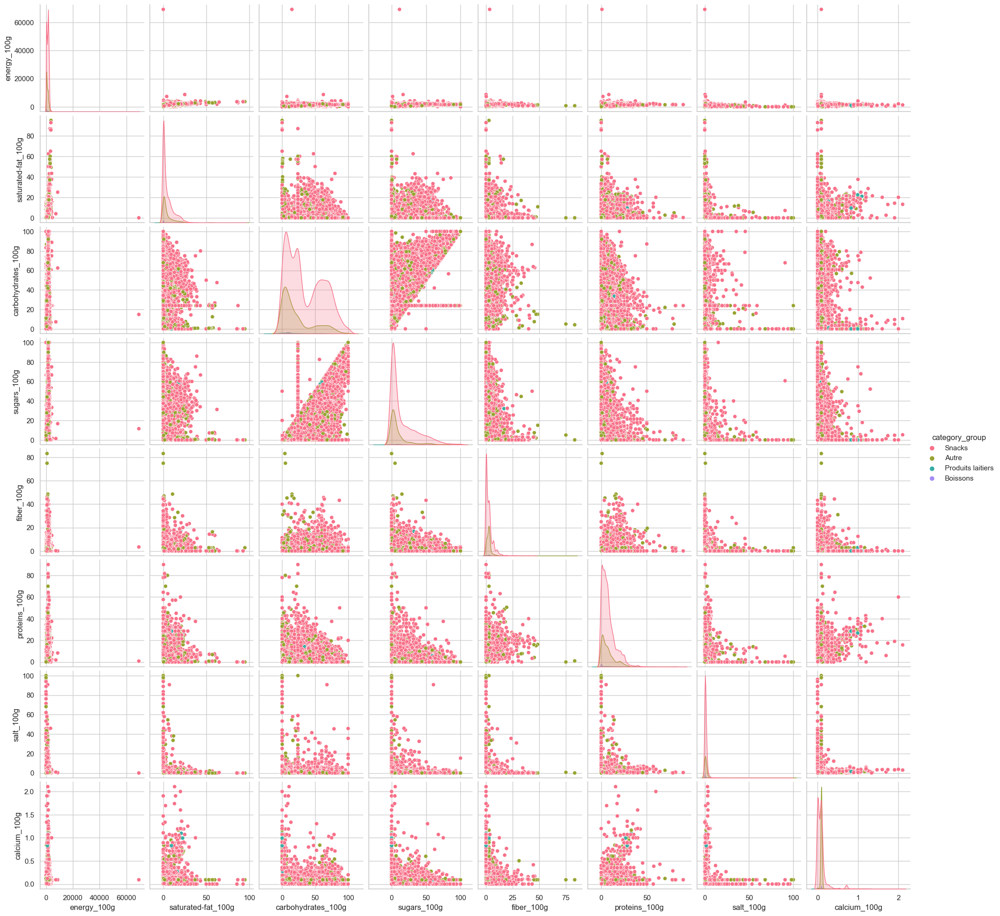

In [106]:
sns.pairplot(subset_products_data, hue='category_group')

<h6>III. Tests Statistiques sur les Catégories :</h6>

**A. Test de Kruskal-Wallis pour déterminer les différences entre les groupes**

In [107]:
# Test de Kruskal-Wallis pour chaque variable quantitative
for column in subset_products_data.columns[:-1]:
    if subset_products_data[column].dtype != 'object':  # Assurez-vous que la colonne est quantitative
        _, p_value = stats.kruskal(*[subset_products_data[column][subset_products_data.category_group == group] for group in subset_products_data.category_group.unique()])
        if p_value < 0.05:
            print(f"La variable {column} est significativement différente entre les groupes de catégories (p-value={p_value})")
        else:
            print(f"La variable {column} n'est pas significativement différente entre les groupes de catégories (p-value={p_value})")

La variable energy_100g est significativement différente entre les groupes de catégories (p-value=1.613460754104322e-63)
La variable saturated-fat_100g est significativement différente entre les groupes de catégories (p-value=5.229503125415548e-23)
La variable carbohydrates_100g est significativement différente entre les groupes de catégories (p-value=2.6655947527057187e-117)
La variable sugars_100g est significativement différente entre les groupes de catégories (p-value=3.936866542923761e-31)
La variable fiber_100g est significativement différente entre les groupes de catégories (p-value=3.79645568536599e-18)
La variable proteins_100g est significativement différente entre les groupes de catégories (p-value=1.3988068744542558e-17)
La variable salt_100g est significativement différente entre les groupes de catégories (p-value=8.6321561051698615e-19)
La variable calcium_100g est significativement différente entre les groupes de catégories (p-value=2.203082395599503e-177)


**B. test du chi-carré pour déterminer 'indépendance entre deux variables catégorielles**

In [108]:
from scipy.stats import chi2_contingency

# Pour chaque paire de variables catégorielles
for col1 in subset_products_data.columns:
    for col2 in subset_products_data.columns:
        if col1 != col2 and subset_products_data[col1].dtype == 'object' and subset_products_data[col2].dtype == 'object':
            # Création du tableau de contingence
            contingency_table = pd.crosstab(subset_products_data[col1], subset_products_data[col2])
            
            # Effectuer le test du chi-carré
            chi2, p_value, _, _ = chi2_contingency(contingency_table)
            
            if p_value < 0.05:
                print(f"Les variables {col1} et {col2} ne sont pas indépendantes (p-value={p_value})")
            else:
                print(f"Les variables {col1} et {col2} sont indépendantes (p-value={p_value})")

Les variables code et quantity sont indépendantes (p-value=0.4534587178936834)
Les variables code et packaging sont indépendantes (p-value=0.407324017858141)
Les variables code et brands sont indépendantes (p-value=0.30476730498089905)
Les variables code et categories sont indépendantes (p-value=0.37334042172680554)
Les variables code et manufacturing_places sont indépendantes (p-value=0.4392759182857309)
Les variables code et stores sont indépendantes (p-value=0.4505624388797344)
Les variables code et nutrition_grade_fr sont indépendantes (p-value=0.4937404459396297)
Les variables code et category_group sont indépendantes (p-value=0.49432088067363605)
Les variables quantity et code sont indépendantes (p-value=0.45345871789289677)
Les variables quantity et packaging ne sont pas indépendantes (p-value=0.0)
Les variables quantity et brands ne sont pas indépendantes (p-value=0.0)
Les variables quantity et categories ne sont pas indépendantes (p-value=0.0)
Les variables quantity et manufac

<h5>2.Variables Quantitatives : </h5>

<h6>I.Relation entre les variables quantitatives</h6>

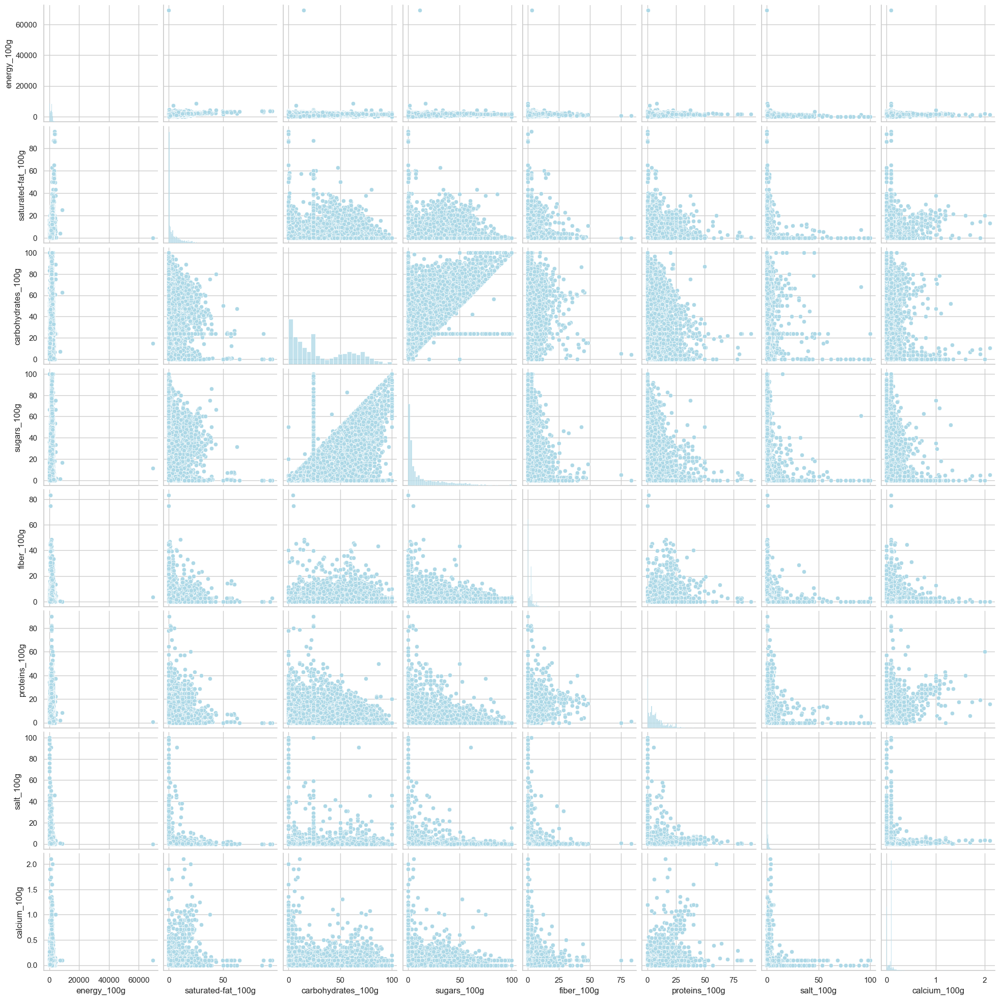

In [109]:
sns.pairplot(subset_products_data)

<h6>II.Diagramme de dispersion</h6>

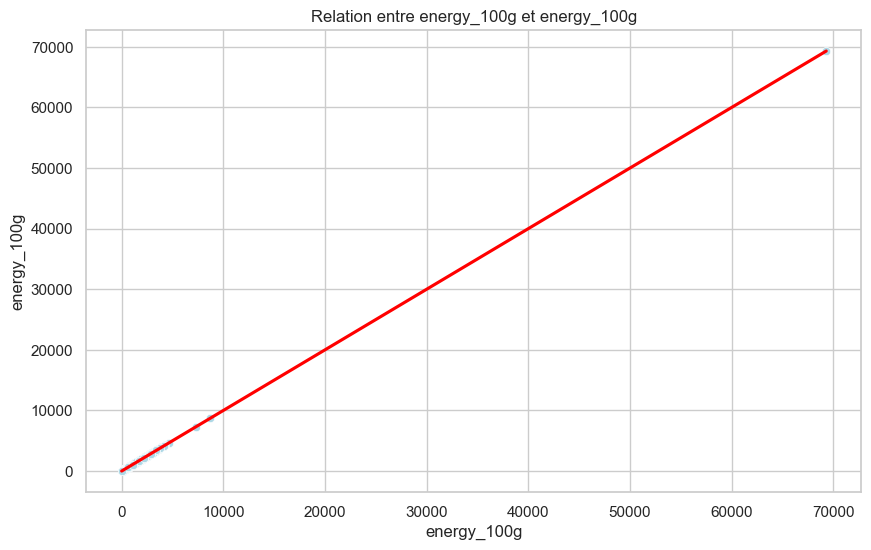

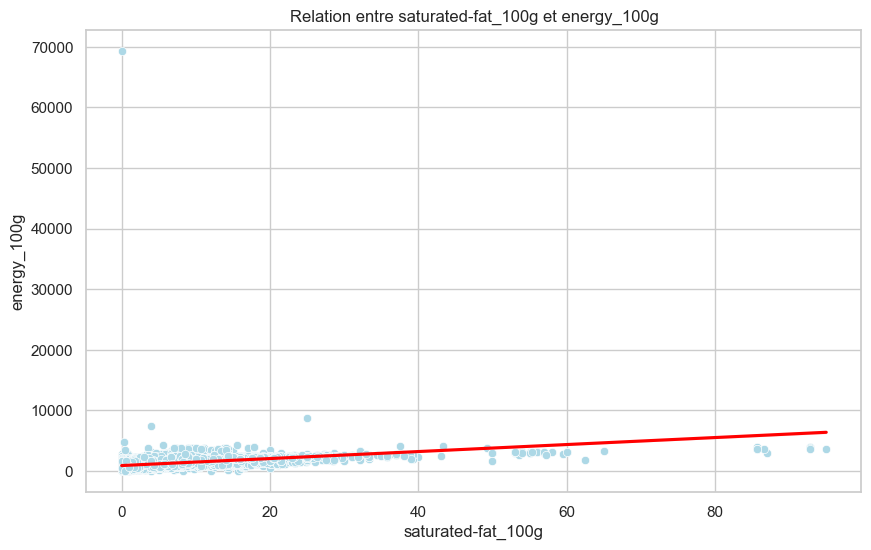

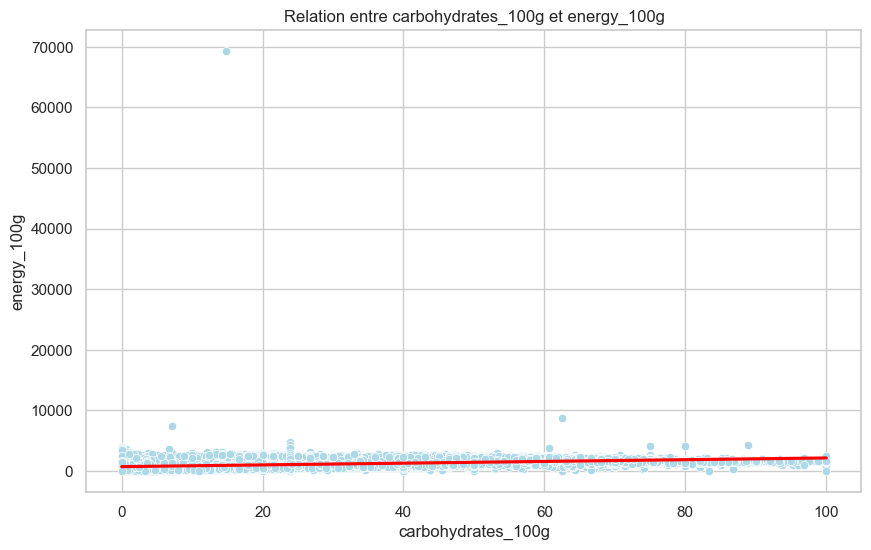

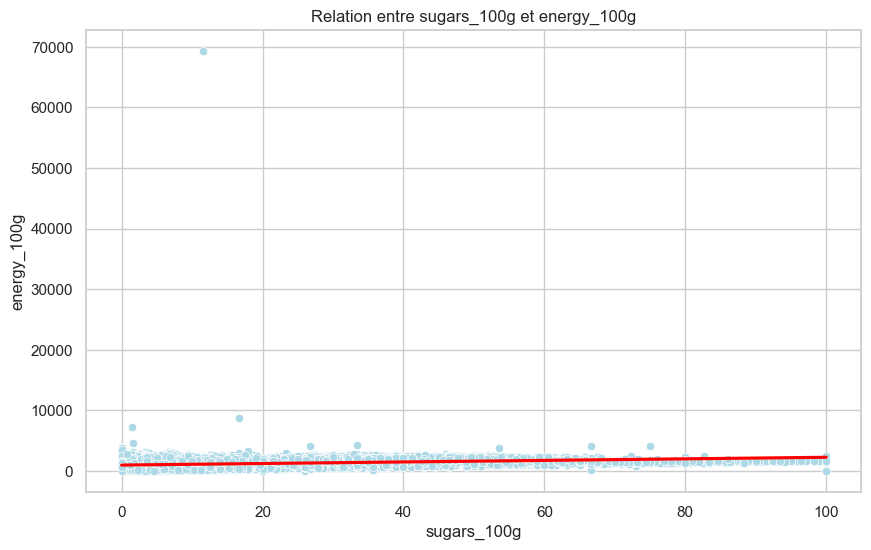

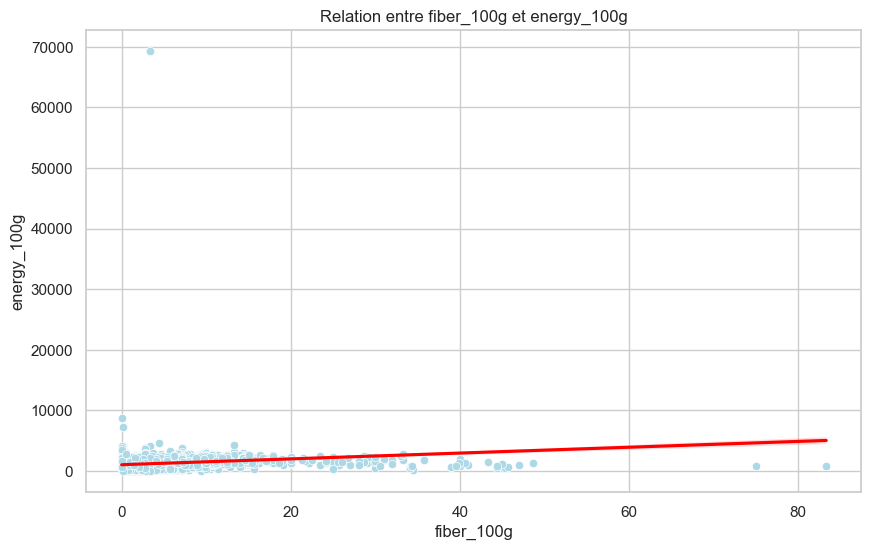

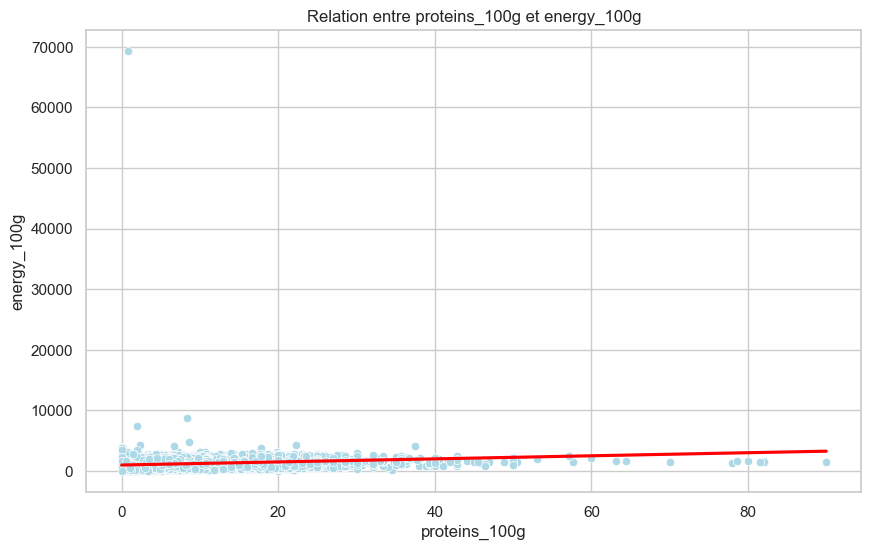

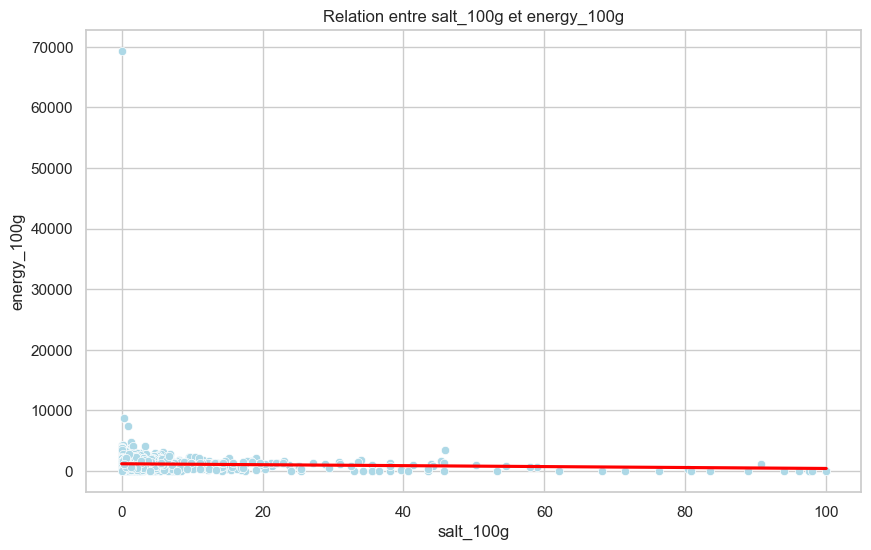

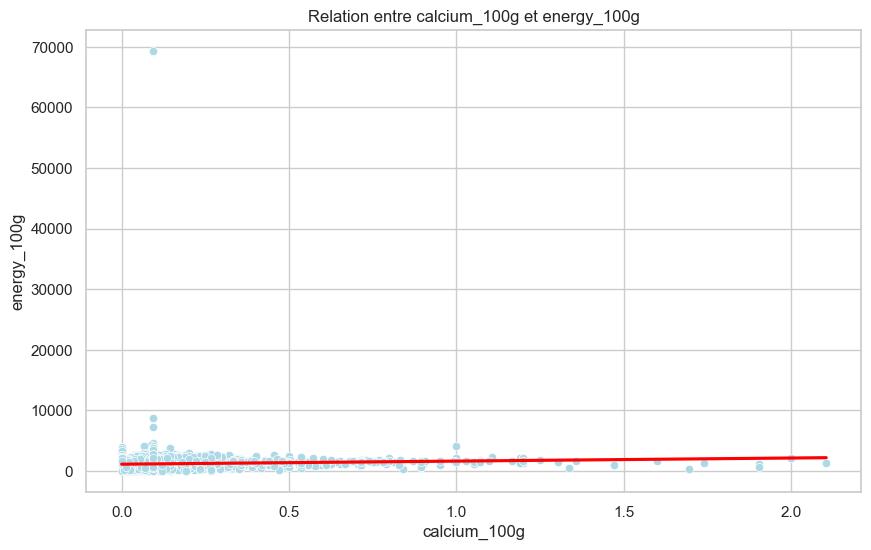

In [110]:
for column in quantitative_columns:
    plt.figure(figsize=(10, 6))
    
    # Visualisation de la relation entre 'column' et 'energy_100g'
    sns.scatterplot(x=column, y='energy_100g', data=subset_products_data)
    sns.regplot(x=column, y='energy_100g', data=subset_products_data, scatter=False, color='red')
    
    plt.title(f'Relation entre {column} et energy_100g')
    plt.show()

**Covariance empirique et coefficient de corrélation de Pearson** 

In [111]:
correlation_results = {}

# Boucle à travers chaque colonne quantitative
for col in quantitative_columns:
    if col != 'energy_100g': # Évite de comparer 'energy_100g' avec lui-même 
        
        # Supprime les lignes où l'une ou l'autre des colonnes a une valeur manquante ou infinie
        filtered_data = subset_products_data[['energy_100g', col]].dropna()
        filtered_data = filtered_data[np.isfinite(filtered_data['energy_100g']) & np.isfinite(filtered_data[col])]
        
        pearson_coefficient = stats.pearsonr(filtered_data['energy_100g'], filtered_data[col])[0]
        covariance = np.cov(filtered_data['energy_100g'], filtered_data[col], ddof=0)[1, 0]
        
        correlation_results[('energy_100g', col)] = {
            'Pearson Coefficient': pearson_coefficient,
            'Covariance': covariance
        }

correlation_df = pd.DataFrame(correlation_results).T
display(correlation_df)

Pearson Coefficient    Covariance
energy_100g saturated-fat_100g             0.424966   3158.170039
            carbohydrates_100g             0.388567  10624.516726
            sugars_100g                    0.253207   5036.645136
            fiber_100g                     0.196211    809.216279
            proteins_100g                  0.201584   1617.429200
            salt_100g                     -0.034427   -154.908425
            calcium_100g                   0.071471     10.106634

<h6>III. Boîte à moustaches</h6>

La boîte à moustaches montre les quartiles, les valeurs aberrantes potentielles et les plages de valeurs.

En comparant les boîtes à moustaches des différentes variables, nous pouvons obtenir des indications sur la corrélation entre elles.

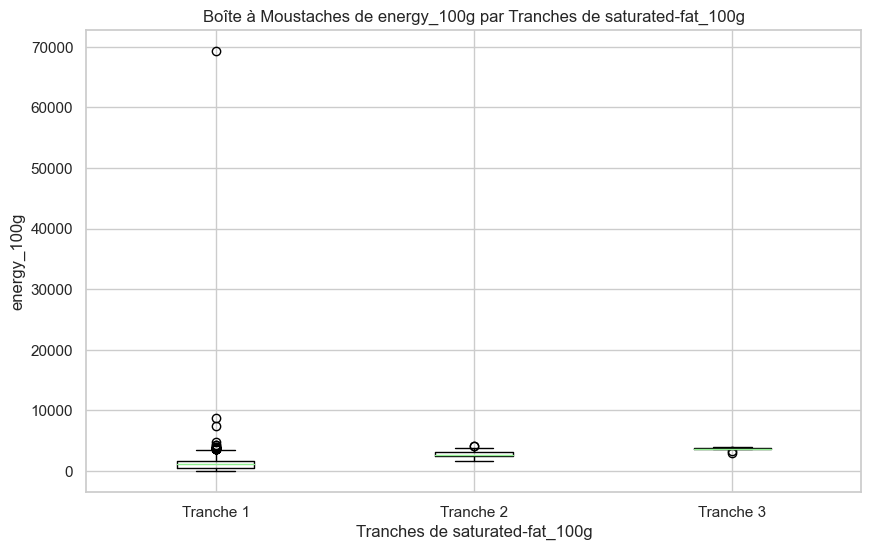

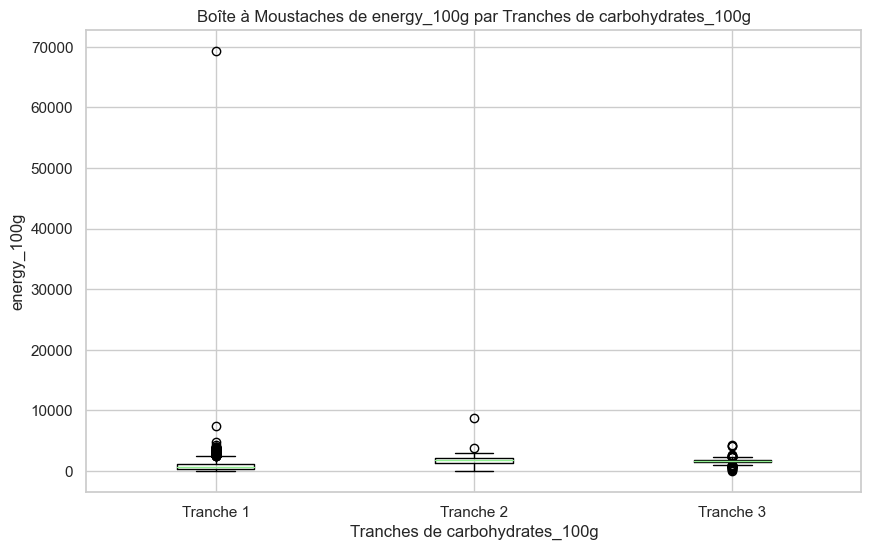

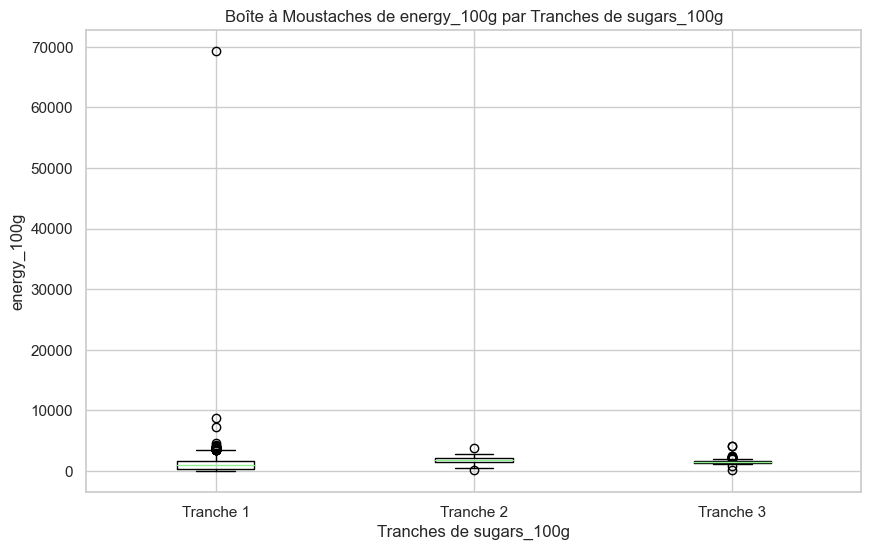

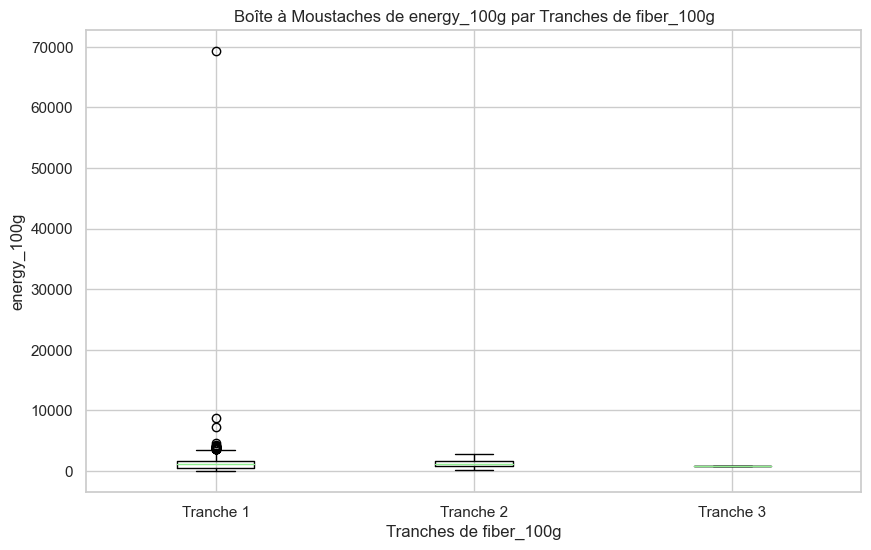

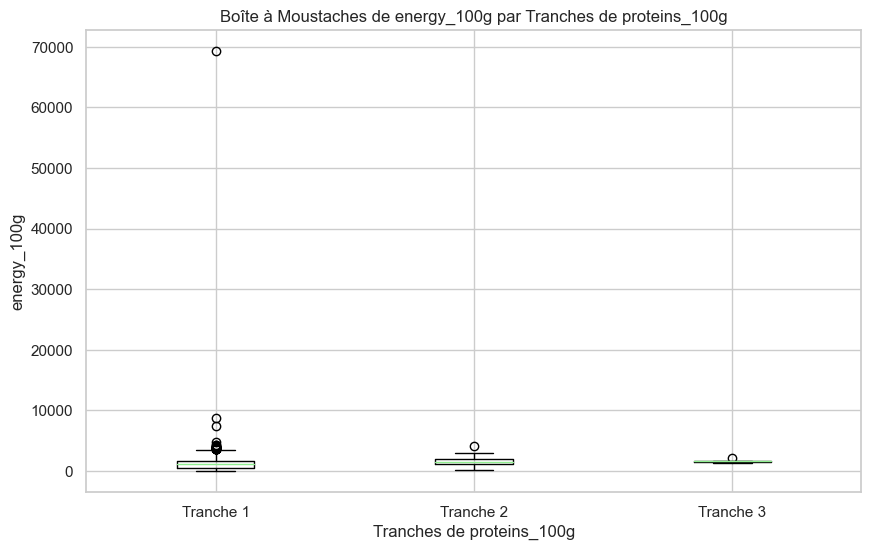

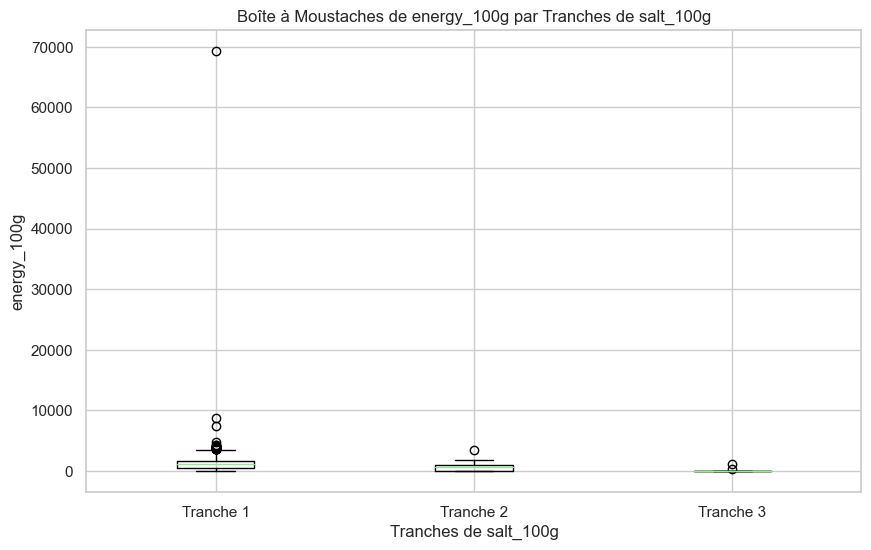

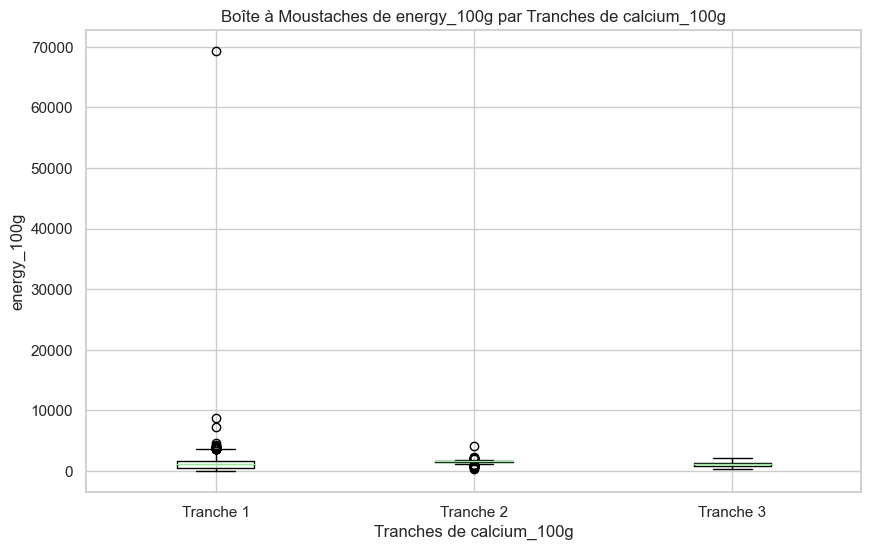

In [112]:
# Pour chaque paire de colonnes quantitatives
for col1, col2 in correlation_df.index:
    # Définition des tranches pour col2
    min_val = subset_products_data[col2].min()
    max_val = subset_products_data[col2].max()
    tranches = [min_val, (min_val + max_val) / 3, 2 * (min_val + max_val) / 3, max_val]

    # Création de la boîte à moustaches pour chaque tranche
    boxes = []
    for i in range(len(tranches) - 1):
        tranche_min = tranches[i]
        tranche_max = tranches[i+1]
        subset = subset_products_data[(subset_products_data[col2] >= tranche_min) & (subset_products_data[col2] < tranche_max)]
        boxes.append(subset[col1].dropna().values)

    # Création du graphique de boîte à moustaches
    plt.figure(figsize=(10, 6))
    plt.boxplot(boxes)
    plt.xticks(range(1, len(boxes) + 1), [f'Tranche {i+1}' for i in range(len(boxes))])
    plt.xlabel(f'Tranches de {col2}')
    plt.ylabel(col1)
    plt.title(f'Boîte à Moustaches de {col1} par Tranches de {col2}')
    plt.show()

<h6>IV. Heatmap</h6>

<Axes: >

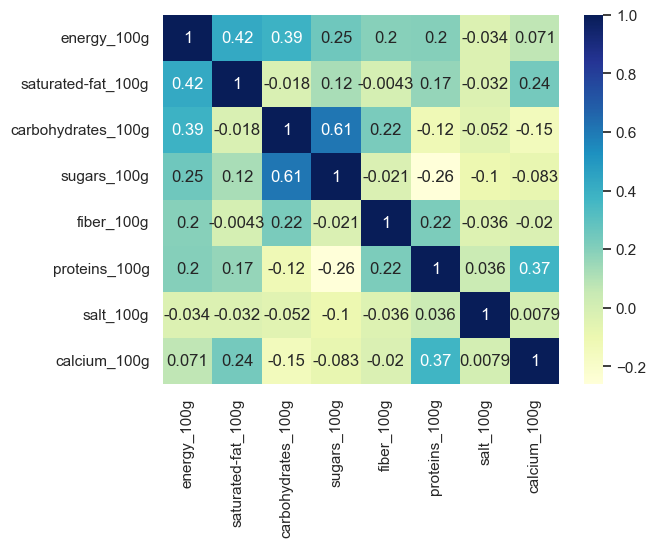

In [113]:
corr_matrix = subset_products_data.corr()
sns.heatmap(corr_matrix,annot=True,cmap="YlGnBu")

<h6>B. Analysez des corrélations :</h6>

<h5>1.Variables Qualitatives : </h5>

In [114]:
# Analyse des tableaux de contingence pour déterminer les corrélations
correlation_summary = {}
percentage_summary = {}

for (col1, col2), table in results.items():
    # Nombre total de cellules non nulles
    correlation = (table > 0).sum().sum()
    correlation_summary[(col1, col2)] = correlation
    
    # Pourcentage de cellules non nulles
    total_cells = table.shape[0] * table.shape[1]
    percentage = round((correlation / total_cells) * 100)
    percentage_summary[(col1, col2)] = percentage

correlation_df = pd.DataFrame.from_dict(correlation_summary, orient='index', columns=['Correlation'])
correlation_df['Percentage'] = percentage_summary.values()

display(correlation_df)

,Correlation,Percentage
"(packaging, brands)",34,38
"(packaging, categories)",28,28
"(packaging, manufacturing_places)",40,44
"(packaging, stores)",61,68
"(brands, packaging)",34,38
"(brands, categories)",25,28
"(brands, manufacturing_places)",23,33
"(brands, stores)",15,25
"(categories, packaging)",28,28
"(categories, brands)",25,28


**Calcul la mesure de contribution à la non-indépendance**

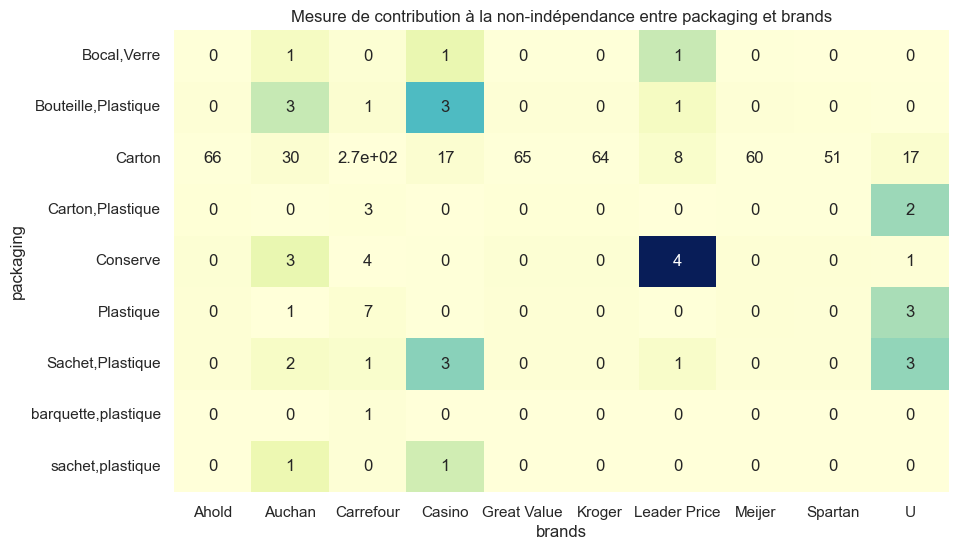

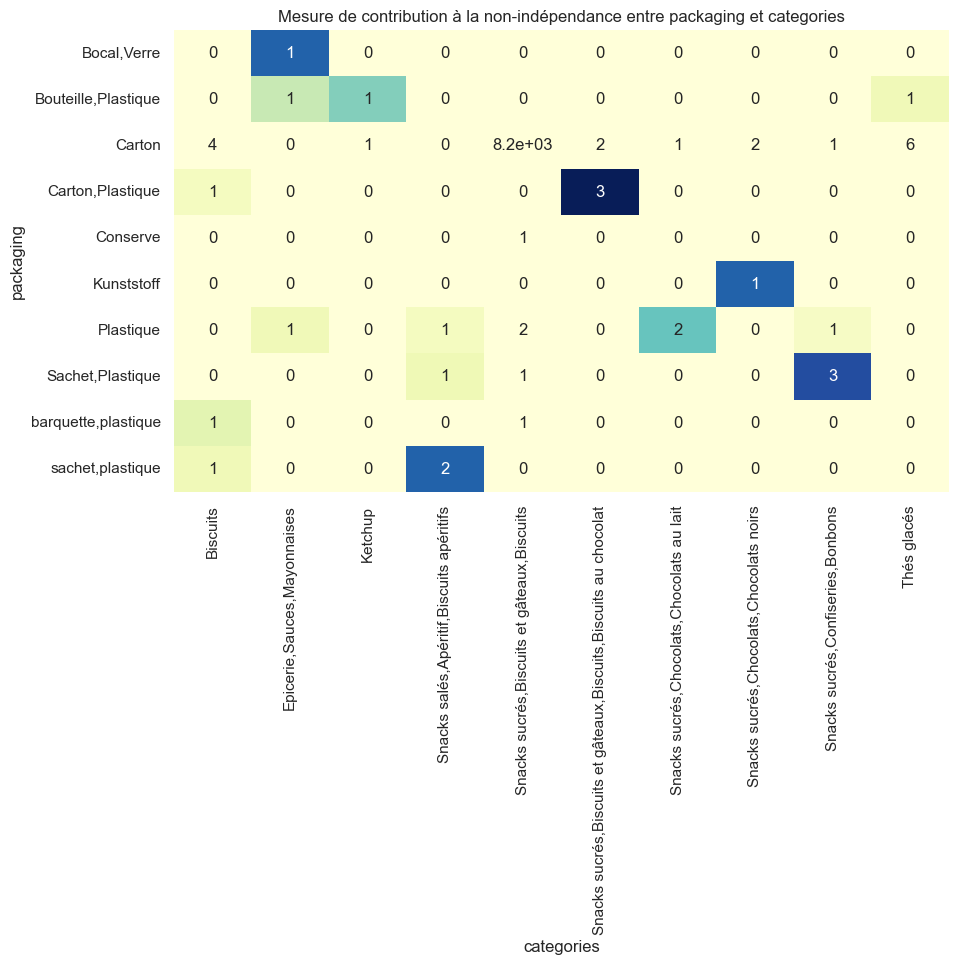

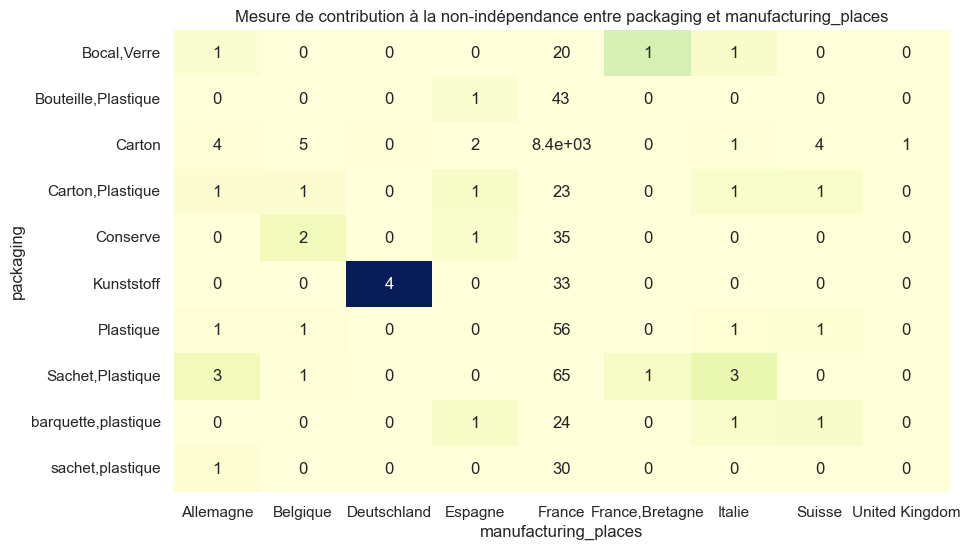

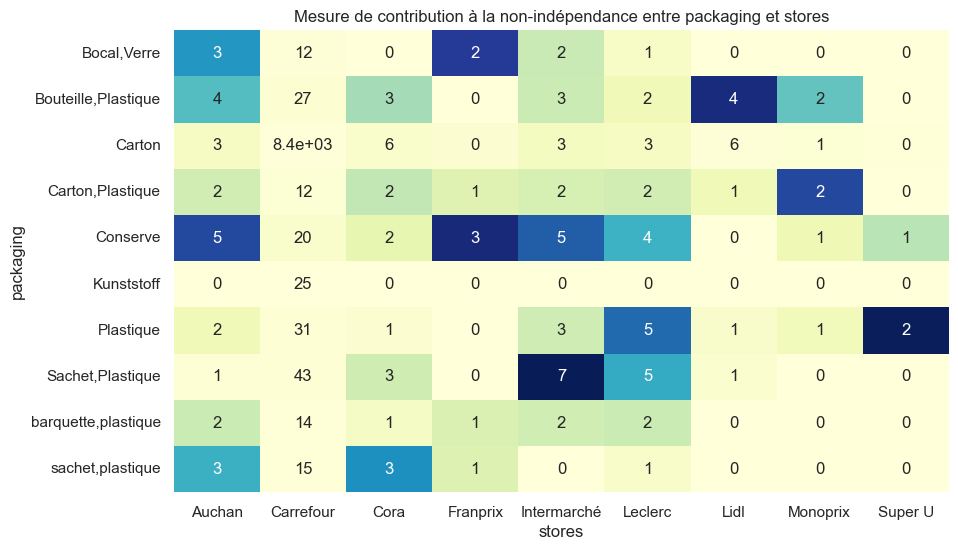

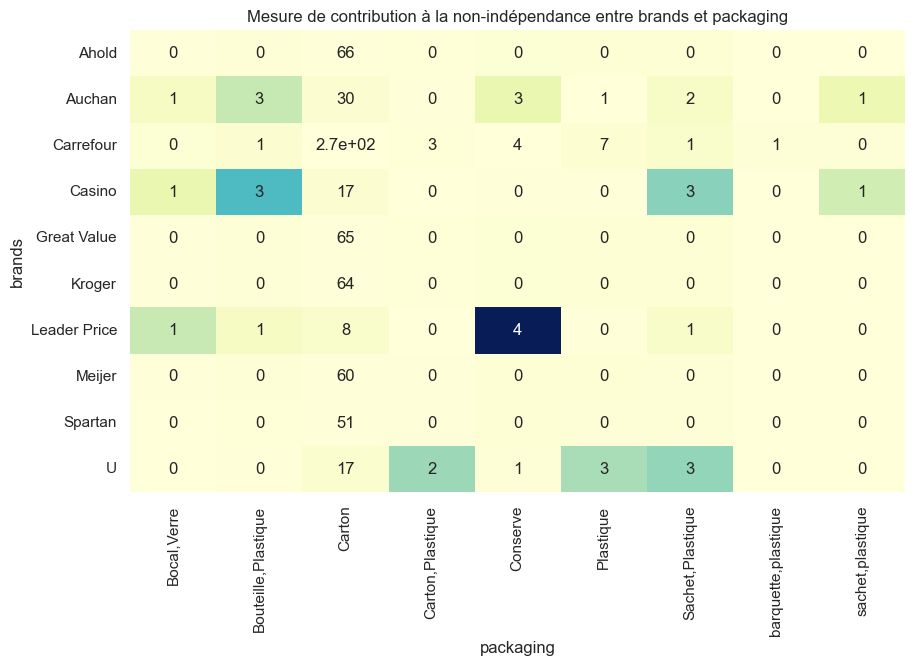

...

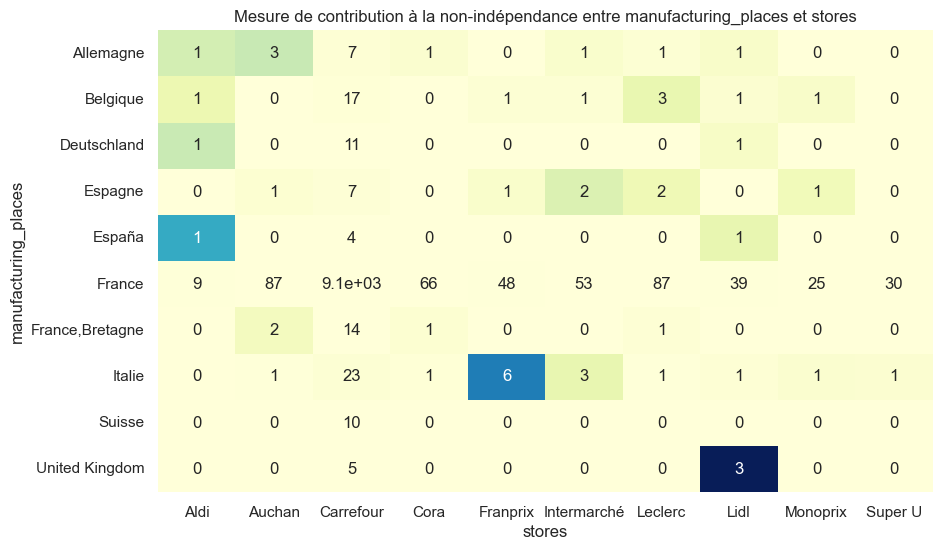

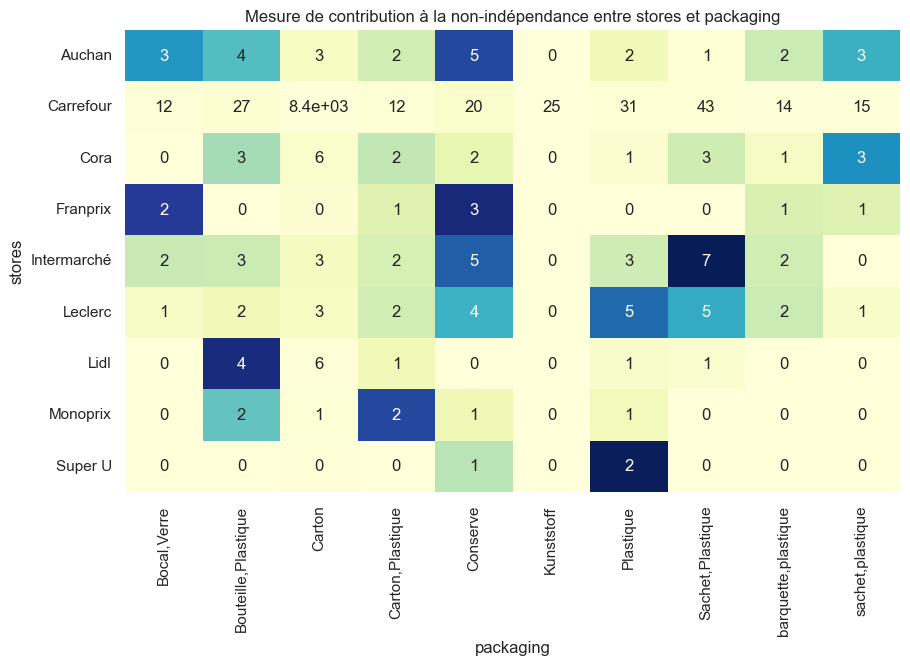

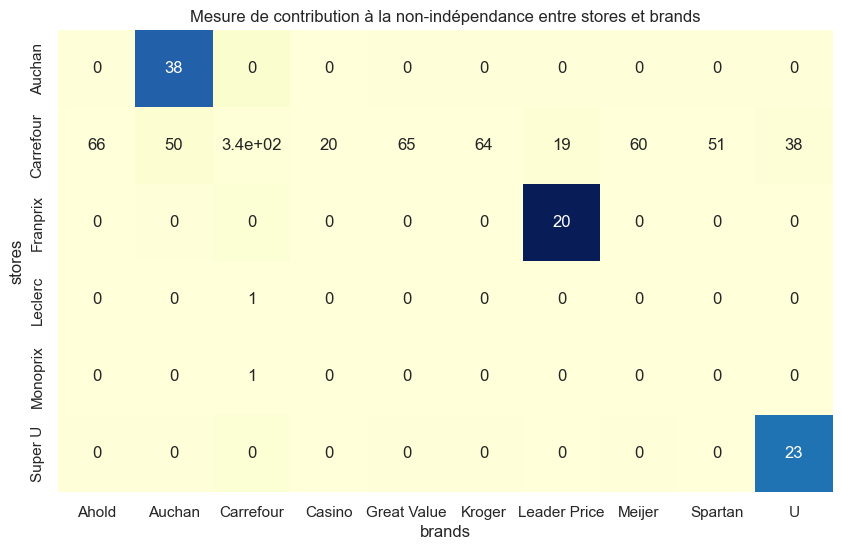

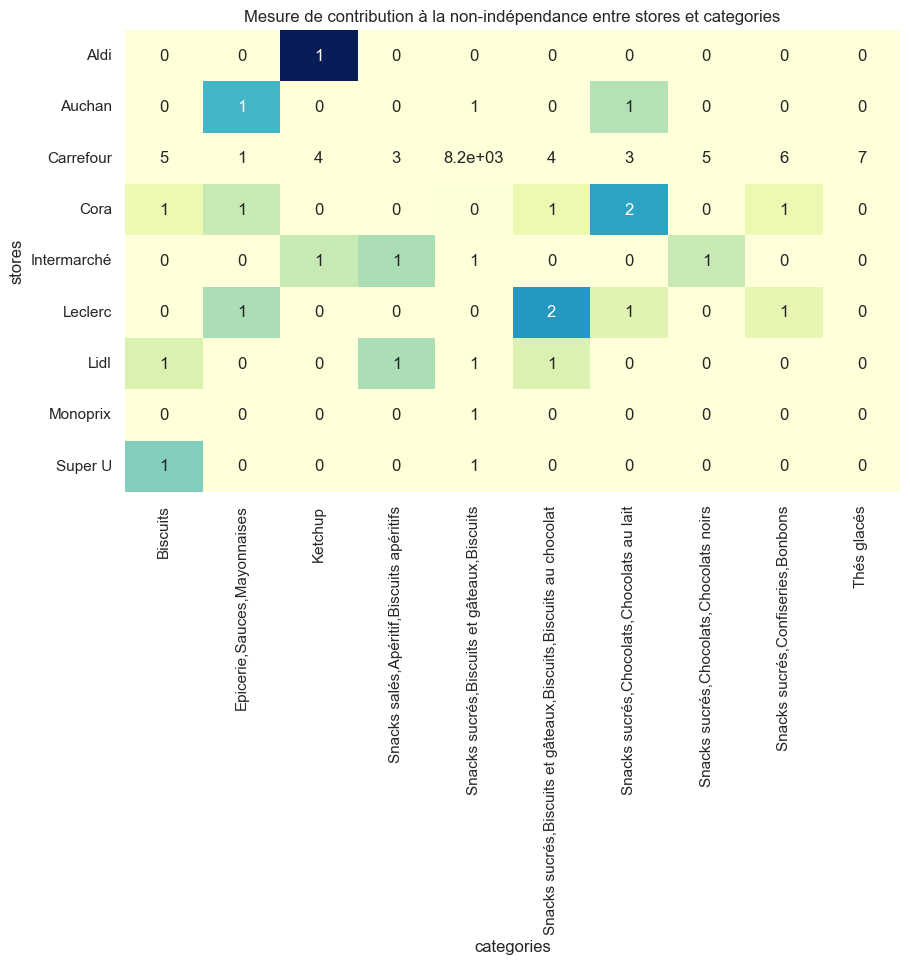

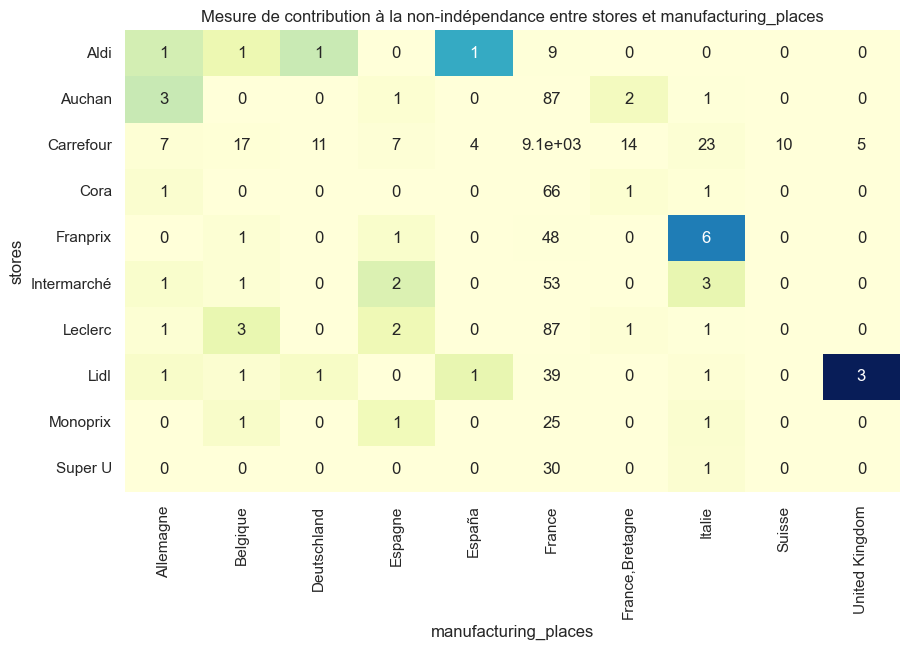

In [115]:
# Pour chaque paire de colonnes qualitatives
for (col1, col2), table in results.items():
    # Calculer les totaux marginaux
    tx = table.sum(axis=1)
    ty = table.sum(axis=0)
    n = table.sum().sum()
    
    # Calcul du tableau des effectifs attendus sous l'hypothèse d'indépendance
    indep = np.outer(tx, ty) / n
    
    # Calcul de la mesure de contribution à la non-indépendance
    measure = (table - indep) ** 2 / indep
    xi_n = measure.sum().sum()
    normalized_measure = measure / xi_n
    
    # heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(normalized_measure, annot=table, cmap="YlGnBu", cbar=False)
    plt.title(f'Mesure de contribution à la non-indépendance entre {col1} et {col2}')
    plt.show()

<h5>2.Variables Quantitatives : </h5>

Suite à notre analyse, il a été observé que la variable saturated-fat_100g présente le coefficient de Pearson le plus élevé (en valeur absolue) en relation avec energy_100g.

Cette variable démontre une corrélation positive modérée avec energy_100g.

Il semble donc pertinent d'initier notre étude par une régression linéaire impliquant ces deux variables.

<h6>I. Régression linéaire : </h6>

**ETAPE 1 : Sélection des variables**

In [116]:
X = subset_products_data['saturated-fat_100g']
Y = subset_products_data['energy_100g']

**ETAPE 2 : Modélisation**

In [117]:
# Redimensionnement des données
X = subset_products_data['saturated-fat_100g'].values.reshape(-1, 1)
Y = subset_products_data['energy_100g'].values

# Création du modèle
model = LinearRegression().fit(X, Y)

**ETAPE 3 : Visualisation**

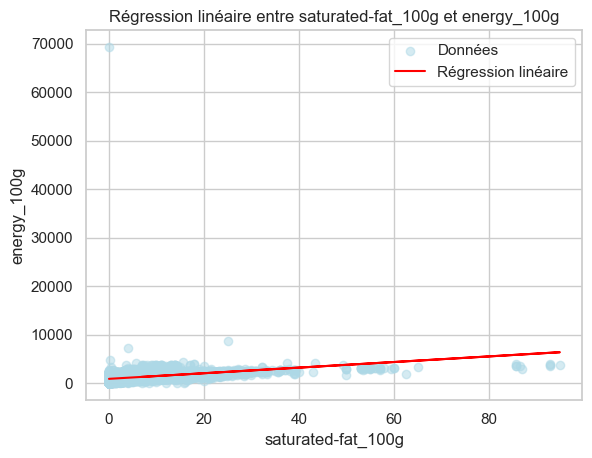

In [118]:
plt.scatter(X, Y, label='Données', alpha=0.5)
plt.plot(X, model.predict(X), color='red', label='Régression linéaire')
plt.xlabel('saturated-fat_100g')
plt.ylabel('energy_100g')
plt.legend()
plt.title('Régression linéaire entre saturated-fat_100g et energy_100g')
plt.show()

**ETAPE 4 : Évaluation du modèle**

In [119]:
print("Coefficient de détermination (R²):", model.score(X, Y))

Coefficient de détermination (R²): 0.18059600986643487


<h1>06 - Analyse Multivariée </h1>

Dans notre ensemble de données, nous avons une multitude de catégories spécifiques.

Pour faciliter l'analyse et la visualisation, nous allons regrouper ces catégories en groupes plus larges basés sur des caractéristiques communes.

Cela nous permettra de réduire la complexité des données tout en conservant les informations essentielles pour notre analyse.

<h6>A. Réduction de dimensionnalité :</h6>

<h5>I. Analyse en Composantes Principales (ACP) pour la fusion de variables corrélé </h5>

<h6> a. Analyse de corrélation :</h6>

In [120]:
#liste de colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']

# Calcul de la matrice de corrélation
correlation_matrix = subset_products_data[quantitative_columns].corr()

# Conversion de la matrice de corrélation en format long
correlation_long = correlation_matrix.unstack().reset_index()
correlation_long.columns = ['Variable 1', 'Variable 2', 'Corrélation']

# Filtrage pour obtenir des paires uniques
correlation_long = correlation_long[correlation_long['Variable 1'] != correlation_long['Variable 2']]

# Fonction pour déterminer le niveau de corrélation
def categorize_correlation(val):
    val = abs(val)  # Nous nous intéressons à la valeur absolue de la corrélation
    if val < 0.2:
        return 'Nul'
    elif val < 0.5:
        return 'Faible'
    elif val < 0.8:
        return 'Moyen'
    else:
        return 'Fort'

correlation_long['Niveau de corrélation'] = correlation_long['Corrélation'].apply(categorize_correlation)

# Fonction pour attribuer une couleur en fonction du niveau de corrélation
def color_correlation(val):
    color_map = {
        'Nul': 'background-color: red',
        'Faible': 'background-color: lightblue',
        'Moyen': 'background-color: orange',
        'Fort': 'background-color: green'
    }
    return color_map[val]

# Stylisation du DataFrame
styled_df = correlation_long.style.applymap(color_correlation, subset=['Niveau de corrélation'])


styled_df

,Variable 1,Variable 2,Corrélation,Niveau de corrélation
1,energy_100g,saturated-fat_100g,0.424966,Faible
2,energy_100g,carbohydrates_100g,0.388567,Faible
3,energy_100g,sugars_100g,0.253207,Faible
4,energy_100g,fiber_100g,0.196211,Nul
5,energy_100g,proteins_100g,0.201584,Faible
6,energy_100g,salt_100g,-0.034427,Nul
7,energy_100g,calcium_100g,0.071471,Nul
8,saturated-fat_100g,energy_100g,0.424966,Faible
10,saturated-fat_100g,carbohydrates_100g,-0.018265,Nul
11,saturated-fat_100g,sugars_100g,0.122076,Nul


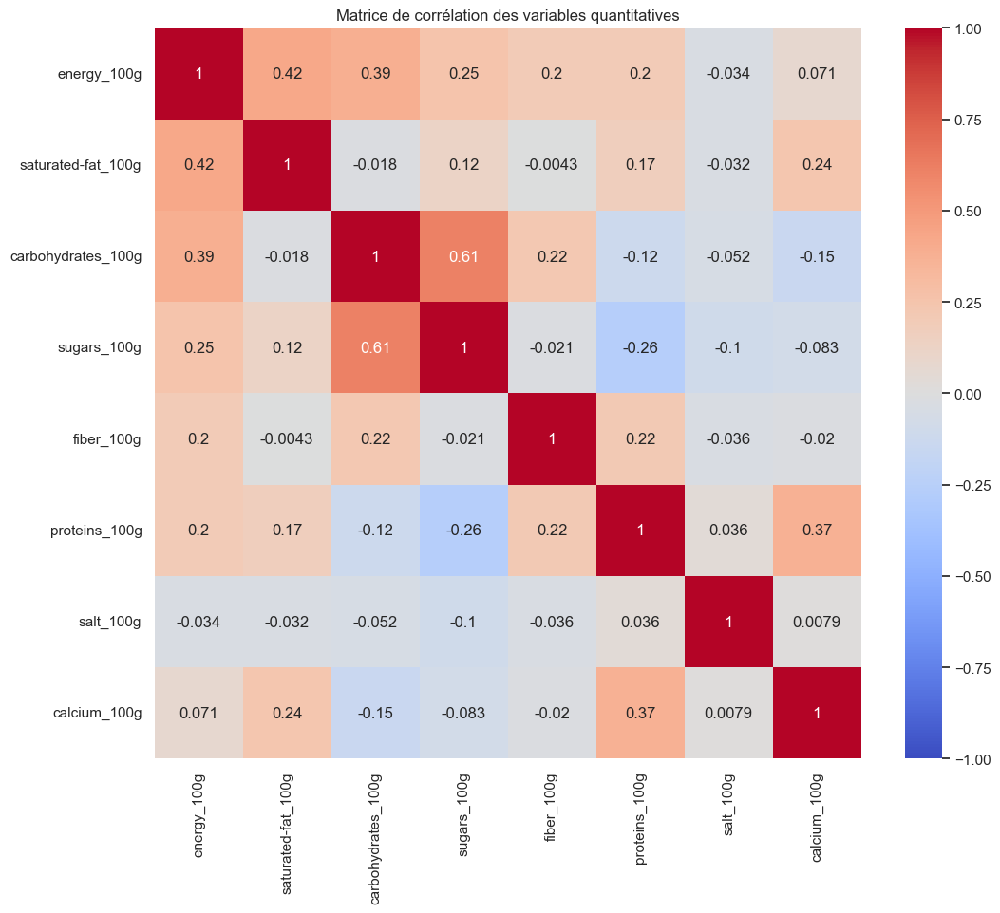

In [121]:
# Sélection des variables quantitatives
data_quantitative = subset_products_data[quantitative_columns]

# Calcul de la matrice
correlation_matrix = data_quantitative.corr()

# Affichage de la matrice
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Matrice de corrélation des variables quantitatives")
plt.show()

Suite à l'analyse des coefficients de corrélation entre nos variables quantitatives, il a été observé que les variables carbohydrates_100g et sugars_100g présentent une corrélation significative. 

Afin d'optimiser la représentativité de notre jeu de données tout en réduisant sa dimensionnalité, nous avons décidé d'appliquer une Analyse en Composantes Principales (ACP) sur ces deux variables spécifiques.

L'objectif est de fusionner ces deux caractéristiques en une seule composante principale, qui sera ensuite intégrée dans notre dataframe subset_products_data pour une meilleure représentation synthétique de l'information contenue dans ces deux variables.

<h6> b. Préparation des données :</h6>

 Pour cette ACP, nous nous concentrerons sur les variables quantitatives.

In [122]:
X = subset_products_data[['carbohydrates_100g', 'sugars_100g']].values

Standardisation des données pour avoir une moyenne de 0 et un écart-type de 1.

In [123]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Vérification des statistiques descriptives des données standardisées

In [124]:
idx = ["mean", "std"]
pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1
mean,0.0,0.0
std,1.0,1.0


<h6> c. Construction de l'ACP :</h6>

Utilisation de la classe PCA de scikit-learn.

In [125]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

<h6> d. Interprétation de l'ACP:</h6>

Ce DataFrame nous donnera une vue d'ensemble de la variance expliquée par chaque dimension et de la somme cumulée. 
Cela nous aide à déterminer combien de dimensions (ou composantes principales) nous devrions considérer pour votre analyse. 
En général, on choisit le nombre de dimensions qui expliquent une grande partie de la variance (par exemple, 95% ou plus).

In [126]:
# Calcul de la variance expliquée et de la somme cumulée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Création d'un DataFrame pour afficher les résultats
df_results = pd.DataFrame({
    'Dimension': ["Dim" + str(i+1) for i in range(len(explained_variance))],
    'Variance Expliquée (%)': explained_variance * 100,
    'Somme Cumulée (%)': cumulative_variance * 100
})

print(df_results)

  Dimension  Variance Expliquée (%)  Somme Cumulée (%)
0      Dim1               80.539497          80.539497
1      Dim2               19.460503         100.000000


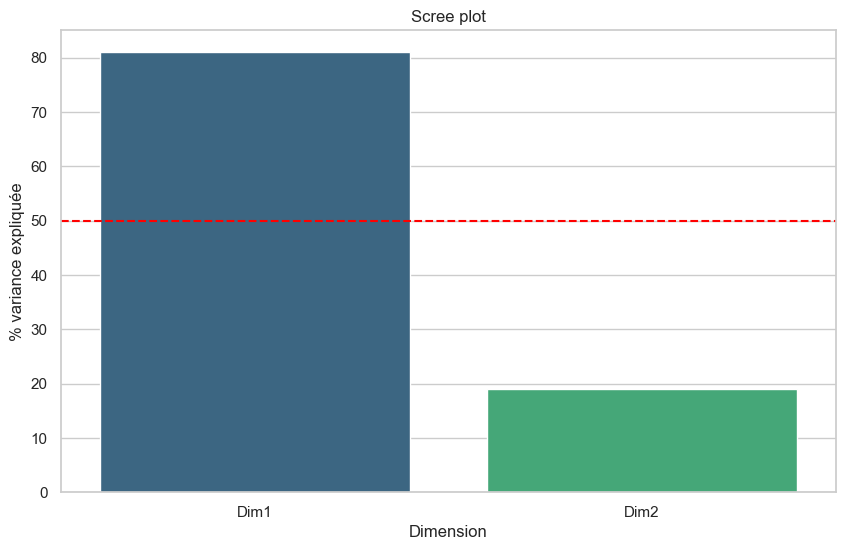

In [127]:
# Analyse des valeurs propres
explained_variance = pca.explained_variance_ratio_
comp = pd.DataFrame(
    {
        "Dimension": ["Dim" + str(x + 1) for x in range(len(explained_variance))],
        "Valeur propre": pca.explained_variance_,
        "% variance expliquée": np.round(explained_variance * 100),
        "% cum. var. expliquée": np.round(np.cumsum(explained_variance) * 100)
    }
)

# Scree plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Dimension", y="% variance expliquée", data=comp, palette="viridis")
plt.axhline(y=100/len(explained_variance), color="red", linestyle="--")
plt.title("Scree plot")
plt.show()


Ce graphique montre la proportion de la variance totale expliquée par chaque dimension et par toutes les dimensions précédentes combinées. C'est utile pour déterminer combien de dimensions (ou composantes principales) sont nécessaires pour capturer une grande partie de la variance dans les données

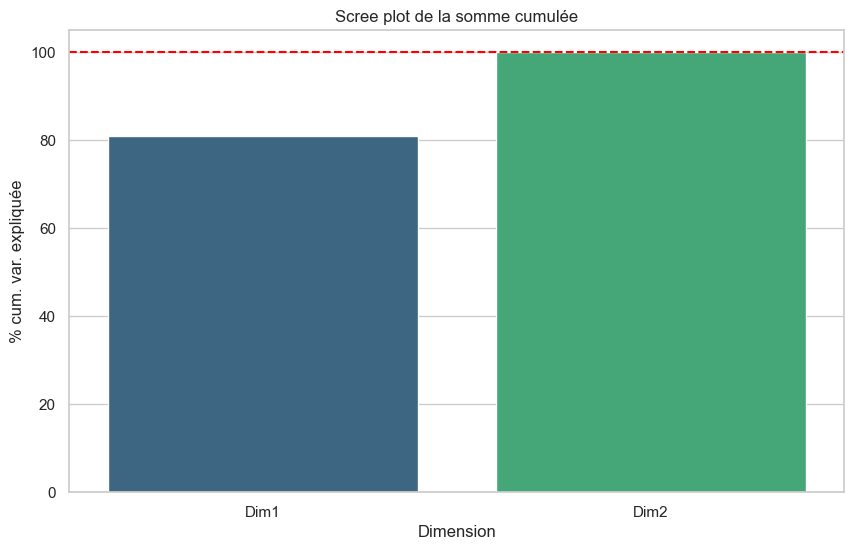

In [128]:
# Scree plot pour la somme cumulée
plt.figure(figsize=(10, 6))
sns.barplot(x="Dimension", y="% cum. var. expliquée", data=comp, palette="viridis")
plt.axhline(y=100, color="red", linestyle="--")  # ligne à 100% pour référence
plt.title("Scree plot de la somme cumulée")
plt.show()

On affiche graphiquement la variance expliquée par chaque composante principale (sous forme de barres) et la variance cumulée (sous forme de ligne). Cela permet d'avoir une vue d'ensemble de l'information captée par les composantes principales.

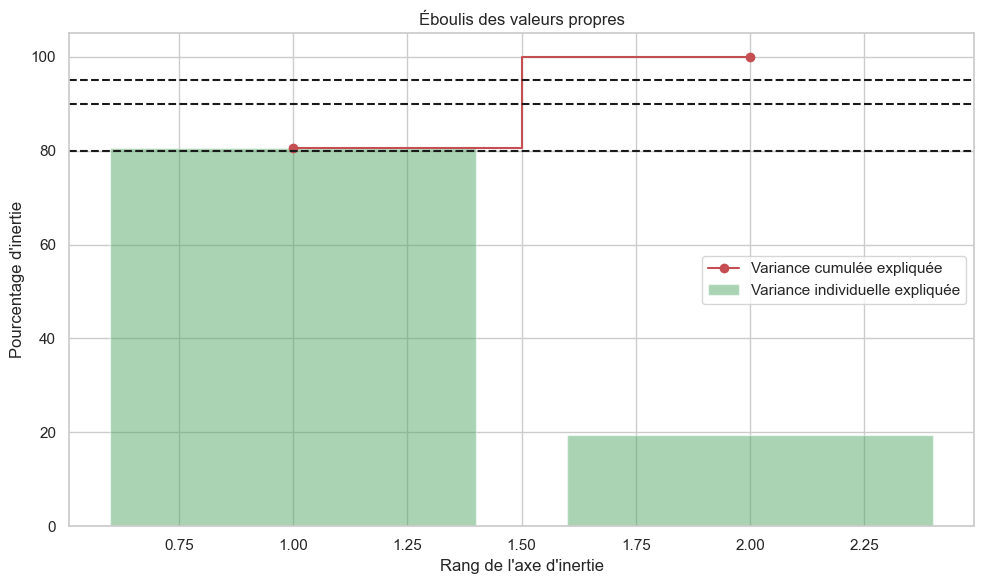

In [129]:
# Calcul des valeurs propres et pourcentages d'inertie
eigenvalues = pca.explained_variance_
explained_variance_ratio = pca.explained_variance_ratio_ * 100
cumulative_variance = np.cumsum(explained_variance_ratio)

# Création de l'éboulis des valeurs propres
x_list = range(1, len(eigenvalues) + 1)

plt.figure(figsize=(10, 6))
plt.bar(x_list, explained_variance_ratio, alpha=0.5, align='center', label='Variance individuelle expliquée', color='g')
plt.step(x_list, cumulative_variance, where='mid', label="Variance cumulée expliquée", color='r', marker='o')
plt.axhline(y=80, color='k', linestyle='--')
plt.axhline(y=90, color='k', linestyle='--')
plt.axhline(y=95, color='k', linestyle='--')

plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres")
plt.legend(loc='best')
plt.tight_layout()
plt.show()

Suite à notre analyse des variances expliquées par les composantes principales, il est clairement observé que la première dimension (Dim1) explique à elle seule 82.70% de la variance totale, tandis que la deuxième dimension (Dim2) apporte un complément pour atteindre 100%.

Ainsi, en considérant uniquement ces deux dimensions, nous sommes en mesure de représenter intégralement l'information contenue dans les variables carbohydrates_100g et sugars_100g.

Cette réduction dimensionnelle nous offre une représentation synthétique et optimisée de notre jeu de données initial.

<h6> e. Visualisation des données dans l'espace réduit :</h6>

**Cercle de corrélation des variables :**

Cela nous permet de visualiser comment chaque variable contribue à chaque dimension.

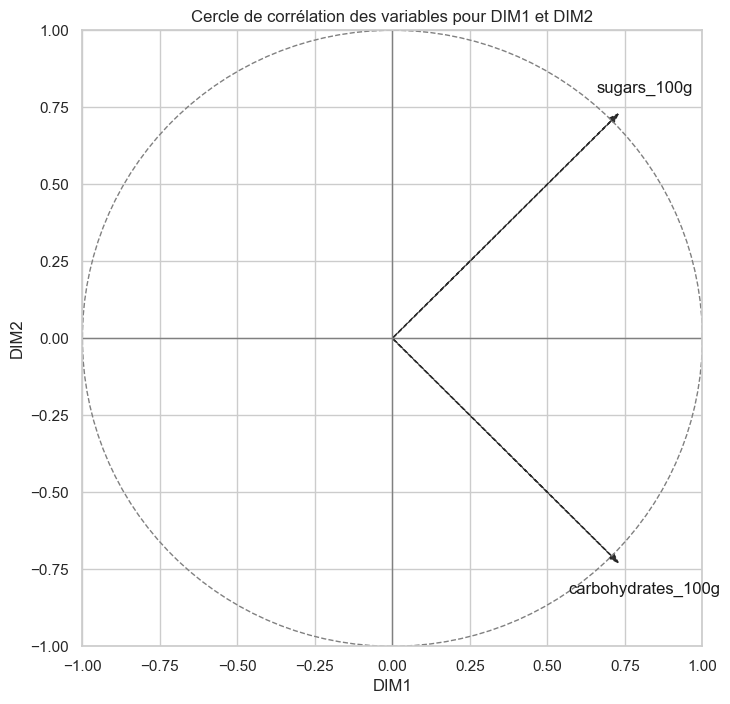

In [130]:
# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = ['carbohydrates_100g', 'sugars_100g']

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[0:2, :])
n = coeff.shape[0]

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# Placer le cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Ajuster les limites et les axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM1')
plt.ylabel('DIM2')
plt.title('Cercle de corrélation des variables pour DIM1 et DIM2')


plt.show()

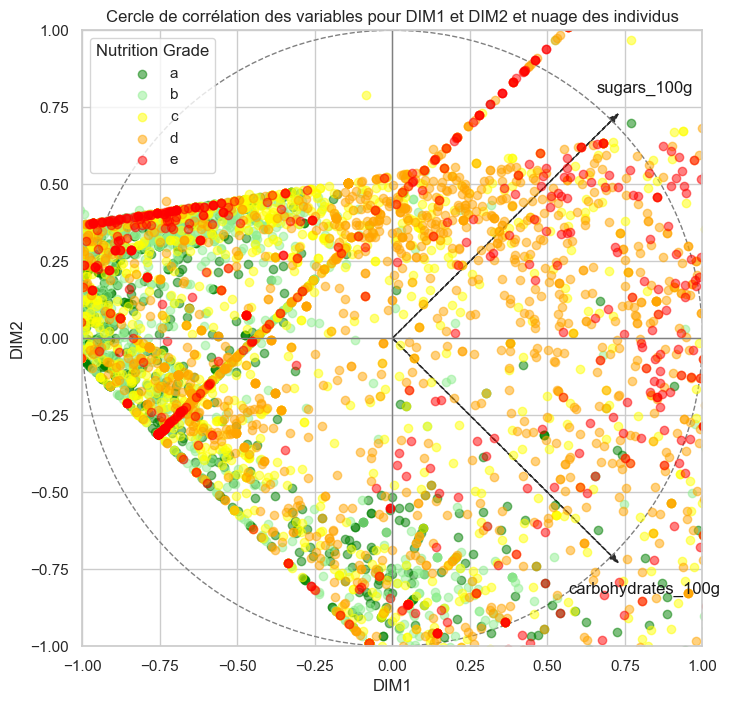

In [131]:
# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = ['carbohydrates_100g', 'sugars_100g']

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[0:2, :])
n = coeff.shape[0]

#  vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Dictionnaire des couleurs pour chaque grade
color_map = {
    'a': 'green',
    'b': 'lightgreen',
    'c': 'yellow',
    'd': 'orange',
    'e': 'red'
}

# Ajout de nuage des individus
for grade, color in color_map.items():
    idx = subset_products_data['nutrition_grade_fr'] == grade
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], color=color, label=grade, alpha=0.5)

#  axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM1')
plt.ylabel('DIM2')
plt.title('Cercle de corrélation des variables pour DIM1 et DIM2 et nuage des individus')
plt.legend(title='Nutrition Grade')


plt.show()

<h6> f. Ajout des variables de notre composantes principales au dataframe :</h6>

In [132]:
subset_products_data['PCA_DIM1'] = X_pca[:, 0]
subset_products_data['PCA_DIM2'] = X_pca[:, 1]

<h5>II. Analyse en Composantes Principales (ACP) :</h5>

Pour cette ACP, nous nous concentrerons sur les variables quantitatives

<h6> a. Préparation des données :</h6>

In [133]:
X = subset_products_data[['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']].values

Standardisation des données pour avoir une moyenne de 0 et un écart-type de 1.

In [134]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Vérification des statistiques descriptives des données standardisées

In [135]:
idx = ["mean", "std"]
pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1,2,3,4,5,6,7
mean,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


<h6> b. Construction de l'ACP :</h6>

Utilisation de la classe PCA de scikit-learn.

In [136]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

<h6>c. Interprétation de l'ACP :</h6>

Ce DataFrame nous donnera une vue d'ensemble de la variance expliquée par chaque dimension et de la somme cumulée. Cela nous aide à déterminer combien de dimensions (ou composantes principales) nous devrions considérer pour votre analyse. En général, on choisit le nombre de dimensions qui expliquent une grande partie de la variance (par exemple, 95% ou plus)

In [137]:
# Calcul de la variance expliquée et de la somme cumulée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Création d'un DataFrame pour afficher les résultats
df_results = pd.DataFrame({
    'Dimension': ["Dim" + str(i+1) for i in range(len(explained_variance))],
    'Variance Expliquée (%)': explained_variance * 100,
    'Somme Cumulée (%)': cumulative_variance * 100
})

print(df_results)

  Dimension  Variance Expliquée (%)  Somme Cumulée (%)
0      Dim1               25.025675          25.025675
1      Dim2               22.031396          47.057071
2      Dim3               14.170447          61.227518
3      Dim4               12.363619          73.591137
4      Dim5               10.027811          83.618948
5      Dim6                7.303073          90.922021
6      Dim7                5.479866          96.401887
7      Dim8                3.598113         100.000000


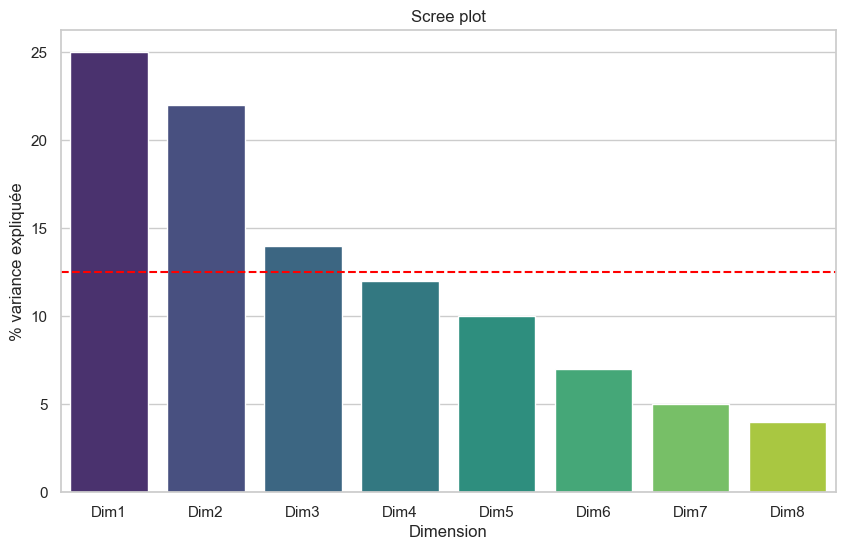

In [138]:
# Analyse des valeurs propres
explained_variance = pca.explained_variance_ratio_
comp = pd.DataFrame(
    {
        "Dimension": ["Dim" + str(x + 1) for x in range(len(explained_variance))],
        "Valeur propre": pca.explained_variance_,
        "% variance expliquée": np.round(explained_variance * 100),
        "% cum. var. expliquée": np.round(np.cumsum(explained_variance) * 100)
    }
)

# Scree plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Dimension", y="% variance expliquée", data=comp, palette="viridis")
plt.axhline(y=100/len(explained_variance), color="red", linestyle="--")
plt.title("Scree plot")
plt.show()


Ce graphique montre la proportion de la variance totale expliquée par chaque dimension et par toutes les dimensions précédentes combinées. C'est utile pour déterminer combien de dimensions (ou composantes principales) sont nécessaires pour capturer une grande partie de la variance dans les données.

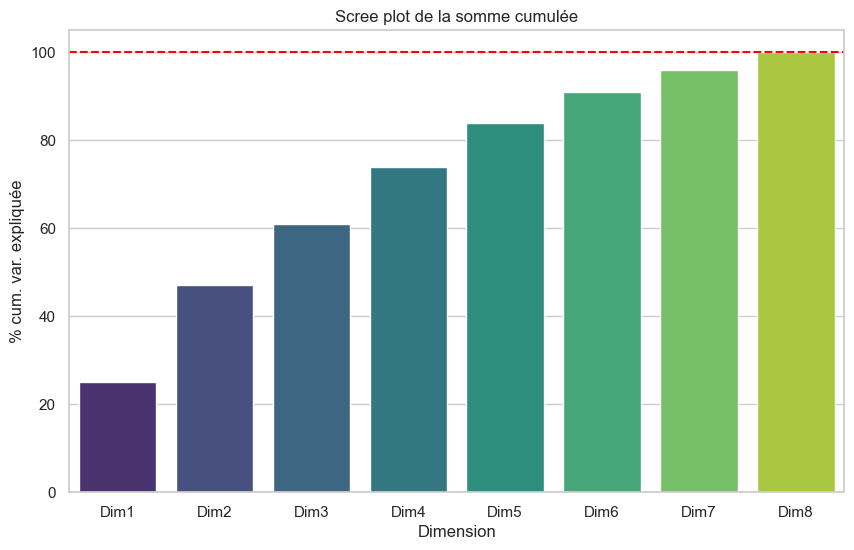

In [139]:
# Scree plot pour la somme cumulée
plt.figure(figsize=(10, 6))
sns.barplot(x="Dimension", y="% cum. var. expliquée", data=comp, palette="viridis")
plt.axhline(y=100, color="red", linestyle="--")  # ligne à 100% pour référence
plt.title("Scree plot de la somme cumulée")
plt.show()

On affiche graphiquement la variance expliquée par chaque composante principale (sous forme de barres) et la variance cumulée (sous forme de ligne). Cela permet d'avoir une vue d'ensemble de l'information captée par les composantes principales.

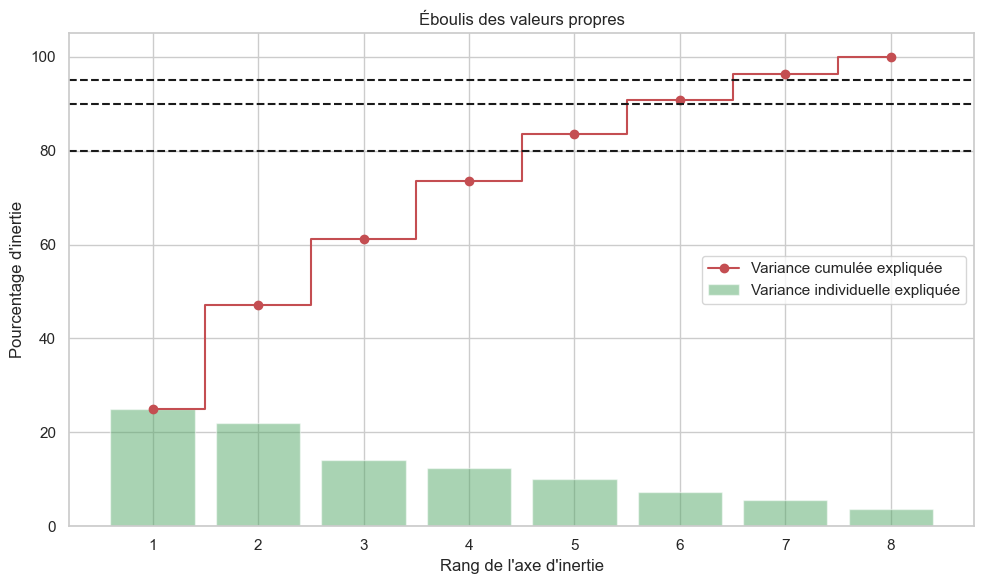

In [140]:
# Calcul des valeurs propres et pourcentages d'inertie
eigenvalues = pca.explained_variance_
explained_variance_ratio = pca.explained_variance_ratio_ * 100
cumulative_variance = np.cumsum(explained_variance_ratio)

# Création de l'éboulis des valeurs propres
x_list = range(1, len(eigenvalues) + 1)

plt.figure(figsize=(10, 6))
plt.bar(x_list, explained_variance_ratio, alpha=0.5, align='center', label='Variance individuelle expliquée', color='g')
plt.step(x_list, cumulative_variance, where='mid', label="Variance cumulée expliquée", color='r', marker='o')
plt.axhline(y=80, color='k', linestyle='--')
plt.axhline(y=90, color='k', linestyle='--')
plt.axhline(y=95, color='k', linestyle='--')

plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres")
plt.legend(loc='best')
plt.tight_layout()
plt.show()

La première dimension (Dim1) explique 25.03% de la variance totale.

 La deuxième dimension (Dim2) ajoute 22.03%, portant la somme cumulée à 47.06%. Si nous ajoutons la troisième dimension (Dim3), qui explique 14.17% de la variance, la somme cumulée atteint 61.23%.

En considérant uniquement les trois premières dimensions, nous sommes en mesure de représenter plus de 60% de l'information contenue dans notre jeu de données initial.

<h6> d. Visualisation des données dans l'espace réduit :</h6>

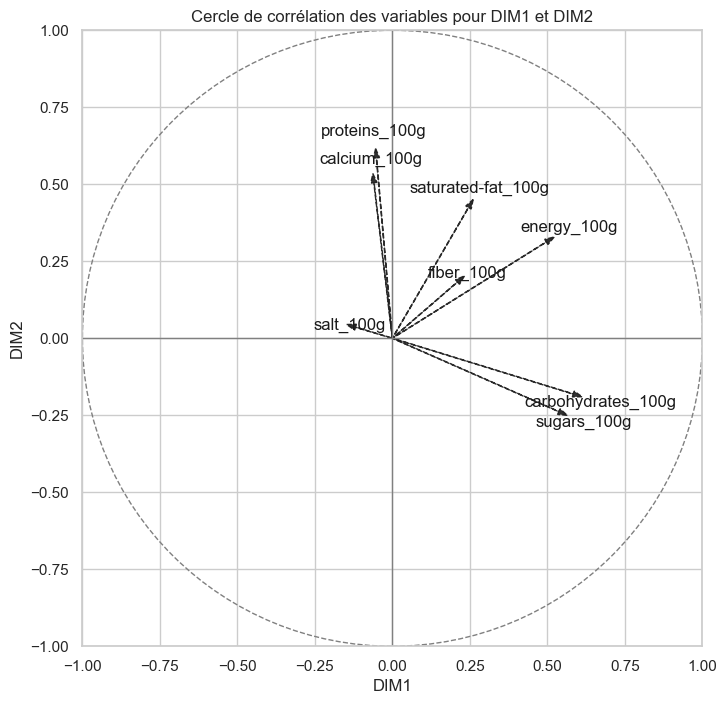

In [141]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
pca.fit(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[0:2, :])
n = coeff.shape[0]

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# Placer le cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Ajuster les limites et les axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM1')
plt.ylabel('DIM2')
plt.title('Cercle de corrélation des variables pour DIM1 et DIM2')

plt.show()

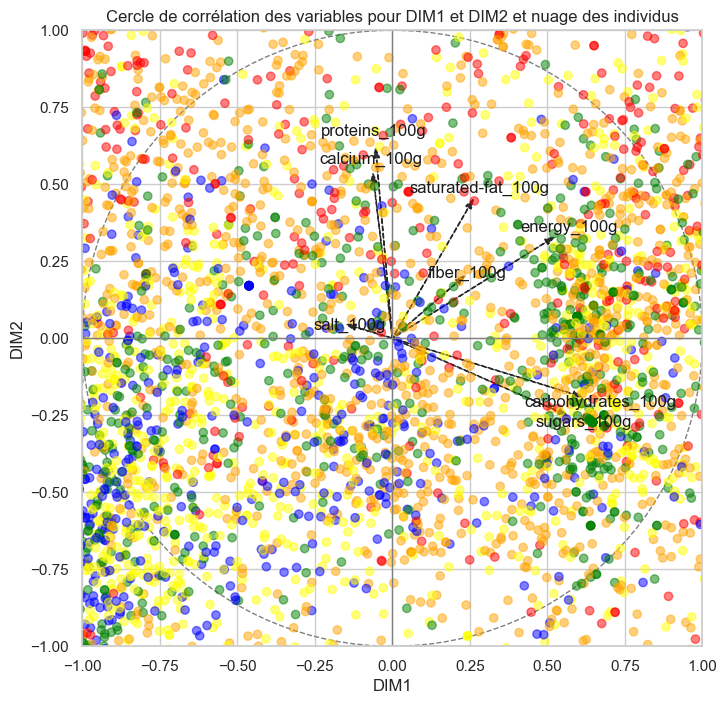

In [142]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[0:2, :])
n = coeff.shape[0]

#vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# Placer le cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Ajout du nuage des individus
colors = subset_products_data['nutrition_grade_fr'].map({
    'a': 'green',
    'b': 'blue',
    'c': 'yellow',
    'd': 'orange',
    'e': 'red'
})
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, alpha=0.5)

#  axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM1')
plt.ylabel('DIM2')
plt.title('Cercle de corrélation des variables pour DIM1 et DIM2 et nuage des individus')

plt.show()

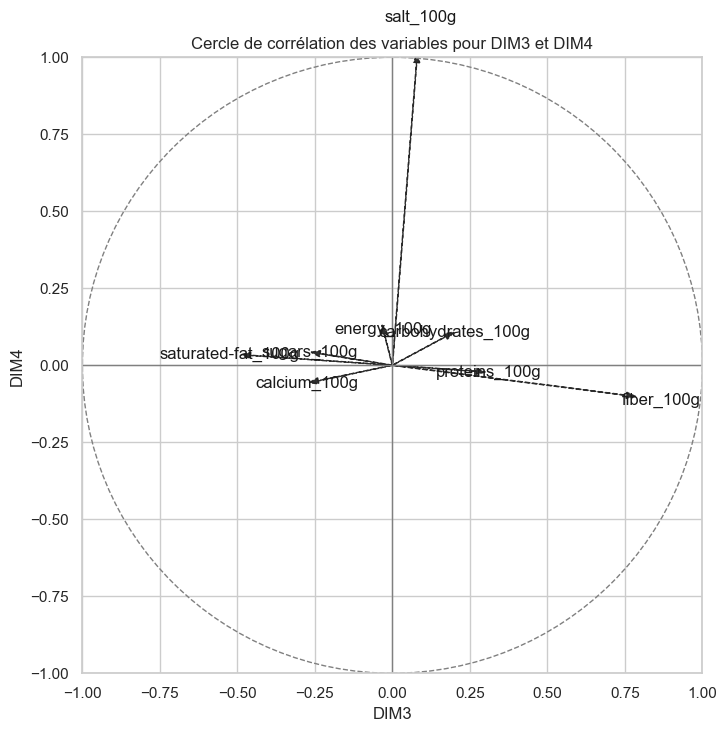

In [143]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
pca.fit(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables pour DIM3 et DIM4
coeff = np.transpose(pca.components_[2:4, :])
n = coeff.shape[0]

# vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--')
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

#  unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM3')
plt.ylabel('DIM4')
plt.title('Cercle de corrélation des variables pour DIM3 et DIM4')

plt.show()

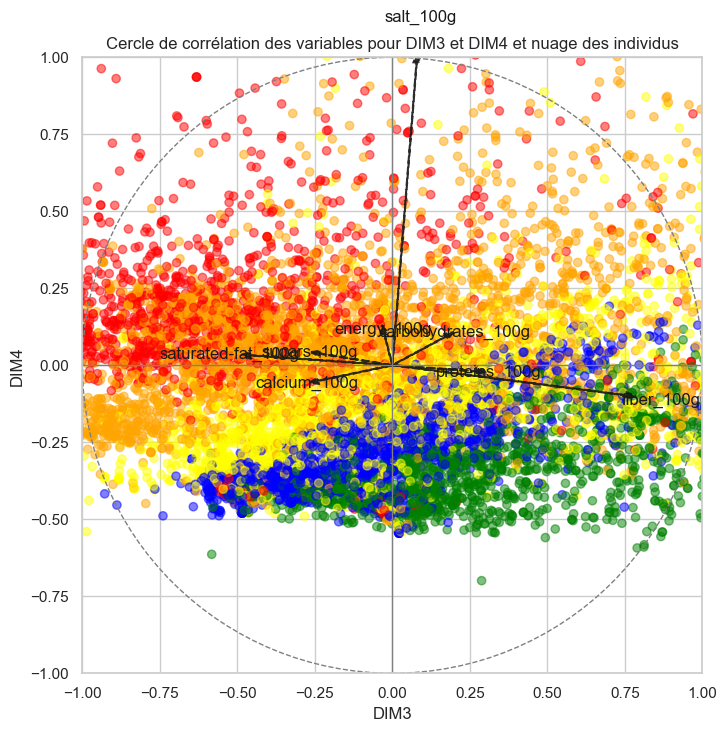

In [144]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[2:4, :])
n = coeff.shape[0]

# Ajouter le nuage des individus
colors = subset_products_data['nutrition_grade_fr'].map({
    'a': 'green',
    'b': 'blue',
    'c': 'yellow',
    'd': 'orange',
    'e': 'red'
})
plt.scatter(X_pca[:, 2], X_pca[:, 3], c=colors, alpha=0.5)

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--', linewidth=1.5)
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM3')
plt.ylabel('DIM4')
plt.title('Cercle de corrélation des variables pour DIM3 et DIM4 et nuage des individus')

plt.show()

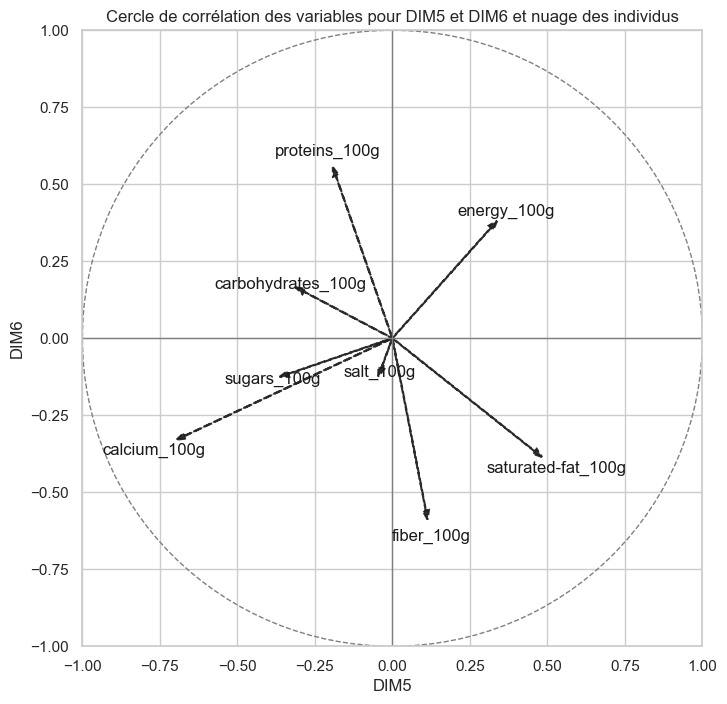

In [145]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[4:6, :])
n = coeff.shape[0]

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--', linewidth=1.5)
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM5')
plt.ylabel('DIM6')
plt.title('Cercle de corrélation des variables pour DIM5 et DIM6 et nuage des individus')

plt.show()

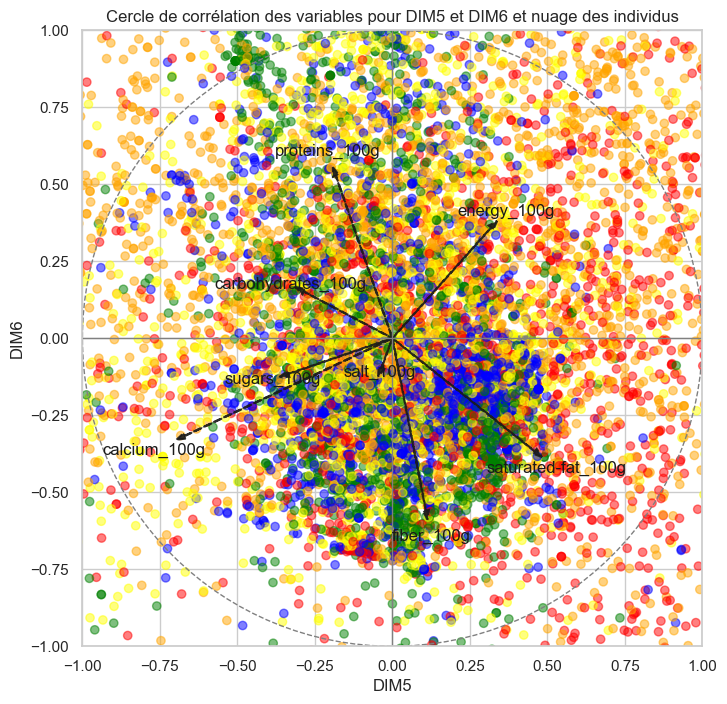

In [146]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[4:6, :])
n = coeff.shape[0]

# Ajouter le nuage des individus
colors = subset_products_data['nutrition_grade_fr'].map({
    'a': 'green',
    'b': 'blue',
    'c': 'yellow',
    'd': 'orange',
    'e': 'red'
})
plt.scatter(X_pca[:, 4], X_pca[:, 5], c=colors, alpha=0.5)

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--', linewidth=1.5)
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

#  cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Ajuster les limites et les axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM5')
plt.ylabel('DIM6')
plt.title('Cercle de corrélation des variables pour DIM5 et DIM6 et nuage des individus')

plt.show()

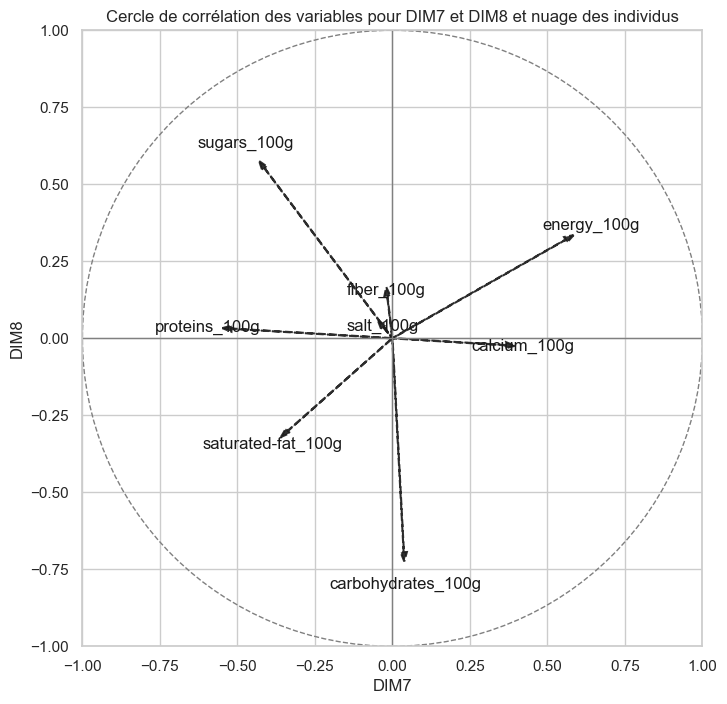

In [147]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[6:8, :])
n = coeff.shape[0]

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--', linewidth=1.5)
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Ajust les limites et les axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM7')
plt.ylabel('DIM8')
plt.title('Cercle de corrélation des variables pour DIM7 et DIM8 et nuage des individus')

# Afficher la figure
plt.show()

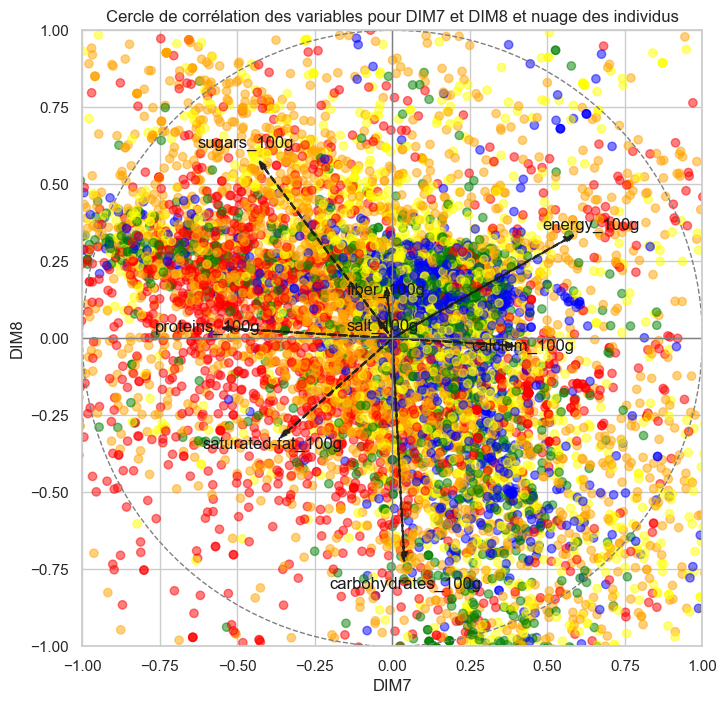

In [148]:
# Filtrer les colonnes quantitatives
quantitative_columns = ['energy_100g','saturated-fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']
X = subset_products_data[quantitative_columns]

# Standardiser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Effectuer l'ACP
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Créer la figure
fig, ax = plt.subplots(figsize=(8, 8))

# Variables utilisées pour l'ACP
features = quantitative_columns

# Calcul des coordonnées des variables
coeff = np.transpose(pca.components_[6:8, :])
n = coeff.shape[0]

# Ajoute le nuage des individus
colors = subset_products_data['nutrition_grade_fr'].map({
    'a': 'green',
    'b': 'blue',
    'c': 'yellow',
    'd': 'orange',
    'e': 'red'
})
plt.scatter(X_pca[:, 6], X_pca[:, 7], c=colors, alpha=0.5)

# Placer les vecteurs des variables
for i in range(n):
    plt.arrow(0, 0, coeff[i, 0], coeff[i, 1], color='k', alpha=0.9, head_width=0.02, linestyle='--', linewidth=1.5)
    plt.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, features[i], color='k', ha='center', va='center')

# cercle unitaire
circle = plt.Circle((0, 0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(circle)

# s axes
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.axhline(0, color='gray', linewidth=1)
plt.axvline(0, color='gray', linewidth=1)
plt.xlabel('DIM7')
plt.ylabel('DIM8')
plt.title('Cercle de corrélation des variables pour DIM7 et DIM8 et nuage des individus')

plt.show()

Les deux premières dimensions, Dim1 et Dim2, contiennent à elles seules près de la moitié (47.06%) de l'information (variance) du jeu de données original.

Cependant,il est judicieux de considérer au moins jusqu'à Dim4 ou Dim5, car elles permettent de couvrir plus de 73% à 83% de la variance totale.

Suite à l'analyse en composantes principales et à l'examen des cercles de corrélation des variables, conjugué au nuage des individus classés selon le grade de Nutri-Score, plusieurs observations pertinentes émergent :

La projection sur les dimensions Dim3 et Dim4 révèle une structuration significative des données. 

Ces dimensions mettent en évidence les relations intrinsèques entre les caractéristiques étudiées et leur influence sur le Nutri-Score.

La distribution des individus dans le nuage, en fonction de leur grade de Nutri-Score, suggère que certaines caractéristiques ont un impact prépondérant sur la classification nutritionnelle

<h6>B. Variables Qualitatives et Quantitatives  :</h6>

Dans cette étape, nous allons étudier la corrélation entre une variable qualitative et une variable quantitative à l'aide de l'ANOVA (Analyse de la variance).

L'objectif est de déterminer s'il existe une relation significative entre les modalités de la variable qualitative et les valeurs de la variable quantitative.

Cette phase d'analyse vise à valider les constatations déduites de l'Analyse en Composantes Principales

<h6> a. Création du sous-échantillon :</h6>

In [170]:
# Variables
X = "nutrition_grade_fr" # qualitative
quantitative_columns = ['energy_100g','saturated_fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g','salt_100g','calcium_100g']

# Sous-échantillon
sous_echantillon = subset_products_data.copy()
sous_echantillon = sous_echantillon.rename(columns={"saturated-fat_100g": "saturated_fat_100g"})

<h6> b. Visualisation :</h6>

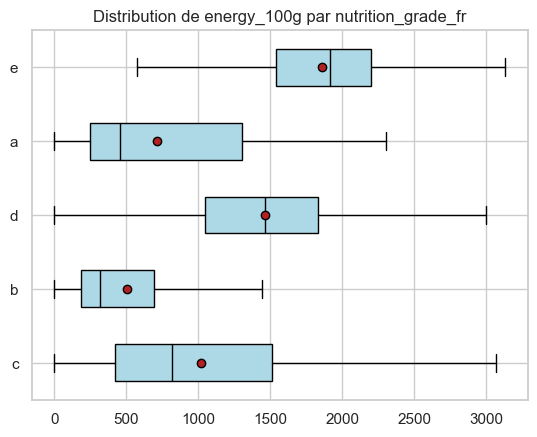

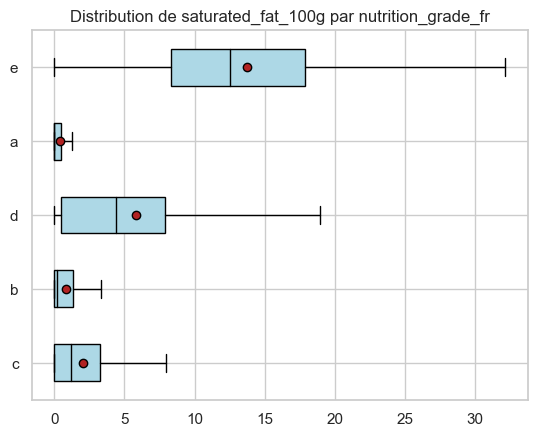

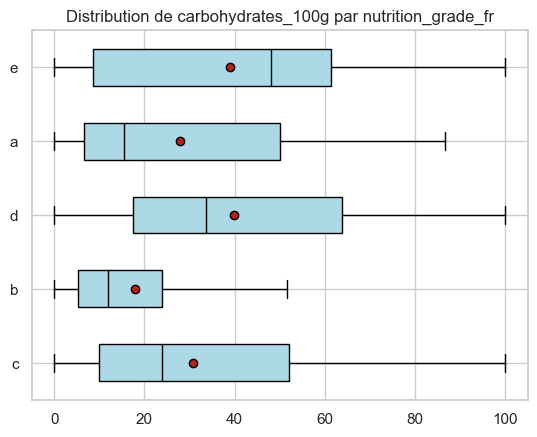

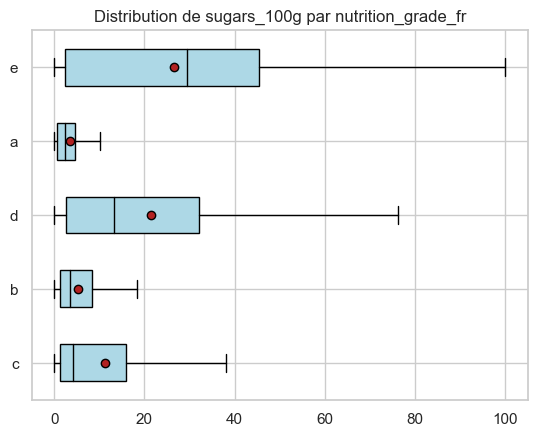

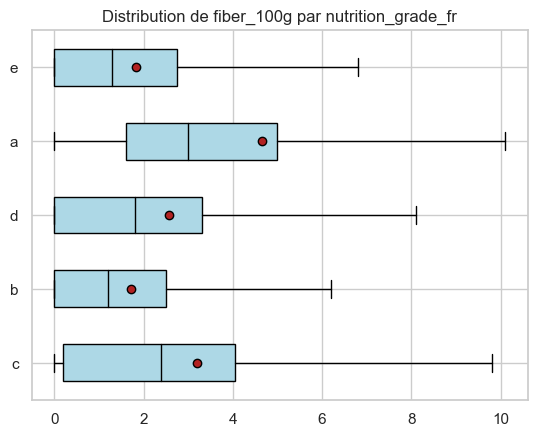

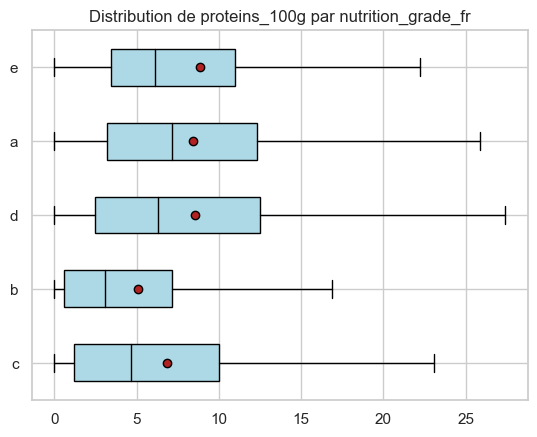

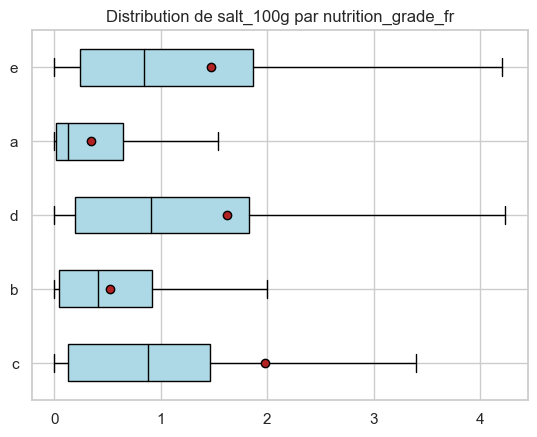

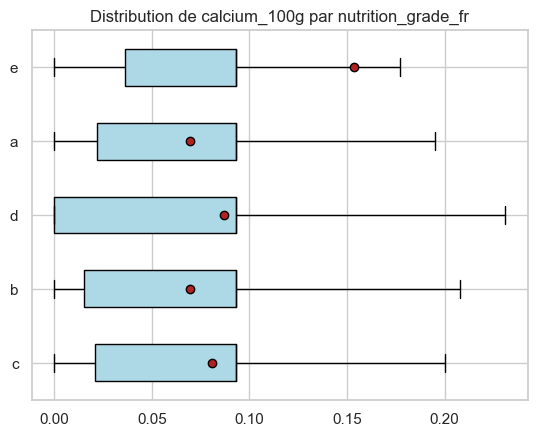

In [171]:
for col in quantitative_columns:
    Y = col # quantitative
    modalites = sous_echantillon[X].unique()
    groupes = []
    for m in modalites:
        groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])

    #graphiques
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'firebrick'}
    
    plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
    plt.title(f'Distribution de {col} par nutrition_grade_fr')
    plt.show()

Les points rouges au milieu de chaque boîte à moustaches représentent la moyenne des valeurs.

<h6> c.  Modélisation :</h6>

Nous allons modéliser la relation entre "nutrition_grade_fr" et chaque variable quantitative.

In [172]:
# Fonction pour calculer eta carré
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

# Listes pour stocker les résultats
cols = []
f_values = []
p_values = []
eta_sqs = []

# Pour chaque variable quantitative, on effectue une ANOVA
for col in quantitative_columns:
    Y = col
    formula = f"{Y} ~ C({X})"
    model = ols(formula, data=sous_echantillon).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)
    eta_sq = eta_squared(sous_echantillon[X], sous_echantillon[Y])
    
    # Ajouter les résultats aux listes
    cols.append(col)
    f_values.append(aov_table['F'][0])
    p_values.append(aov_table['PR(>F)'][0])
    eta_sqs.append(eta_sq)

# Créer un DataFrame à partir des listes
results_df = pd.DataFrame({
    'Variable': cols,
    'F-value': f_values,
    'p-value': p_values,
    'η²': eta_sqs
})


results_df

,Variable,F-value,p-value,η²
0,energy_100g,779.555763,0.000000e+00,0.220055
1,saturated_fat_100g,1961.564290,0.000000e+00,0.415184
2,carbohydrates_100g,246.945621,1.633366e-203,0.082043
3,sugars_100g,667.253570,0.000000e+00,0.194520
4,fiber_100g,163.939512,1.447051e-136,0.056011
5,proteins_100g,79.080307,2.924041e-66,0.027825
6,salt_100g,51.866599,2.393066e-43,0.018426
7,calcium_100g,134.393174,2.680211e-112,0.046384


<h6> d.  Évaluez le modèle :</h6>

Pour évaluer la qualité du modèle et déterminer si les variables sont corrélées, nous utilisons le rapport de corrélation η² (eta carré). Ce rapport est calculé en comparant la variation interclasse (SCE) à la variation totale (SCT).

In [173]:
# Variables
X = "nutrition_grade_fr" # qualitative

# Fonction pour calculer eta carré
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

# Liste pour stocker les résultats
eta_sqs = []
correlations = []

# Pour chaque variable quantitative, calculez eta carré
for col in quantitative_columns:
    Y = col
    eta_sq = eta_squared(sous_echantillon[X], sous_echantillon[Y])
    eta_sqs.append(eta_sq)
    
    # Déterminer si la variable est corrélée ou non
    if eta_sq > 0.14:
        correlations.append("Forte")
    elif eta_sq > 0.06:
        correlations.append("Modérée")
    else:
        correlations.append("Faible")

# Créer un DataFrame pour afficher les résultats
eta_df = pd.DataFrame({
    'Variable': quantitative_columns,
    'η²': eta_sqs,
    'Corrélation': correlations
})


eta_df

,Variable,η²,Corrélation
0,energy_100g,0.220055,Forte
1,saturated_fat_100g,0.415184,Forte
2,carbohydrates_100g,0.082043,Modérée
3,sugars_100g,0.194520,Forte
4,fiber_100g,0.056011,Faible
5,proteins_100g,0.027825,Faible
6,salt_100g,0.018426,Faible
7,calcium_100g,0.046384,Faible


Le résultat donne une valeur entre 0 et 1, représentant le degré de corrélation entre la variable qualitative et la variable quantitative.

<h1>07 - Présentation des résultats</h1>

<a href=''> Présentation </a> 